In [105]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import warnings
from joblib import dump
import matplotlib.pyplot as plt
import numpy as np

warnings.filterwarnings("ignore")

In [106]:
df = pd.read_csv("cleaned_data.csv")
df.shape

(1547649, 15)

In [107]:
df["date"] = pd.to_datetime(df["date"])
df["year"] = df["date"].dt.year
df["month"] = df["date"].dt.month
df["day"] = df["date"].dt.day
df["hour"] = df["date"].dt.hour
df["minute"] = df["date"].dt.minute
df["day_of_week"] = df["date"].dt.dayofweek

In [108]:
df.head()

,lon,lat,id,temp,feels_like,weather_description,wind_speed,humidity,curr_time,number,...,available_bike_stands,last_update,date,time,year,month,day,hour,minute,day_of_week
0,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,1,...,4,2024-02-21 18:56:44,2024-02-21,19:00:00,2024,2,21,0,0,2
1,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,2,...,16,2024-02-21 18:56:08,2024-02-21,19:00:00,2024,2,21,0,0,2
2,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,3,...,12,2024-02-21 18:57:07,2024-02-21,19:00:00,2024,2,21,0,0,2
3,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,4,...,15,2024-02-21 18:57:57,2024-02-21,19:00:00,2024,2,21,0,0,2
4,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,5,...,3,2024-02-21 18:57:12,2024-02-21,19:00:00,2024,2,21,0,0,2


Number of predictions for station 1: 2816
Station 1 - Mean Squared Error: 4.964303977272728, R^2 Score: 0.9405653934259217
67.89772727272727
--------------------------------------------------
Covariance matrix for station 1:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.970308   11.764736    0.966087  -7.375398   0.0  0.358483   
feels_like   11.764736   16.415002   -0.201984  -6.548048   0.0  0.487181   
wind_speed    0.966087   -0.201984    3.415988  -3.456967   0.0 -0.007053   
humidity     -7.375398   -6.548048   -3.456967  85.765120   0.0  0.539068   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.358483    0.487181   -0.007053   0.539068   0.0  0.297203   
day           2.869614    4.510610   -1.650242 -14.864046   0.0 -3.567241   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_o

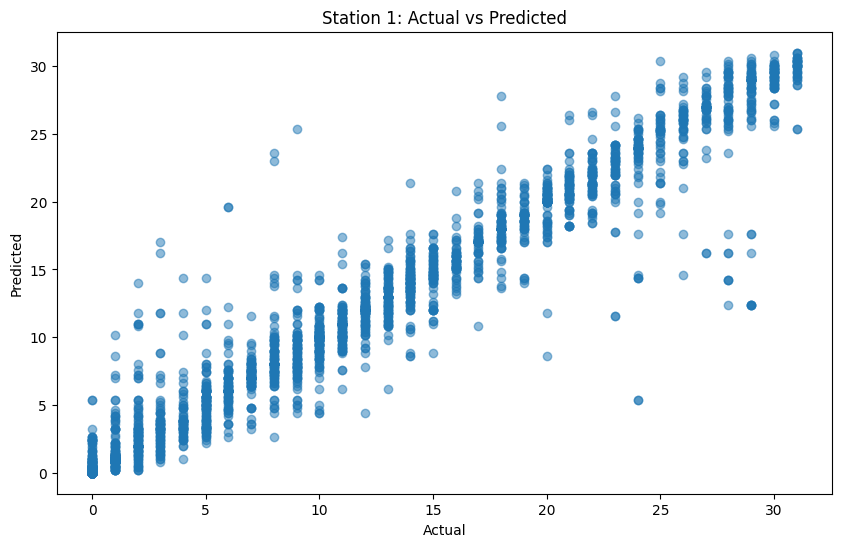

Number of predictions for station 2: 2566
Station 2 - Mean Squared Error: 2.256866718628215, R^2 Score: 0.9028945479691858
78.64380358534684
--------------------------------------------------
Covariance matrix for station 2:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.003511   11.805631    1.028650  -7.296319   0.0  0.356844   
feels_like   11.805631   16.449109   -0.090980  -6.493846   0.0  0.492048   
wind_speed    1.028650   -0.090980    3.393512  -3.493697   0.0 -0.015075   
humidity     -7.296319   -6.493846   -3.493697  84.550380   0.0  0.613864   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.356844    0.492048   -0.015075   0.613864   0.0  0.293233   
day           3.085015    4.698030   -1.482845 -16.275308   0.0 -3.537055   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_o

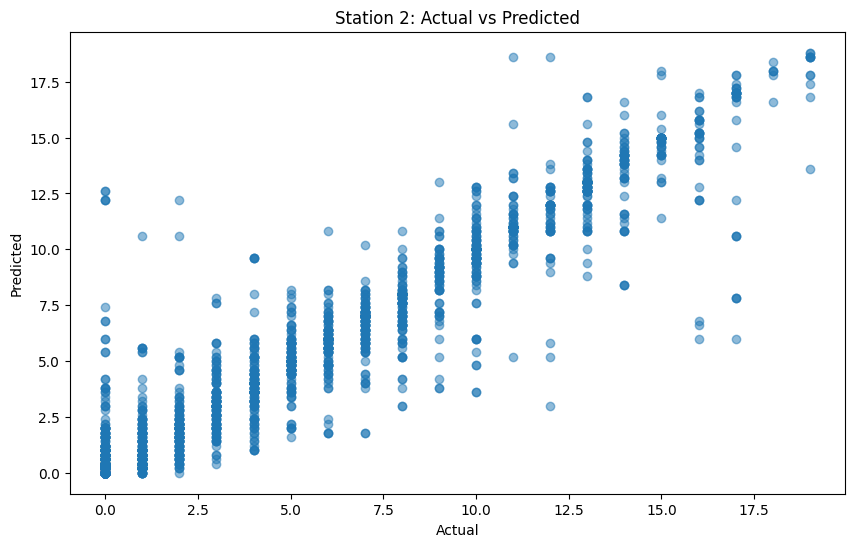

Number of predictions for station 3: 2741
Station 3 - Mean Squared Error: 1.6903174024078802, R^2 Score: 0.9443625962394759
72.78365560014593
--------------------------------------------------
Covariance matrix for station 3:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.991830   11.788140    1.065248  -6.868182   0.0  0.361036   
feels_like   11.788140   16.425907   -0.030213  -5.938718   0.0  0.497075   
wind_speed    1.065248   -0.030213    3.360109  -3.338212   0.0 -0.018358   
humidity     -6.868182   -5.938718   -3.338212  82.594191   0.0  0.518484   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.361036    0.497075   -0.018358   0.518484   0.0  0.297611   
day           2.522818    3.978399   -1.437214 -13.846398   0.0 -3.577496   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

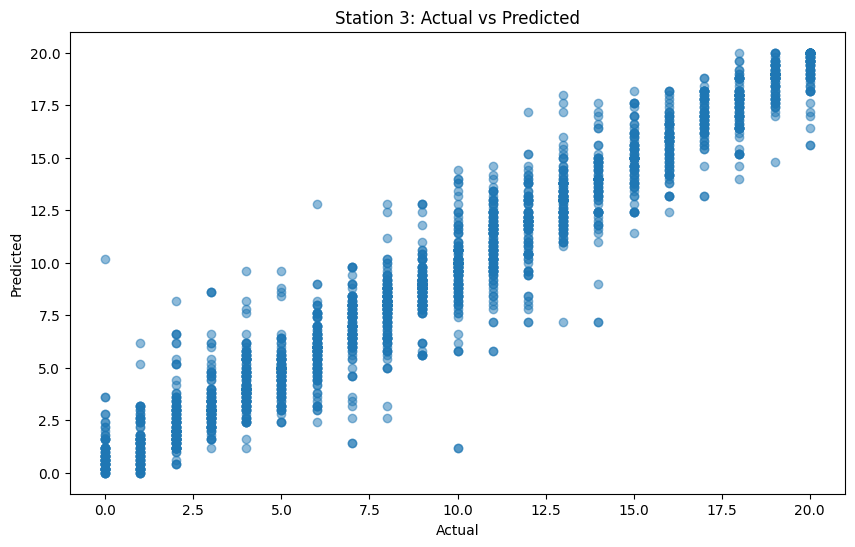

Number of predictions for station 4: 2605
Station 4 - Mean Squared Error: 1.8314318618042227, R^2 Score: 0.9414811137449749
81.34357005758157
--------------------------------------------------
Covariance matrix for station 4:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.925511   11.618679    1.096142  -7.120462   0.0  0.355810   
feels_like   11.618679   16.103619   -0.015454  -6.198603   0.0  0.496778   
wind_speed    1.096142   -0.015454    3.329583  -3.703457   0.0 -0.023306   
humidity     -7.120462   -6.198603   -3.703457  82.389323   0.0  0.605714   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.355810    0.496778   -0.023306   0.605714   0.0  0.297263   
day           2.728662    4.018062   -1.113770 -15.692577   0.0 -3.597019   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

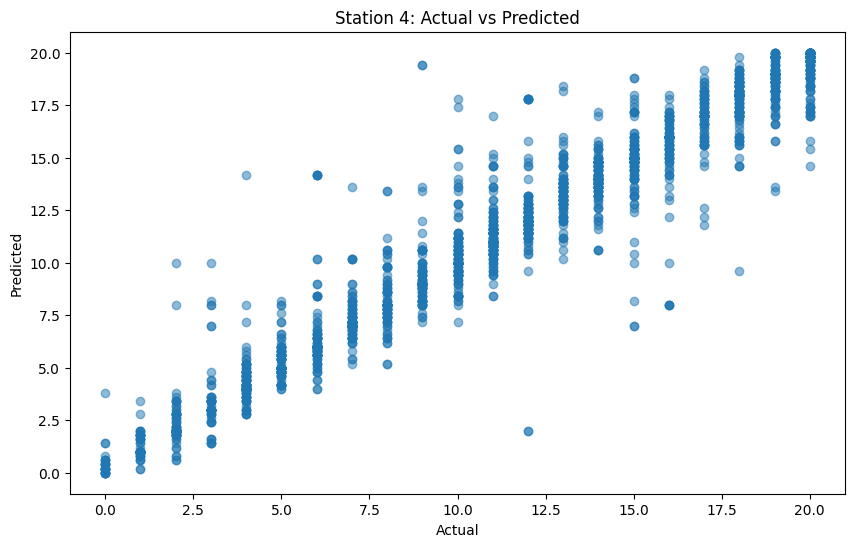

Number of predictions for station 5: 3110
Station 5 - Mean Squared Error: 13.281299035369774, R^2 Score: 0.9305137901666268
58.77813504823152
--------------------------------------------------
Covariance matrix for station 5:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.999624   11.796555    1.024394  -6.941772   0.0  0.383430   
feels_like   11.796555   16.440672   -0.108128  -6.073496   0.0  0.525968   
wind_speed    1.024394   -0.108128    3.413781  -3.200210   0.0 -0.018292   
humidity     -6.941772   -6.073496   -3.200210  83.336273   0.0  0.574041   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.383430    0.525968   -0.018292   0.574041   0.0  0.299737   
day           2.187218    3.506728   -1.420175 -14.405333   0.0 -3.603137   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

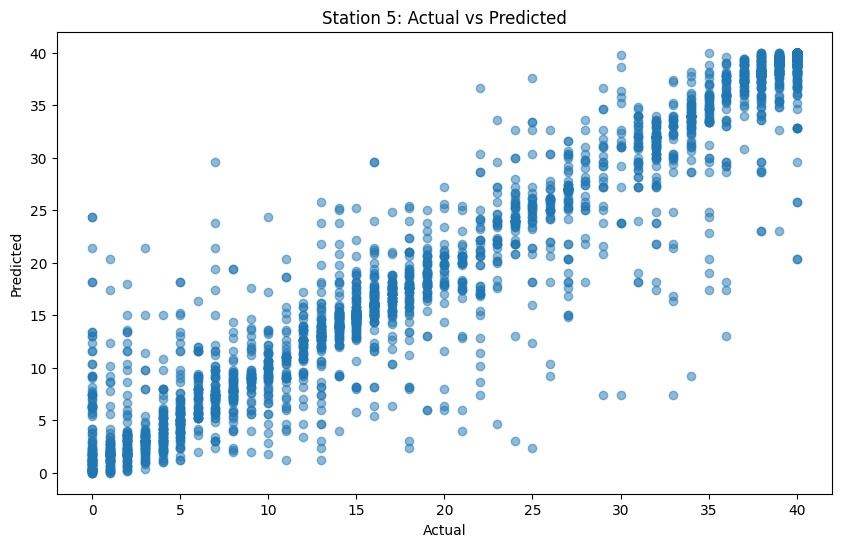

Number of predictions for station 6: 2651
Station 6 - Mean Squared Error: 1.2876197661259903, R^2 Score: 0.9515625058277746
76.46171256129762
--------------------------------------------------
Covariance matrix for station 6:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.941433   11.733365    1.000846  -7.140169   0.0  0.347972   
feels_like   11.733365   16.364145   -0.117859  -6.363593   0.0  0.475879   
wind_speed    1.000846   -0.117859    3.398427  -3.255301   0.0 -0.009032   
humidity     -7.140169   -6.363593   -3.255301  84.022704   0.0  0.578339   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.347972    0.475879   -0.009032   0.578339   0.0  0.298459   
day           2.947452    4.584303   -1.585021 -15.473630   0.0 -3.593412   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

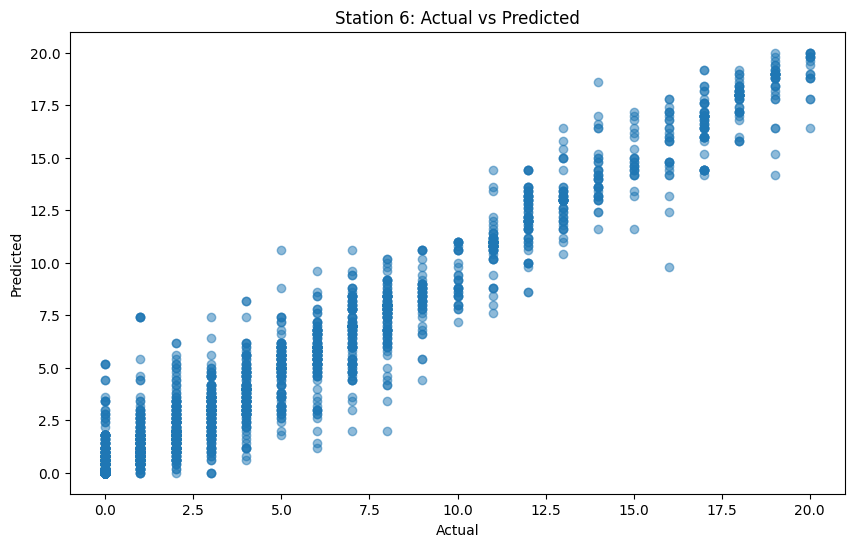

Number of predictions for station 7: 2564
Station 7 - Mean Squared Error: 3.6592823712948523, R^2 Score: 0.9256296727336905
79.52418096723869
--------------------------------------------------
Covariance matrix for station 7:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.048750   11.859943    1.009862  -7.212636   0.0  0.343931   
feels_like   11.859943   16.515012   -0.102586  -6.398784   0.0  0.475771   
wind_speed    1.009862   -0.102586    3.332748  -3.379318   0.0 -0.016614   
humidity     -7.212636   -6.398784   -3.379318  84.624919   0.0  0.627164   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.343931    0.475771   -0.016614   0.627164   0.0  0.295133   
day           3.200480    4.775382   -1.332678 -16.237736   0.0 -3.563192   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

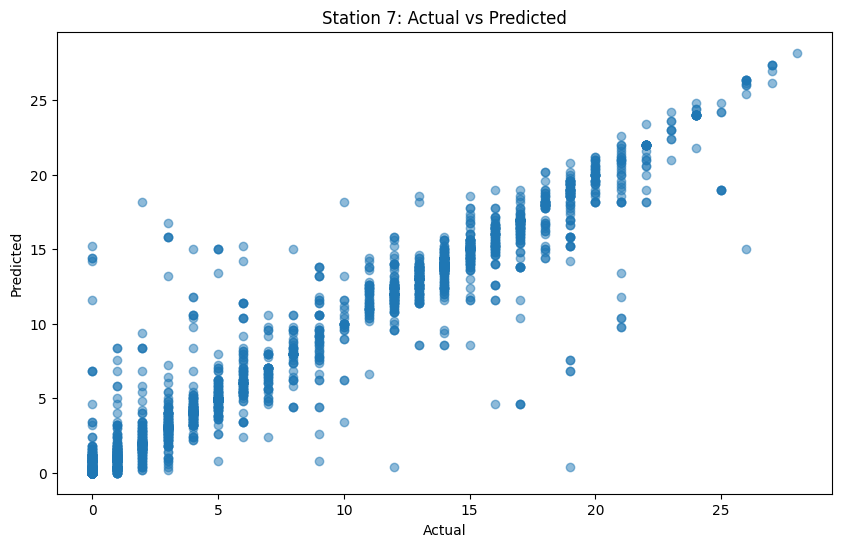

Number of predictions for station 8: 2946
Station 8 - Mean Squared Error: 6.013944331296674, R^2 Score: 0.9064150688640935
62.186014935505774
--------------------------------------------------
Covariance matrix for station 8:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.081697   11.913205    1.053327  -6.714776   0.0  0.376588   
feels_like   11.913205   16.612922   -0.065327  -5.711400   0.0  0.519682   
wind_speed    1.053327   -0.065327    3.405534  -3.254192   0.0 -0.016079   
humidity     -6.714776   -5.711400   -3.254192  84.431472   0.0  0.564735   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.376588    0.519682   -0.016079   0.564735   0.0  0.296154   
day           2.153117    3.443350   -1.462788 -13.963202   0.0 -3.533316   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

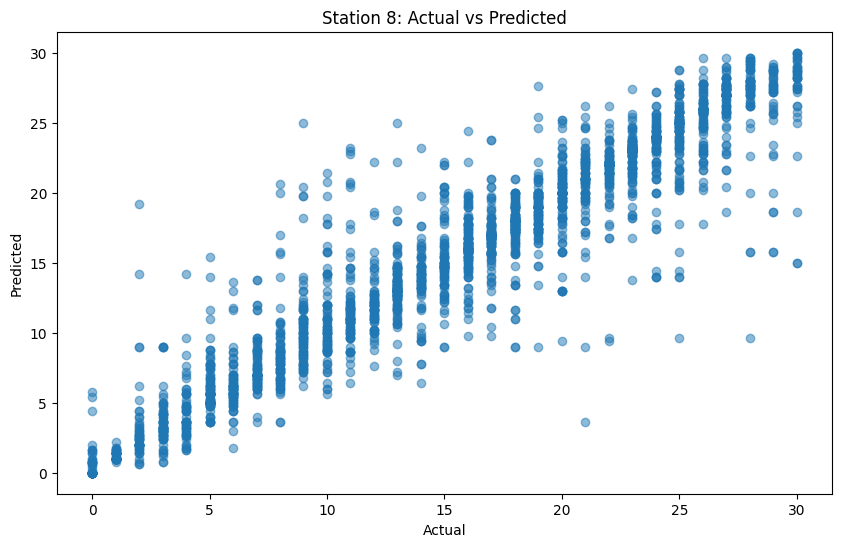

Number of predictions for station 9: 3075
Station 9 - Mean Squared Error: 5.957593495934959, R^2 Score: 0.8856622010882361
60.390243902439025
--------------------------------------------------
Covariance matrix for station 9:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.045265   11.865466    0.969531  -7.163708   0.0  0.364249   
feels_like   11.865466   16.529682   -0.166878  -6.217076   0.0  0.493747   
wind_speed    0.969531   -0.166878    3.394068  -3.414343   0.0 -0.011394   
humidity     -7.163708   -6.217076   -3.414343  85.838378   0.0  0.521714   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.364249    0.493747   -0.011394   0.521714   0.0  0.296442   
day           2.736093    4.360760   -1.669286 -14.392871   0.0 -3.535030   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

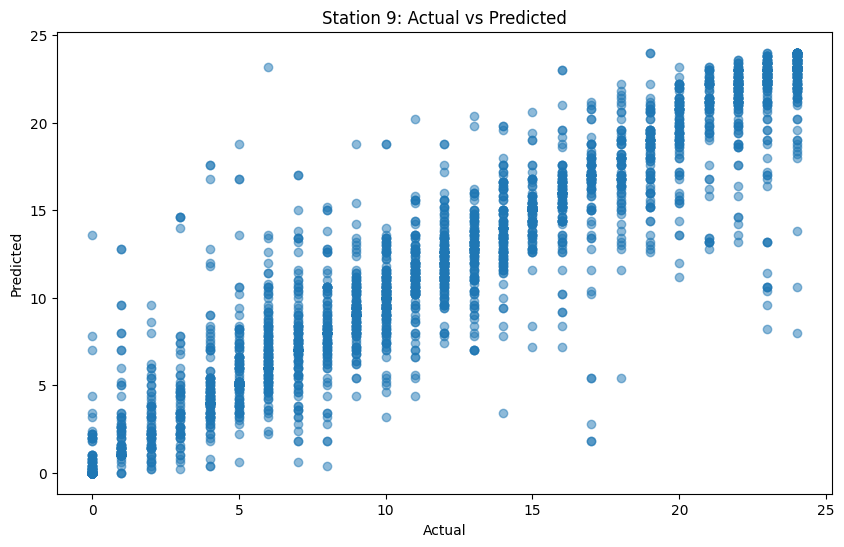

Number of predictions for station 10: 2826
Station 10 - Mean Squared Error: 2.0081670205237088, R^2 Score: 0.8790391118441573
73.7791932059448
--------------------------------------------------
Covariance matrix for station 10:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.004208   11.781522    1.066316  -6.973674   0.0  0.352091   
feels_like   11.781522   16.396153   -0.053846  -6.099776   0.0  0.479161   
wind_speed    1.066316   -0.053846    3.395007  -3.342503   0.0 -0.013576   
humidity     -6.973674   -6.099776   -3.342503  82.322119   0.0  0.530554   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.352091    0.479161   -0.013576   0.530554   0.0  0.295764   
day           3.009560    4.595833   -1.428925 -15.022500   0.0 -3.534504   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

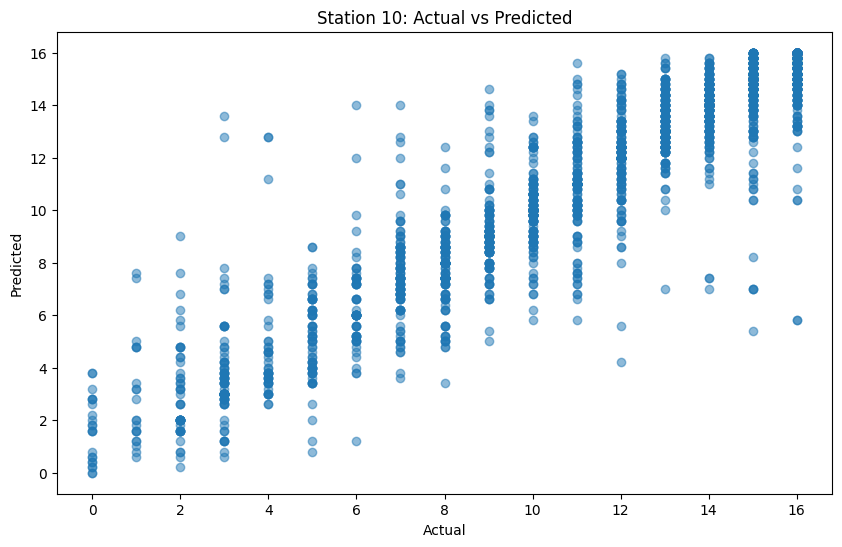

Number of predictions for station 11: 2504
Station 11 - Mean Squared Error: 2.329408945686901, R^2 Score: 0.9596995947234457
81.90894568690096
--------------------------------------------------
Covariance matrix for station 11:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.034727   11.855905    0.976678  -7.067686   0.0  0.337792   
feels_like   11.855905   16.529827   -0.167624  -6.256659   0.0  0.463476   
wind_speed    0.976678   -0.167624    3.397949  -3.121812   0.0 -0.005523   
humidity     -7.067686   -6.256659   -3.121812  85.819960   0.0  0.597897   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.337792    0.463476   -0.005523   0.597897   0.0  0.295174   
day           3.004469    4.702361   -1.799015 -15.343662   0.0 -3.561557   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

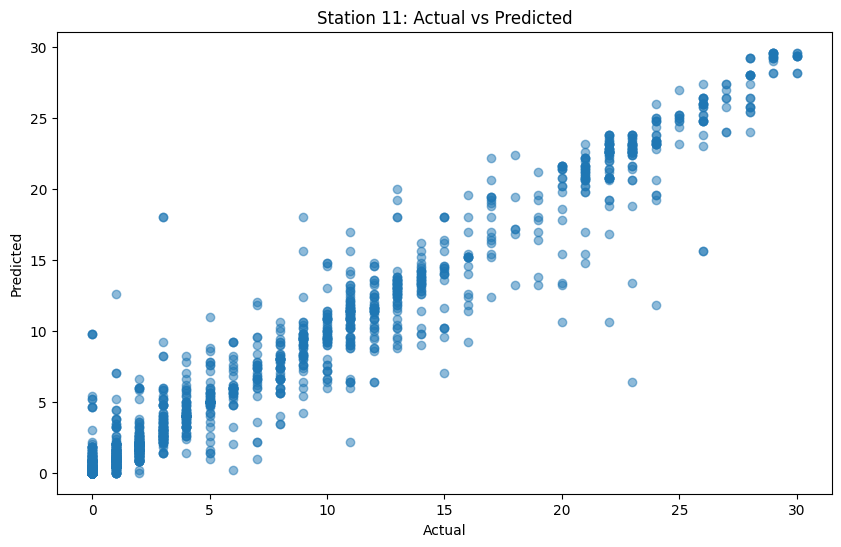

Number of predictions for station 12: 2538
Station 12 - Mean Squared Error: 1.608274231678487, R^2 Score: 0.9459068452154266
81.87549251379038
--------------------------------------------------
Covariance matrix for station 12:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.042230   11.862598    1.049396  -6.943080   0.0  0.351798   
feels_like   11.862598   16.534457   -0.054730  -6.054841   0.0  0.480147   
wind_speed    1.049396   -0.054730    3.389837  -3.413298   0.0 -0.010701   
humidity     -6.943080   -6.054841   -3.413298  82.937155   0.0  0.558964   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.351798    0.480147   -0.010701   0.558964   0.0  0.297296   
day           3.138582    4.828073   -1.513960 -15.544670   0.0 -3.583123   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

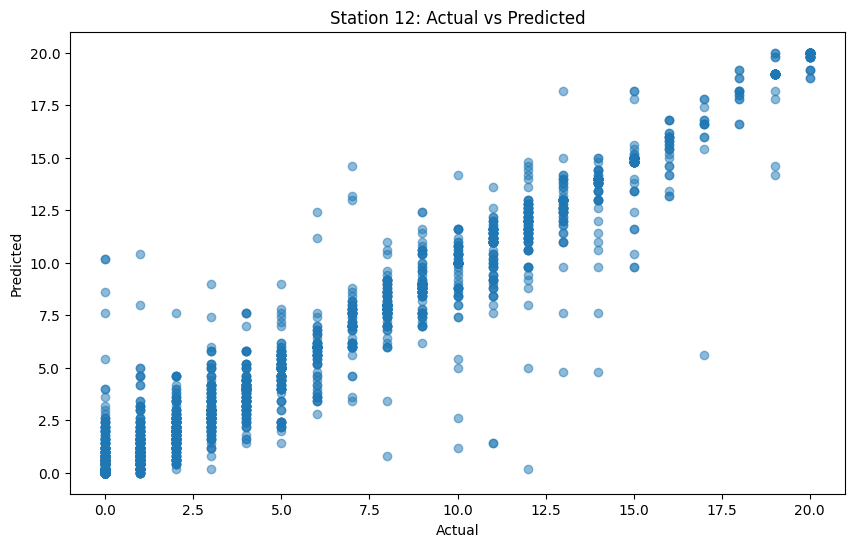

Number of predictions for station 13: 2509
Station 13 - Mean Squared Error: 1.2569469908330013, R^2 Score: 0.9507490821281441
83.93782383419689
--------------------------------------------------
Covariance matrix for station 13:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.110707   11.927160    1.050829  -6.931207   0.0  0.351030   
feels_like   11.927160   16.594496   -0.072001  -5.985442   0.0  0.482809   
wind_speed    1.050829   -0.072001    3.375786  -3.457708   0.0 -0.012974   
humidity     -6.931207   -5.985442   -3.457708  82.707882   0.0  0.616448   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.351030    0.482809   -0.012974   0.616448   0.0  0.297406   
day           2.869827    4.342188   -1.397432 -15.838755   0.0 -3.626399   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

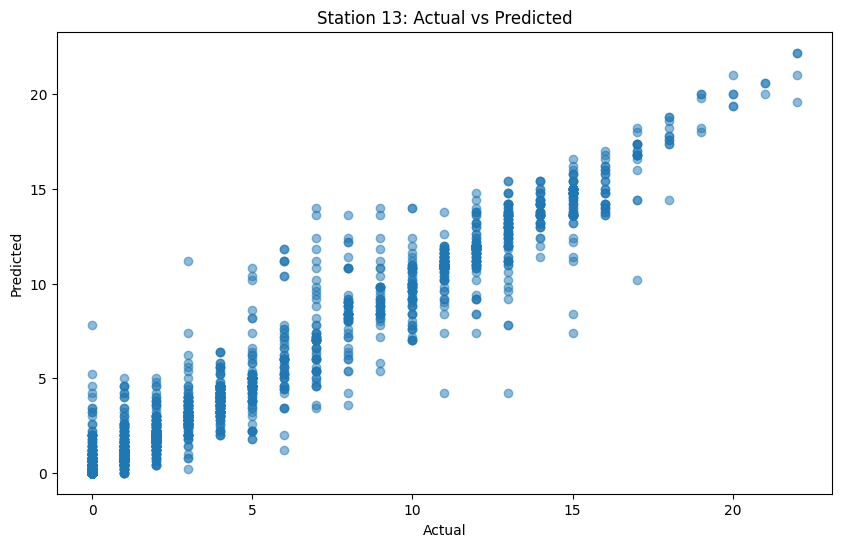

Number of predictions for station 14: 2950
Station 14 - Mean Squared Error: 7.646305084745762, R^2 Score: 0.8917539050029812
59.96610169491525
--------------------------------------------------
Covariance matrix for station 14:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.093109   11.925310    1.046985  -6.976413   0.0  0.374780   
feels_like   11.925310   16.611653   -0.063394  -6.093341   0.0  0.510521   
wind_speed    1.046985   -0.063394    3.371417  -3.351491   0.0 -0.009788   
humidity     -6.976413   -6.093341   -3.351491  83.575536   0.0  0.533092   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.374780    0.510521   -0.009788   0.533092   0.0  0.297514   
day           2.352215    3.815961   -1.570614 -13.455665   0.0 -3.541243   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

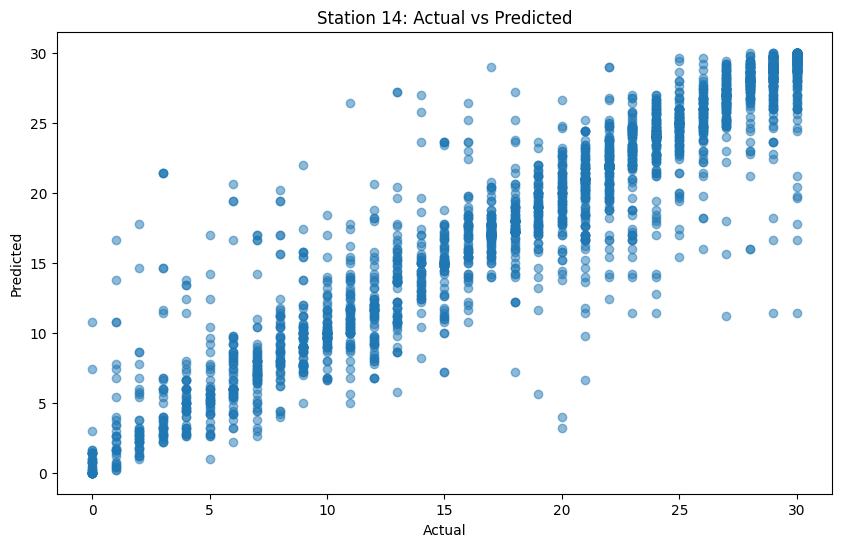

Number of predictions for station 15: 2593
Station 15 - Mean Squared Error: 0.7862553027381411, R^2 Score: 0.9370317984550512
84.14963362900116
--------------------------------------------------
Covariance matrix for station 15:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.043261   11.797845    1.109317  -6.835726   0.0  0.357253   
feels_like   11.797845   16.368742    0.002077  -5.916197   0.0  0.490714   
wind_speed    1.109317    0.002077    3.400811  -3.570992   0.0 -0.016639   
humidity     -6.835726   -5.916197   -3.570992  80.725232   0.0  0.596567   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.357253    0.490714   -0.016639   0.596567   0.0  0.295349   
day           2.603863    4.053640   -1.457300 -14.311654   0.0 -3.551245   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

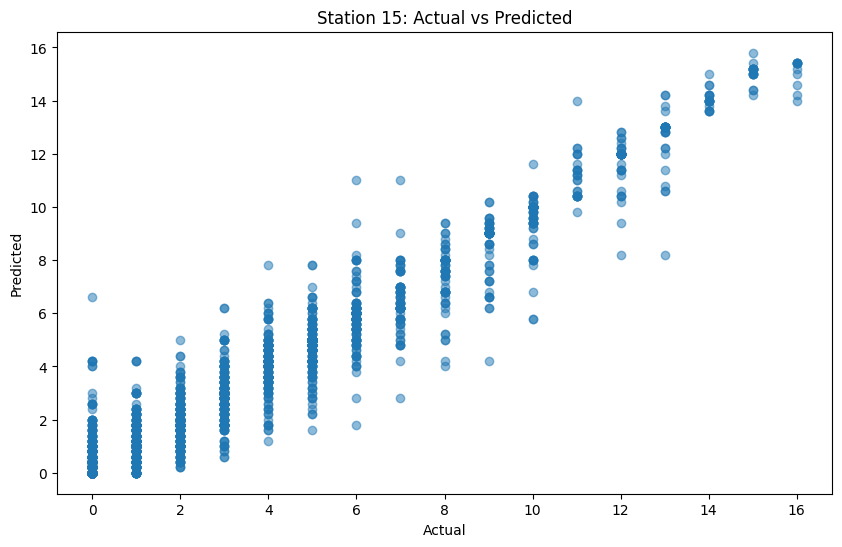

Number of predictions for station 16: 2668
Station 16 - Mean Squared Error: 1.8886356821589205, R^2 Score: 0.9152549506131188
78.11094452773614
--------------------------------------------------
Covariance matrix for station 16:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.087469   11.949475    0.967649  -7.126520   0.0  0.363739   
feels_like   11.949475   16.684736   -0.167134  -6.269077   0.0  0.501981   
wind_speed    0.967649   -0.167134    3.407455  -3.303816   0.0 -0.021116   
humidity     -7.126520   -6.269077   -3.303816  84.693159   0.0  0.596376   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.363739    0.501981   -0.021116   0.596376   0.0  0.297561   
day           2.735940    4.207588   -1.408622 -15.617653   0.0 -3.572321   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

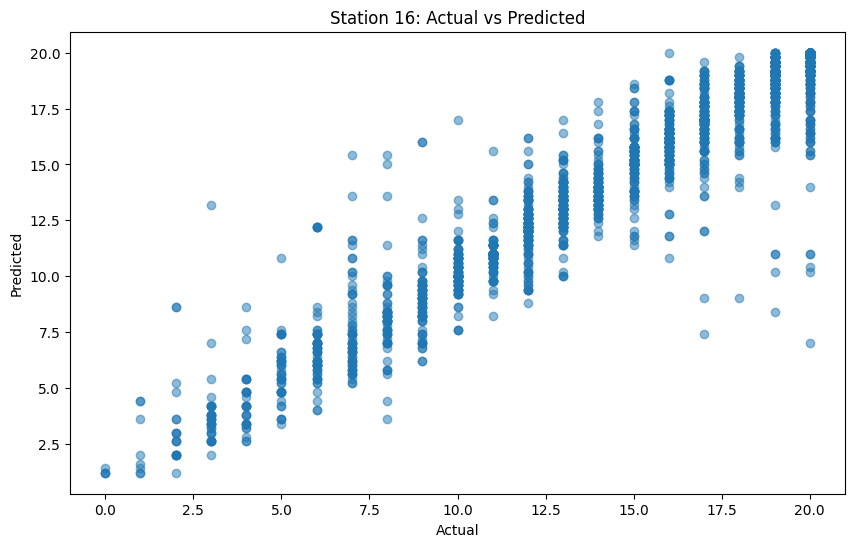

Number of predictions for station 17: 2552
Station 17 - Mean Squared Error: 0.5868181818181818, R^2 Score: 0.9603111817152002
86.95141065830721
--------------------------------------------------
Covariance matrix for station 17:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.177247   12.014356    1.044192  -7.268738   0.0  0.363665   
feels_like   12.014356   16.684424   -0.038621  -6.420564   0.0  0.498338   
wind_speed    1.044192   -0.038621    3.302408  -3.353275   0.0 -0.013224   
humidity     -7.268738   -6.420564   -3.353275  85.084263   0.0  0.578900   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.363665    0.498338   -0.013224   0.578900   0.0  0.298496   
day           2.906451    4.448348   -1.458724 -15.899098   0.0 -3.584485   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

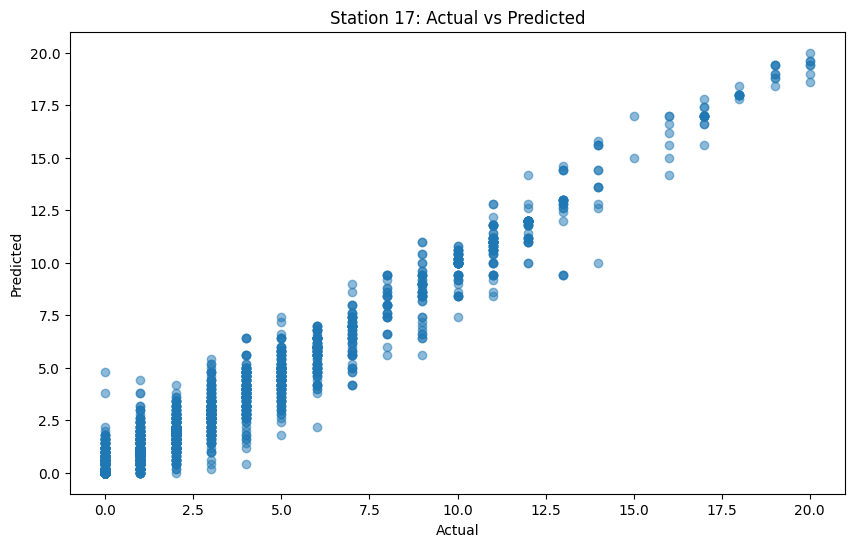

Number of predictions for station 18: 2952
Station 18 - Mean Squared Error: 3.730379403794038, R^2 Score: 0.9494242236479605
66.15853658536585
--------------------------------------------------
Covariance matrix for station 18:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.073796   11.899976    1.022623  -6.870755   0.0  0.377947   
feels_like   11.899976   16.577746   -0.091754  -6.011684   0.0  0.511702   
wind_speed    1.022623   -0.091754    3.369298  -3.226254   0.0 -0.013455   
humidity     -6.870755   -6.011684   -3.226254  81.983715   0.0  0.549191   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.377947    0.511702   -0.013455   0.549191   0.0  0.297610   
day           2.158259    3.546950   -1.444379 -13.647365   0.0 -3.582168   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

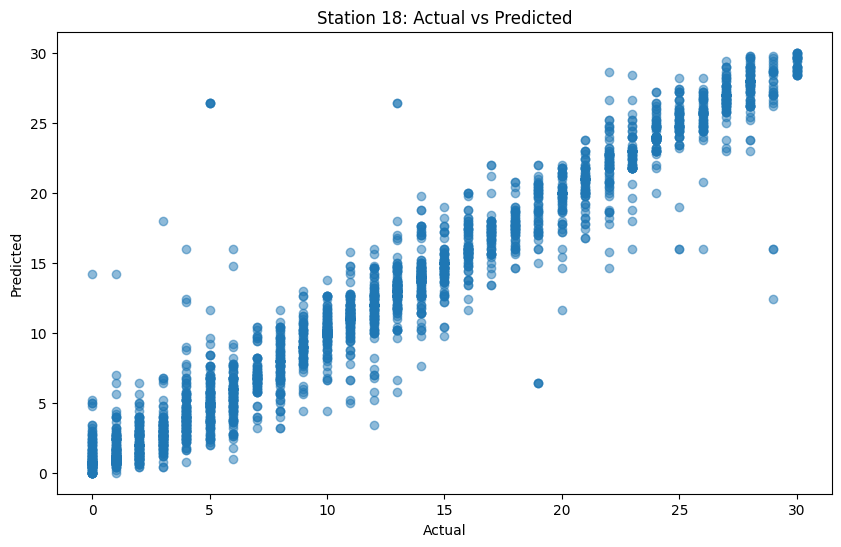

Number of predictions for station 19: 3032
Station 19 - Mean Squared Error: 5.8274538258575195, R^2 Score: 0.9426739088119279
60.71899736147758
--------------------------------------------------
Covariance matrix for station 19:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.952115   11.735194    0.990752  -6.761141   0.0  0.362417   
feels_like   11.735194   16.365636   -0.158041  -5.741150   0.0  0.497909   
wind_speed    0.990752   -0.158041    3.394123  -3.391213   0.0 -0.015844   
humidity     -6.761141   -5.741150   -3.391213  83.943672   0.0  0.642539   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.362417    0.497909   -0.015844   0.642539   0.0  0.295213   
day           2.567933    3.915929   -1.324164 -15.755724   0.0 -3.524918   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

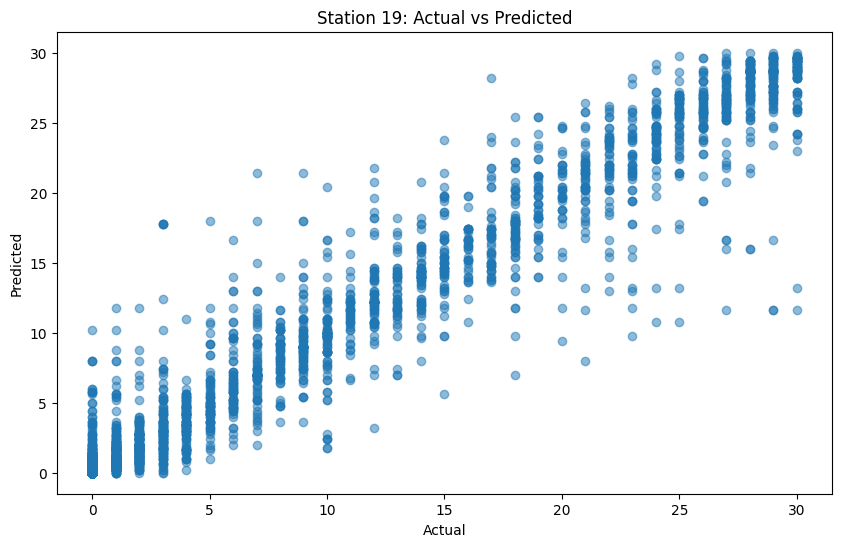

Number of predictions for station 20: 2655
Station 20 - Mean Squared Error: 4.041220338983051, R^2 Score: 0.9516041166333954
74.12429378531074
--------------------------------------------------
Covariance matrix for station 20:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.988802   11.745980    1.050340  -6.854192   0.0  0.350628   
feels_like   11.745980   16.316567   -0.060430  -5.927070   0.0  0.487687   
wind_speed    1.050340   -0.060430    3.348453  -3.486726   0.0 -0.023042   
humidity     -6.854192   -5.927070   -3.486726  82.651059   0.0  0.650887   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.350628    0.487687   -0.023042   0.650887   0.0  0.294924   
day           2.650833    3.966623   -1.293088 -15.269643   0.0 -3.541409   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

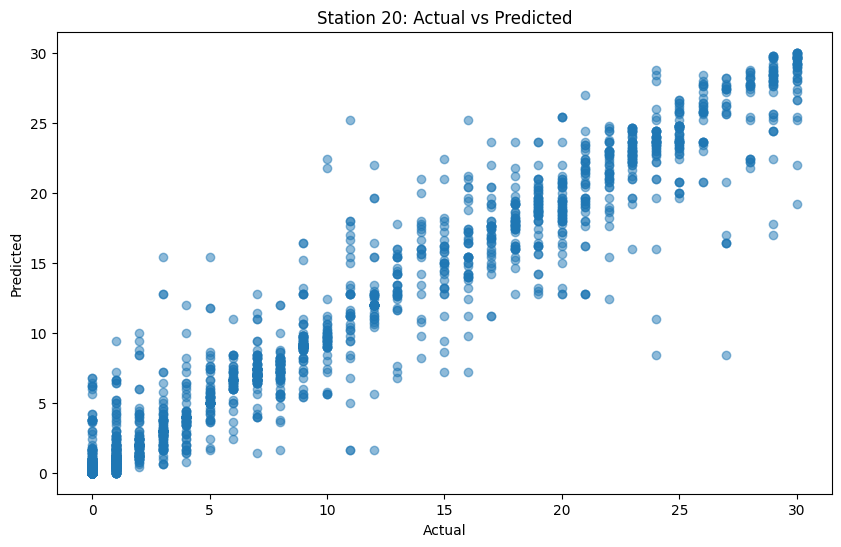

Number of predictions for station 21: 2840
Station 21 - Mean Squared Error: 5.390056338028169, R^2 Score: 0.9264015761134093
64.11971830985915
--------------------------------------------------
Covariance matrix for station 21:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.082649   11.944446    0.974107  -7.138241   0.0  0.351382   
feels_like   11.944446   16.673600   -0.144606  -6.229339   0.0  0.480978   
wind_speed    0.974107   -0.144606    3.345639  -3.273783   0.0 -0.010033   
humidity     -7.138241   -6.229339   -3.273783  86.343297   0.0  0.584171   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.351382    0.480978   -0.010033   0.584171   0.0  0.297576   
day           2.961641    4.541411   -1.457551 -15.961503   0.0 -3.572324   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

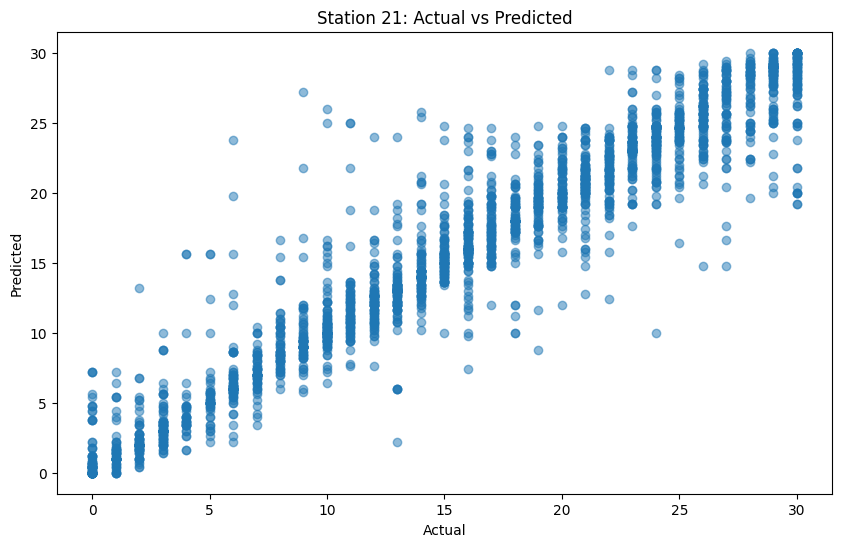

Number of predictions for station 22: 2866
Station 22 - Mean Squared Error: 2.2254989532449407, R^2 Score: 0.9359515524713096
69.95812979762735
--------------------------------------------------
Covariance matrix for station 22:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.154073   12.010265    1.026880  -6.996480   0.0  0.368062   
feels_like   12.010265   16.726685   -0.077623  -6.081580   0.0  0.505659   
wind_speed    1.026880   -0.077623    3.361010  -3.239530   0.0 -0.021836   
humidity     -6.996480   -6.081580   -3.239530  84.969776   0.0  0.521711   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.368062    0.505659   -0.021836   0.521711   0.0  0.295713   
day           2.633133    4.029183   -1.276851 -14.551863   0.0 -3.529746   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

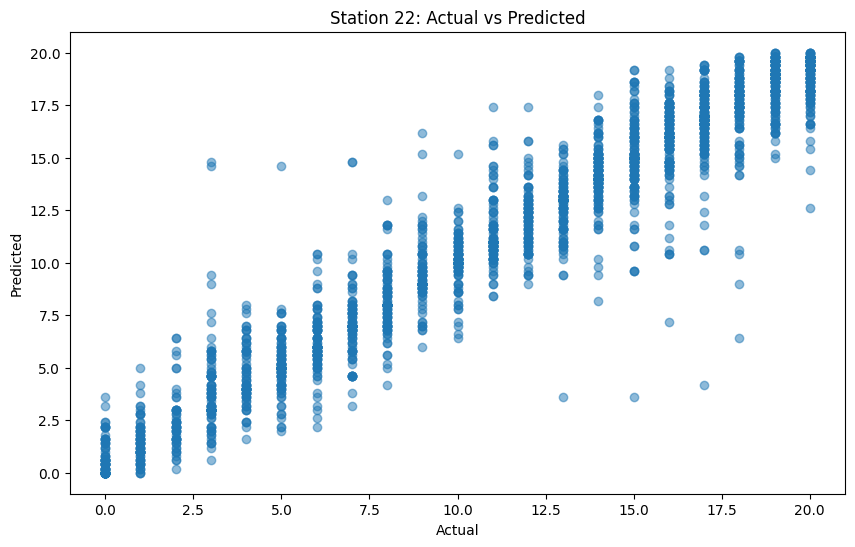

Number of predictions for station 23: 2882
Station 23 - Mean Squared Error: 5.435419847328244, R^2 Score: 0.912596221838511
67.52255378209576
--------------------------------------------------
Covariance matrix for station 23:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.945998   11.702311    1.039012  -7.111576   0.0  0.344499   
feels_like   11.702311   16.285722   -0.085218  -6.105472   0.0  0.474029   
wind_speed    1.039012   -0.085218    3.350805  -3.540848   0.0 -0.021214   
humidity     -7.111576   -6.105472   -3.540848  84.710159   0.0  0.587095   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.344499    0.474029   -0.021214   0.587095   0.0  0.296969   
day           2.601569    4.016055   -1.291145 -14.916172   0.0 -3.590961   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

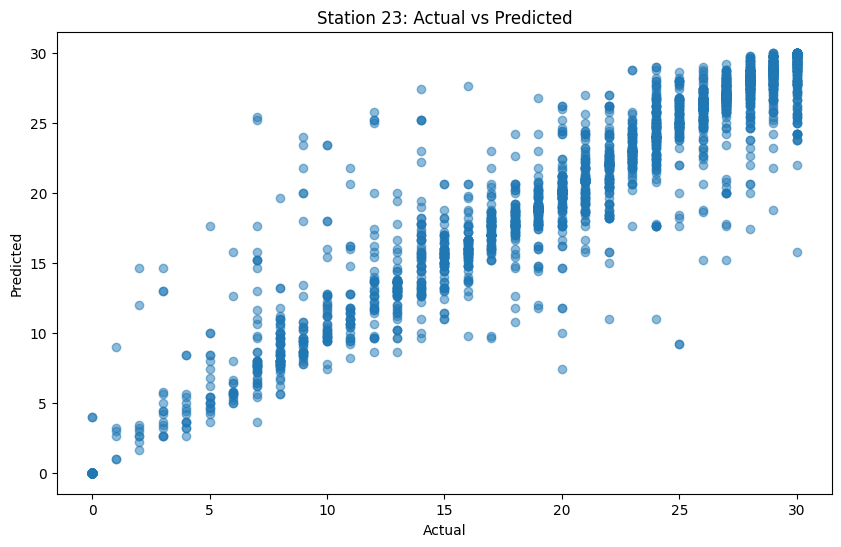

Number of predictions for station 24: 2987
Station 24 - Mean Squared Error: 3.65806494810847, R^2 Score: 0.8969762650994608
64.17810512219619
--------------------------------------------------
Covariance matrix for station 24:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.089287   11.906907    1.055530  -6.966421   0.0  0.370358   
feels_like   11.906907   16.566525   -0.042109  -6.027614   0.0  0.509928   
wind_speed    1.055530   -0.042109    3.356393  -3.523249   0.0 -0.025352   
humidity     -6.966421   -6.027614   -3.523249  83.073409   0.0  0.523521   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.370358    0.509928   -0.025352   0.523521   0.0  0.296176   
day           2.646744    4.003150   -1.191567 -14.091553   0.0 -3.523242   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

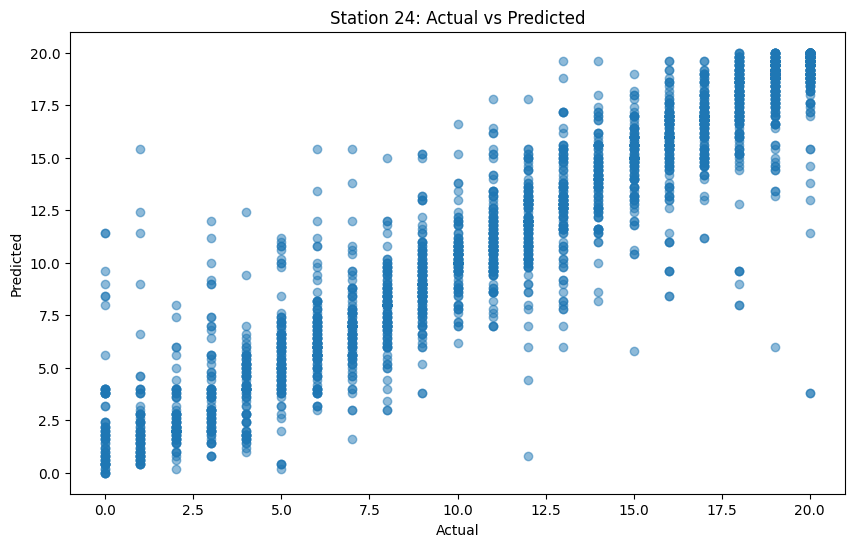

Number of predictions for station 25: 2612
Station 25 - Mean Squared Error: 1.5947166921898928, R^2 Score: 0.9646079661977701
80.55130168453293
--------------------------------------------------
Covariance matrix for station 25:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.848975   11.549419    1.010411  -6.894105   0.0  0.351574   
feels_like   11.549419   16.041814   -0.115619  -5.901450   0.0  0.489558   
wind_speed    1.010411   -0.115619    3.322025  -3.564422   0.0 -0.030189   
humidity     -6.894105   -5.901450   -3.564422  83.343147   0.0  0.644388   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.351574    0.489558   -0.030189   0.644388   0.0  0.296969   
day           2.570478    3.856204   -1.204899 -15.347373   0.0 -3.552553   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

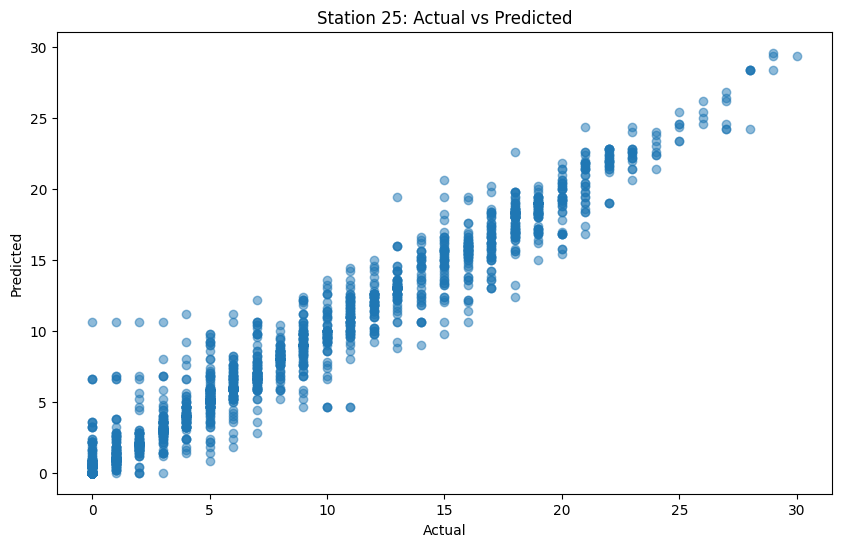

Number of predictions for station 26: 2673
Station 26 - Mean Squared Error: 1.4780246913580248, R^2 Score: 0.9546924455393908
74.8971193415638
--------------------------------------------------
Covariance matrix for station 26:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.070925   11.903510    1.022630  -7.116916   0.0  0.354833   
feels_like   11.903510   16.603607   -0.109150  -6.176619   0.0  0.487717   
wind_speed    1.022630   -0.109150    3.414240  -3.412291   0.0 -0.013825   
humidity     -7.116916   -6.176619   -3.412291  85.362575   0.0  0.548515   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.354833    0.487717   -0.013825   0.548515   0.0  0.295146   
day           2.860500    4.444491   -1.523447 -15.685160   0.0 -3.582142   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

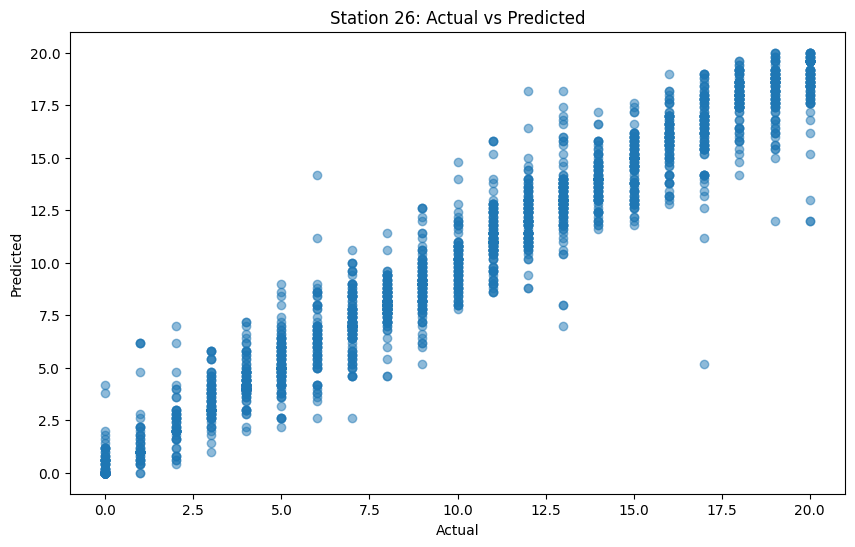

Number of predictions for station 27: 2788
Station 27 - Mean Squared Error: 2.181305595408895, R^2 Score: 0.942269276898747
68.65136298421808
--------------------------------------------------
Covariance matrix for station 27:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.142188   11.994487    1.040441  -6.909808   0.0  0.371565   
feels_like   11.994487   16.715689   -0.082693  -5.889793   0.0  0.508815   
wind_speed    1.040441   -0.082693    3.386897  -3.484924   0.0 -0.015019   
humidity     -6.909808   -5.889793   -3.484924  84.689992   0.0  0.506138   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.371565    0.508815   -0.015019   0.506138   0.0  0.295743   
day           2.454450    3.827852   -1.305317 -14.561411   0.0 -3.544529   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

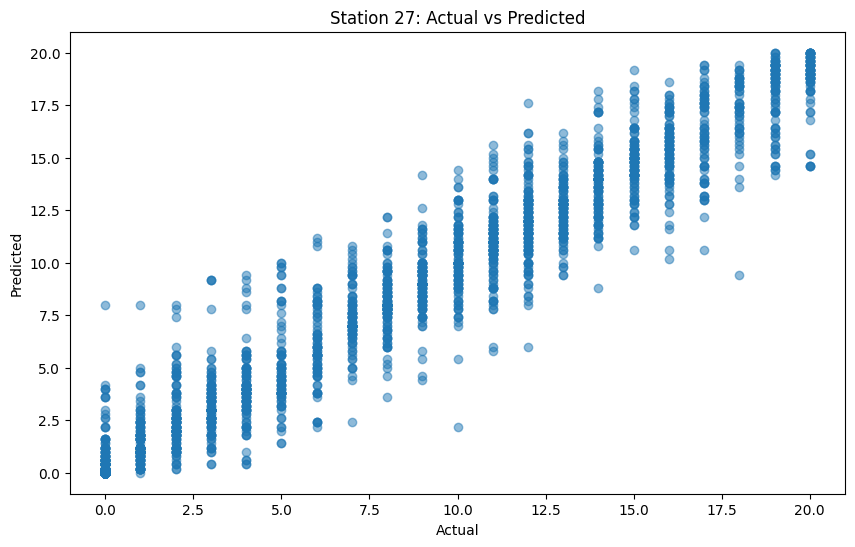

Number of predictions for station 28: 2730
Station 28 - Mean Squared Error: 8.603223443223444, R^2 Score: 0.824345530788277
62.1978021978022
--------------------------------------------------
Covariance matrix for station 28:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.942562   11.690529    1.088237  -6.926963   0.0  0.347698   
feels_like   11.690529   16.270905   -0.031982  -5.846757   0.0  0.479048   
wind_speed    1.088237   -0.031982    3.395447  -3.692625   0.0 -0.017757   
humidity     -6.926963   -5.846757   -3.692625  83.661246   0.0  0.530618   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.347698    0.479048   -0.017757   0.530618   0.0  0.295276   
day           2.908893    4.376170   -1.233313 -14.138506   0.0 -3.593062   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_

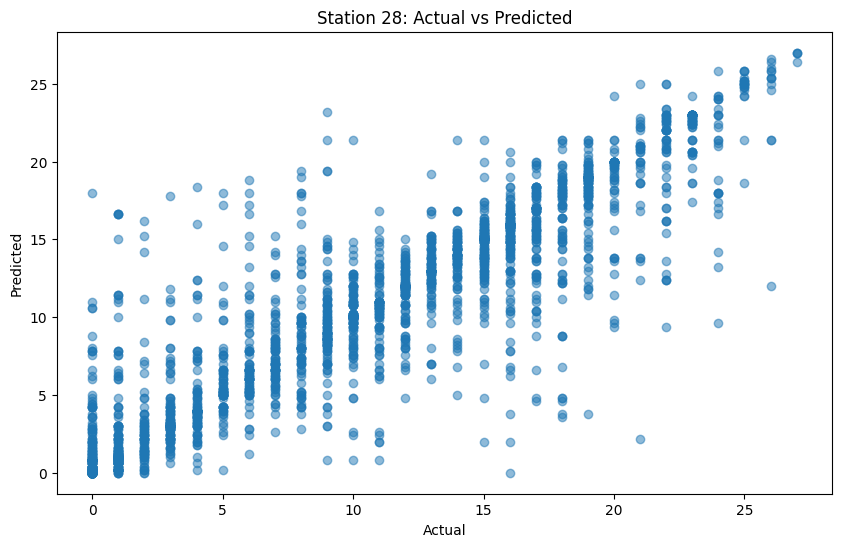

Number of predictions for station 29: 2945
Station 29 - Mean Squared Error: 3.3955314091680817, R^2 Score: 0.9519897179600065
67.67402376910016
--------------------------------------------------
Covariance matrix for station 29:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.944954   11.713610    1.005452  -7.151430   0.0  0.366029   
feels_like   11.713610   16.314743   -0.134455  -6.288639   0.0  0.498285   
wind_speed    1.005452   -0.134455    3.388708  -3.435633   0.0 -0.009628   
humidity     -7.151430   -6.288639   -3.435633  84.397655   0.0  0.500397   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.366029    0.498285   -0.009628   0.500397   0.0  0.294604   
day           2.684415    4.200853   -1.538816 -14.621644   0.0 -3.549959   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

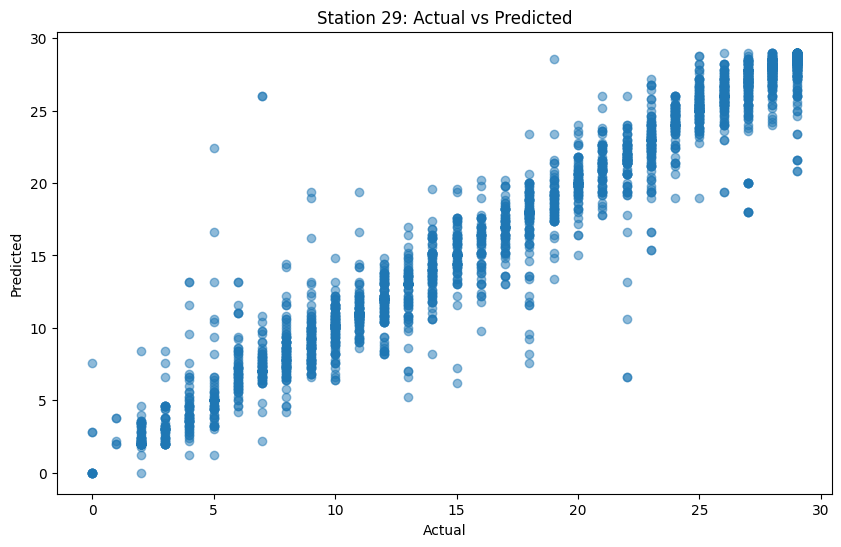

Number of predictions for station 30: 2491
Station 30 - Mean Squared Error: 0.6823765556001606, R^2 Score: 0.9458474742618943
89.96386993175432
--------------------------------------------------
Covariance matrix for station 30:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.898218   11.599183    1.074926  -6.791640   0.0  0.354690   
feels_like   11.599183   16.125531   -0.078482  -5.822250   0.0  0.497866   
wind_speed    1.074926   -0.078482    3.396386  -3.579308   0.0 -0.039756   
humidity     -6.791640   -5.822250   -3.579308  80.131288   0.0  0.569456   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.354690    0.497866   -0.039756   0.569456   0.0  0.305893   
day           2.695320    3.951370   -1.030640 -15.076630   0.0 -3.700765   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

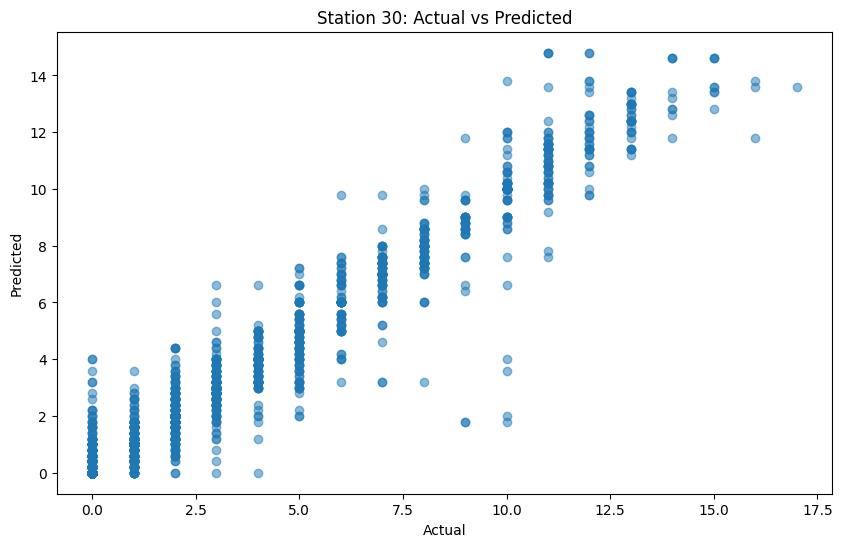

Number of predictions for station 31: 2882
Station 31 - Mean Squared Error: 4.325843164469119, R^2 Score: 0.8702998985523471
65.96113809854268
--------------------------------------------------
Covariance matrix for station 31:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.043835   11.912135    0.964076  -7.136945   0.0  0.355130   
feels_like   11.912135   16.667326   -0.189894  -6.292037   0.0  0.477073   
wind_speed    0.964076   -0.189894    3.453472  -3.327615   0.0 -0.000714   
humidity     -7.136945   -6.292037   -3.327615  84.065967   0.0  0.517846   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.355130    0.477073   -0.000714   0.517846   0.0  0.298190   
day           3.018538    4.846408   -1.788154 -14.712958   0.0 -3.604837   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

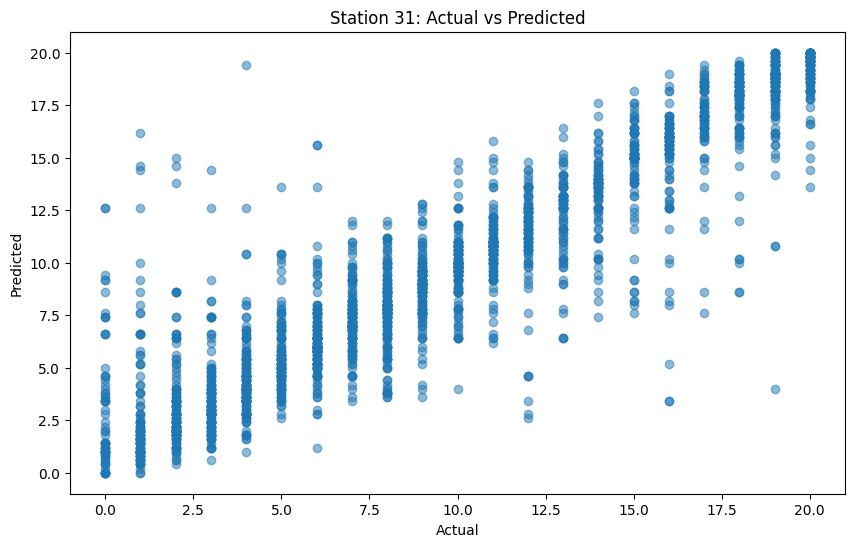

Number of predictions for station 32: 2969
Station 32 - Mean Squared Error: 5.832118558437183, R^2 Score: 0.9048135541917548
60.39070394072078
--------------------------------------------------
Covariance matrix for station 32:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.023562   11.868822    0.983205  -6.633232   0.0  0.369225   
feels_like   11.868822   16.585620   -0.147509  -5.610918   0.0  0.504562   
wind_speed    0.983205   -0.147509    3.406684  -3.223689   0.0 -0.016833   
humidity     -6.633232   -5.610918   -3.223689  85.550699   0.0  0.570714   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.369225    0.504562   -0.016833   0.570714   0.0  0.297535   
day           2.315430    3.700770   -1.449468 -14.577750   0.0 -3.565468   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

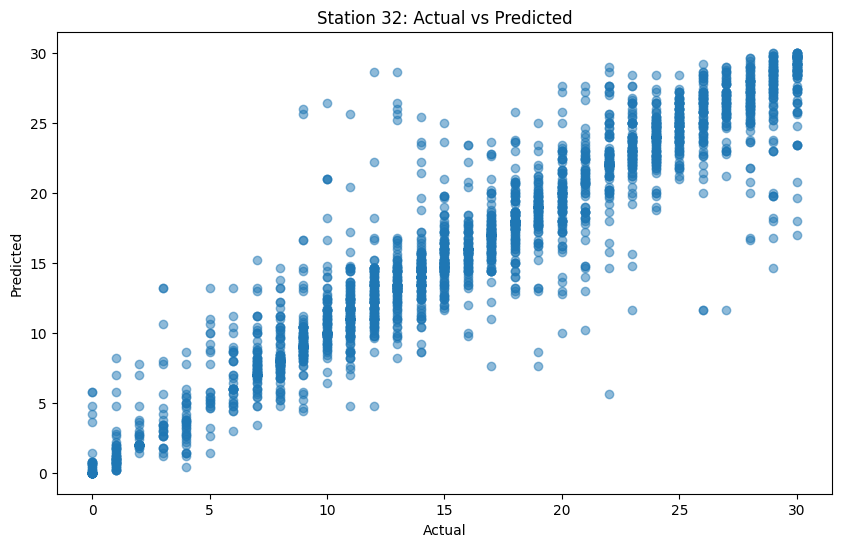

Number of predictions for station 33: 3164
Station 33 - Mean Squared Error: 7.968723135271808, R^2 Score: 0.7474058870248628
54.64601769911505
--------------------------------------------------
Covariance matrix for station 33:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.924194   11.682086    0.968512  -7.375986   0.0  0.372183   
feels_like   11.682086   16.268165   -0.181766  -6.527229   0.0  0.513278   
wind_speed    0.968512   -0.181766    3.370160  -3.466009   0.0 -0.023128   
humidity     -7.375986   -6.527229   -3.466009  86.114978   0.0  0.555088   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.372183    0.513278   -0.023128   0.555088   0.0  0.298197   
day           2.540782    3.956394   -1.380837 -15.019079   0.0 -3.553417   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

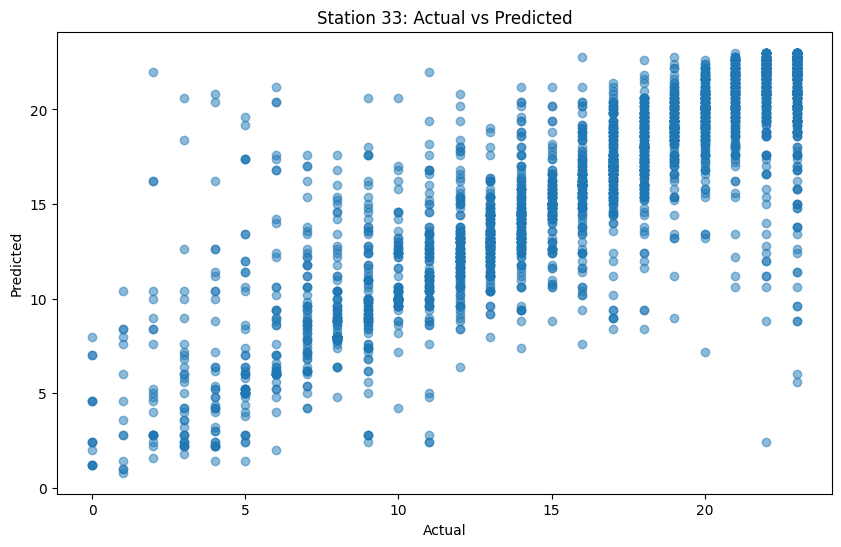

Number of predictions for station 34: 3060
Station 34 - Mean Squared Error: 10.569333333333333, R^2 Score: 0.8927209693756852
54.31372549019608
--------------------------------------------------
Covariance matrix for station 34:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.021732   11.808881    1.055320  -6.894896   0.0  0.388475   
feels_like   11.808881   16.439911   -0.065378  -5.990495   0.0  0.532094   
wind_speed    1.055320   -0.065378    3.409952  -3.360437   0.0 -0.014483   
humidity     -6.894896   -5.990495   -3.360437  81.870425   0.0  0.512455   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.388475    0.532094   -0.014483   0.512455   0.0  0.296428   
day           2.409592    3.764622   -1.414533 -14.224386   0.0 -3.537507   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

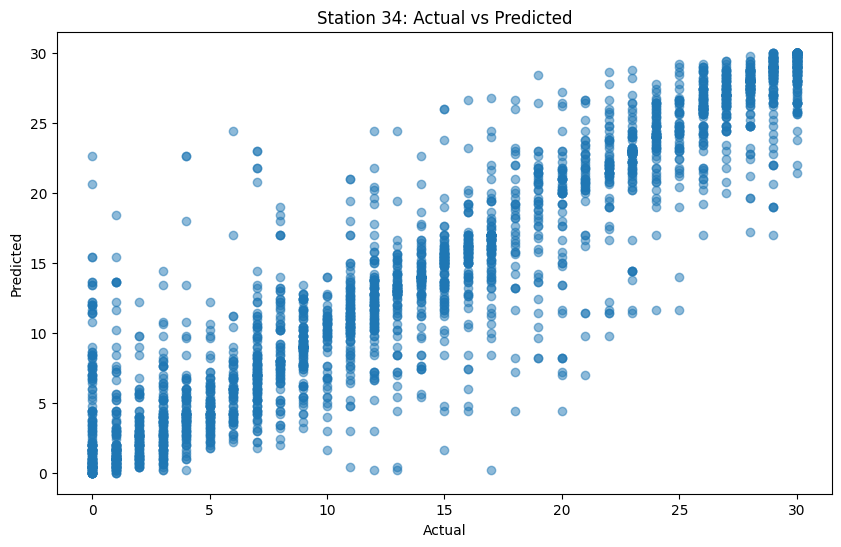

Number of predictions for station 35: 2942
Station 35 - Mean Squared Error: 2.18974847042828, R^2 Score: 0.9753716191595776
67.81101291638342
--------------------------------------------------
Covariance matrix for station 35:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.895456   11.623666    1.084718  -7.034969   0.0  0.382813   
feels_like   11.623666   16.166721   -0.017250  -6.116625   0.0  0.523815   
wind_speed    1.084718   -0.017250    3.368884  -3.551953   0.0 -0.015851   
humidity     -7.034969   -6.116625   -3.551953  83.231602   0.0  0.520772   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.382813    0.523815   -0.015851   0.520772   0.0  0.297701   
day           2.237952    3.460768   -1.190797 -14.553472   0.0 -3.536279   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

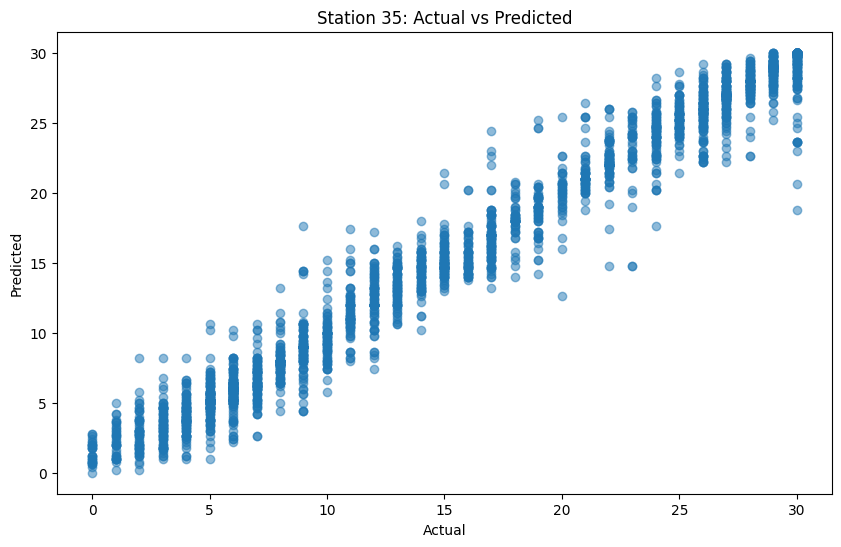

Number of predictions for station 36: 2722
Station 36 - Mean Squared Error: 2.6747097722263042, R^2 Score: 0.9664623107469763
75.05510653930934
--------------------------------------------------
Covariance matrix for station 36:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.963734   11.728913    1.038257  -7.290741   0.0  0.372700   
feels_like   11.728913   16.325092   -0.082275  -6.431868   0.0  0.499396   
wind_speed    1.038257   -0.082275    3.359652  -3.343115   0.0  0.005022   
humidity     -7.290741   -6.431868   -3.343115  85.095693   0.0  0.538938   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.372700    0.499396    0.005022   0.538938   0.0  0.297326   
day           2.276590    3.754601   -1.679174 -14.559033   0.0 -3.571093   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

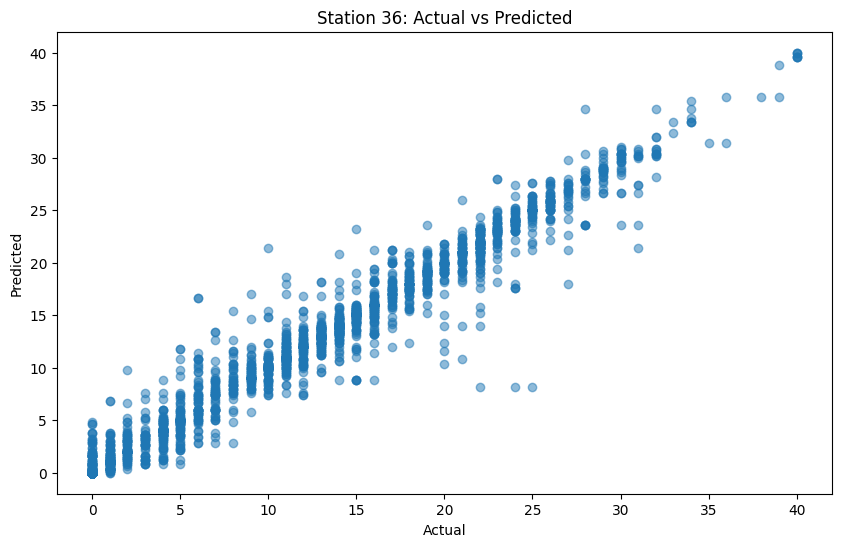

Number of predictions for station 37: 2427
Station 37 - Mean Squared Error: 0.5336135146271116, R^2 Score: 0.9753222275738183
90.64688916357643
--------------------------------------------------
Covariance matrix for station 37:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.130292   11.992949    0.965978  -7.149243   0.0  0.365102   
feels_like   11.992949   16.712975   -0.152662  -6.364494   0.0  0.497790   
wind_speed    0.965978   -0.152662    3.360359  -3.218251   0.0 -0.004623   
humidity     -7.149243   -6.364494   -3.218251  85.123136   0.0  0.582251   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.365102    0.497790   -0.004623   0.582251   0.0  0.292664   
day           3.035788    4.731252   -1.735854 -15.521009   0.0 -3.522594   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

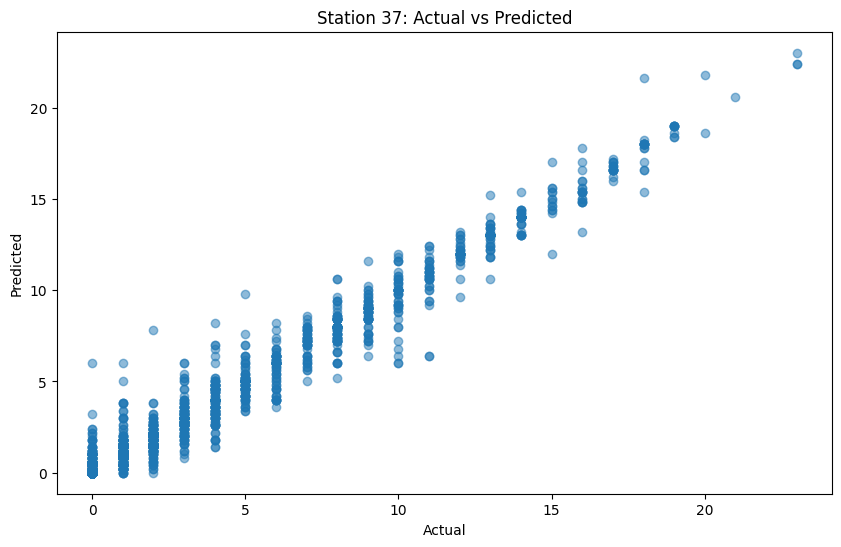

Number of predictions for station 38: 3064
Station 38 - Mean Squared Error: 2.9284203655352483, R^2 Score: 0.9595169557005173
66.677545691906
--------------------------------------------------
Covariance matrix for station 38:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.986760   11.774671    0.995848  -7.073382   0.0  0.360961   
feels_like   11.774671   16.391456   -0.122446  -6.246219   0.0  0.493742   
wind_speed    0.995848   -0.122446    3.355122  -3.330640   0.0 -0.014028   
humidity     -7.073382   -6.246219   -3.330640  83.916606   0.0  0.550024   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.360961    0.493742   -0.014028   0.550024   0.0  0.298158   
day           2.692021    4.172753   -1.472985 -14.778777   0.0 -3.557892   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

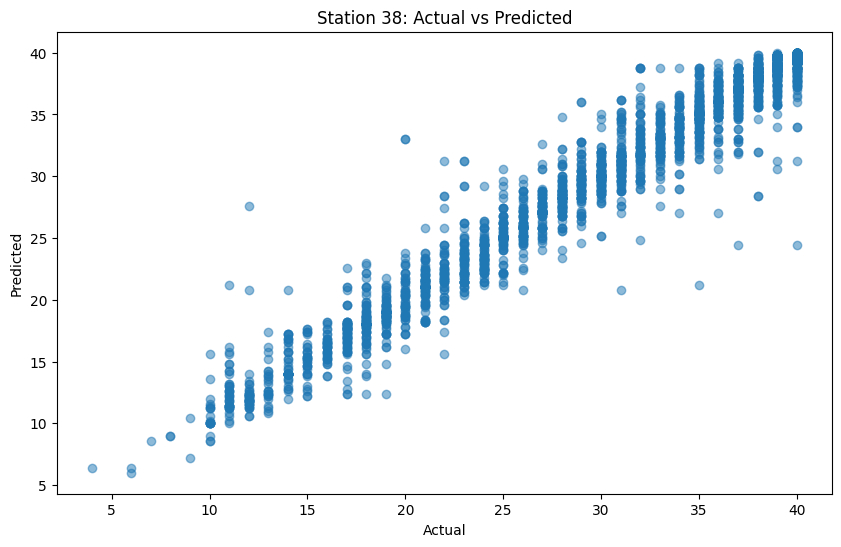

Number of predictions for station 39: 2967
Station 39 - Mean Squared Error: 2.210124705089316, R^2 Score: 0.8853005256977459
69.46410515672396
--------------------------------------------------
Covariance matrix for station 39:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.009992   11.842948    0.980123  -6.556635   0.0  0.371859   
feels_like   11.842948   16.535700   -0.141320  -5.504630   0.0  0.505712   
wind_speed    0.980123   -0.141320    3.361698  -3.214281   0.0 -0.013769   
humidity     -6.556635   -5.504630   -3.214281  83.886063   0.0  0.581868   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.371859    0.505712   -0.013769   0.581868   0.0  0.300123   
day           2.276008    3.649087   -1.461462 -14.111201   0.0 -3.577201   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

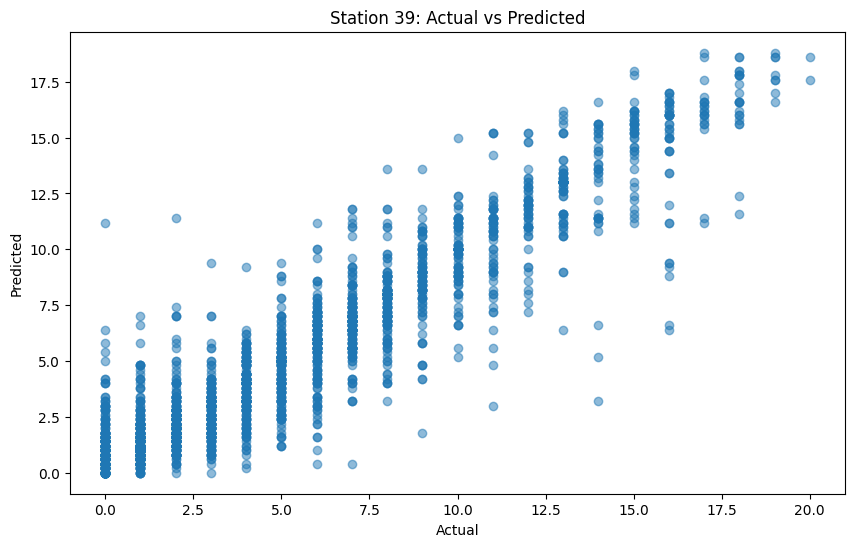

Number of predictions for station 40: 2874
Station 40 - Mean Squared Error: 2.9692832289491995, R^2 Score: 0.9266286599596475
66.84064022268615
--------------------------------------------------
Covariance matrix for station 40:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.021412   11.824556    1.021467  -7.144784   0.0  0.365576   
feels_like   11.824556   16.486623   -0.126978  -6.313721   0.0  0.498295   
wind_speed    1.021467   -0.126978    3.416192  -3.367266   0.0 -0.010445   
humidity     -7.144784   -6.313721   -3.367266  83.508680   0.0  0.525406   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.365576    0.498295   -0.010445   0.525406   0.0  0.300858   
day           2.797417    4.335689   -1.485875 -14.766036   0.0 -3.603788   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

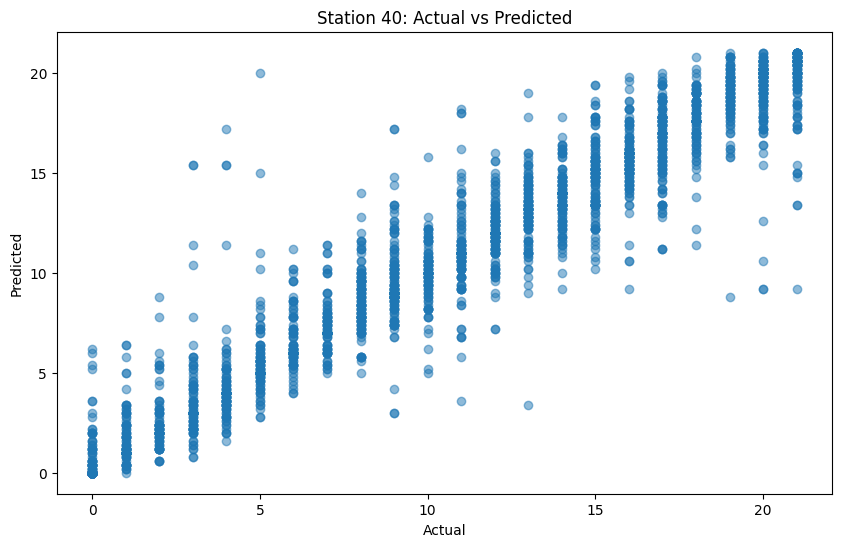

Number of predictions for station 41: 2549
Station 41 - Mean Squared Error: 2.530137308748529, R^2 Score: 0.9232685654521792
81.52216555511966
--------------------------------------------------
Covariance matrix for station 41:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.102191   11.960163    1.014762  -6.823464   0.0  0.354889   
feels_like   11.960163   16.693063   -0.107312  -5.984283   0.0  0.484892   
wind_speed    1.014762   -0.107312    3.395169  -3.133838   0.0 -0.007135   
humidity     -6.823464   -5.984283   -3.133838  82.995867   0.0  0.619839   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.354889    0.484892   -0.007135   0.619839   0.0  0.298126   
day           2.862489    4.437914   -1.555916 -16.201690   0.0 -3.601606   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

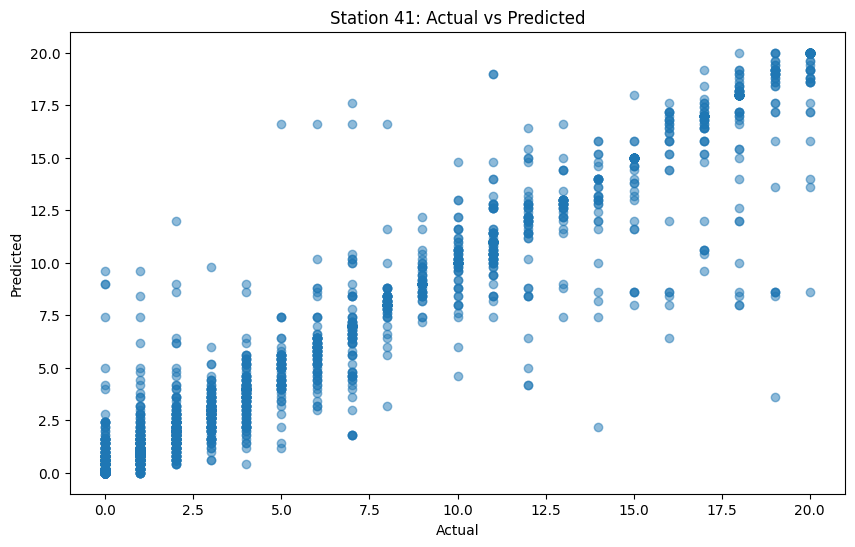

Number of predictions for station 42: 2840
Station 42 - Mean Squared Error: 2.0308309859154927, R^2 Score: 0.9695999147870332
70.77464788732394
--------------------------------------------------
Covariance matrix for station 42:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.001028   11.786628    1.015249  -7.174614   0.0  0.361738   
feels_like   11.786628   16.405964   -0.122022  -6.334303   0.0  0.495649   
wind_speed    1.015249   -0.122022    3.409687  -3.455240   0.0 -0.015918   
humidity     -7.174614   -6.334303   -3.455240  83.222861   0.0  0.533356   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.361738    0.495649   -0.015918   0.533356   0.0  0.294766   
day           2.801905    4.317072   -1.456682 -14.779990   0.0 -3.535600   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

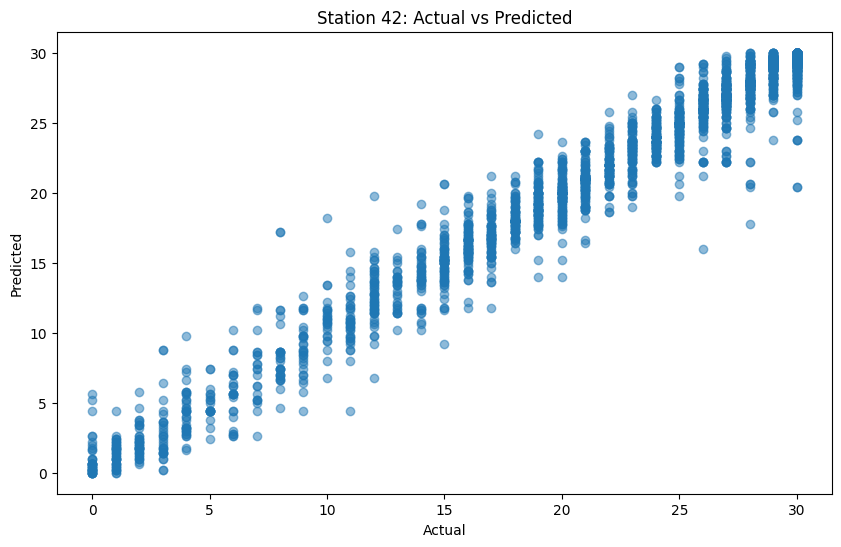

Number of predictions for station 43: 2793
Station 43 - Mean Squared Error: 7.215567490153957, R^2 Score: 0.9279150783591535
64.41102756892231
--------------------------------------------------
Covariance matrix for station 43:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.979893   11.697509    1.114813  -7.451725   0.0  0.366382   
feels_like   11.697509   16.208787    0.018234  -6.689005   0.0  0.499139   
wind_speed    1.114813    0.018234    3.356047  -3.536099   0.0 -0.003943   
humidity     -7.451725   -6.689005   -3.536099  82.790658   0.0  0.555530   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.366382    0.499139   -0.003943   0.555530   0.0  0.295217   
day           2.644103    4.006882   -1.308712 -15.174556   0.0 -3.521018   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

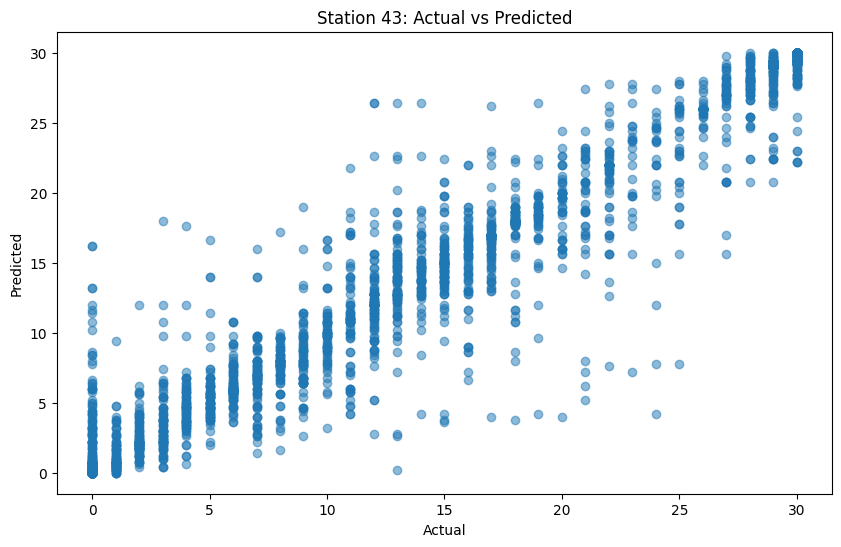

Number of predictions for station 44: 2706
Station 44 - Mean Squared Error: 2.9906873614190683, R^2 Score: 0.9648378358346896
73.09682187730968
--------------------------------------------------
Covariance matrix for station 44:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.933844   11.634356    1.115528  -6.885665   0.0  0.368325   
feels_like   11.634356   16.130931    0.004699  -5.884343   0.0  0.498833   
wind_speed    1.115528    0.004699    3.366642  -3.606043   0.0 -0.009750   
humidity     -6.885665   -5.884343   -3.606043  80.589617   0.0  0.514472   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.368325    0.498833   -0.009750   0.514472   0.0  0.297019   
day           2.406775    3.806846   -1.411124 -14.090848   0.0 -3.615792   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

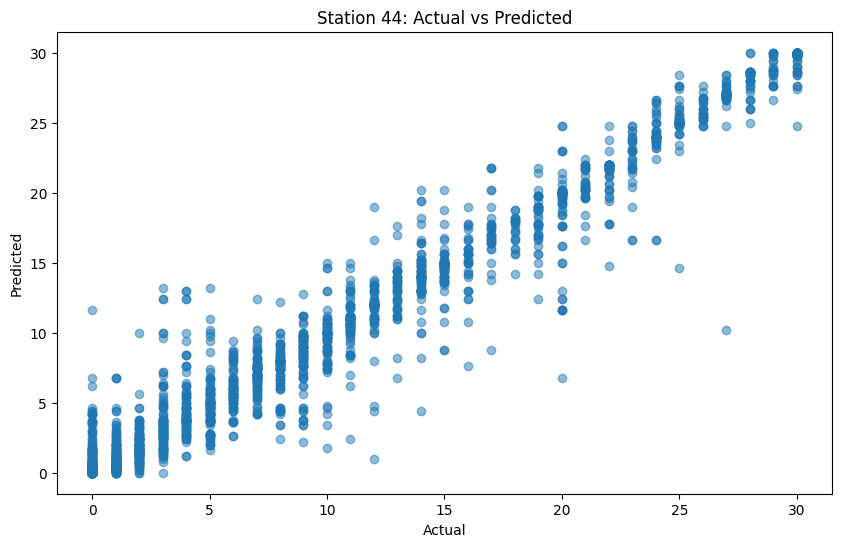

Number of predictions for station 45: 2713
Station 45 - Mean Squared Error: 2.3841356431994103, R^2 Score: 0.9565984180145726
78.1054183560634
--------------------------------------------------
Covariance matrix for station 45:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.967715   11.716308    1.089946  -6.869879   0.0  0.358586   
feels_like   11.716308   16.281286   -0.015040  -5.945831   0.0  0.487677   
wind_speed    1.089946   -0.015040    3.389631  -3.396810   0.0 -0.012041   
humidity     -6.869879   -5.945831   -3.396810  80.782089   0.0  0.581462   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.358586    0.487677   -0.012041   0.581462   0.0  0.299560   
day           2.564780    4.037513   -1.434979 -15.446458   0.0 -3.612249   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

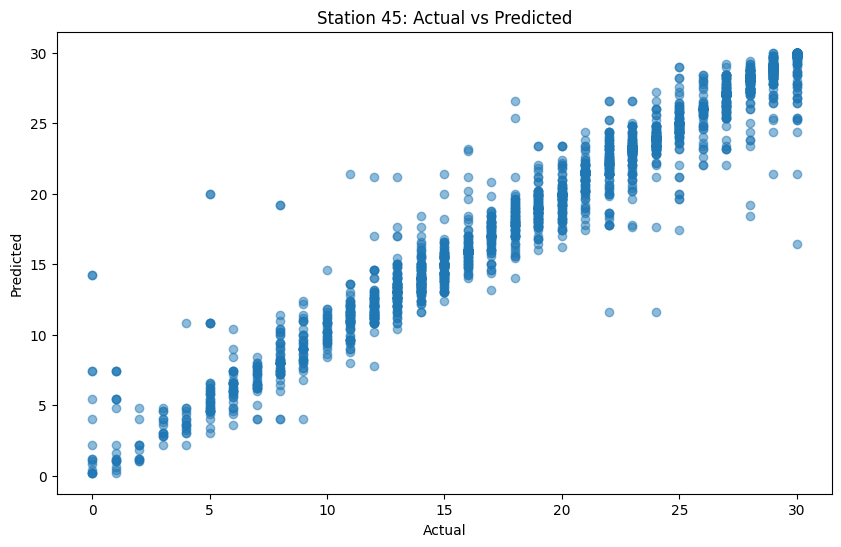

Number of predictions for station 47: 2532
Station 47 - Mean Squared Error: 1.8627330173775674, R^2 Score: 0.955933886849295
82.5039494470774
--------------------------------------------------
Covariance matrix for station 47:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.196778   12.051403    1.072732  -7.049966   0.0  0.348741   
feels_like   12.051403   16.771442   -0.034626  -6.112192   0.0  0.472252   
wind_speed    1.072732   -0.034626    3.394242  -3.327899   0.0 -0.006206   
humidity     -7.049966   -6.112192   -3.327899  85.450184   0.0  0.559880   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.348741    0.472252   -0.006206   0.559880   0.0  0.295206   
day           2.914247    4.560595   -1.565847 -15.368452   0.0 -3.559105   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

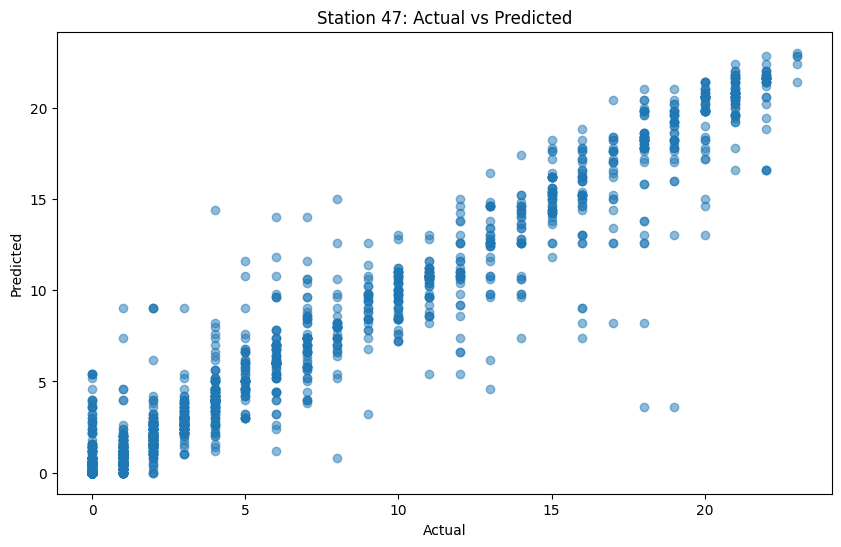

Number of predictions for station 48: 2757
Station 48 - Mean Squared Error: 1.659891186071817, R^2 Score: 0.9748900910299994
77.04026115342764
--------------------------------------------------
Covariance matrix for station 48:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.947210   11.702051    1.045318  -6.861124   0.0  0.352146   
feels_like   11.702051   16.295411   -0.101208  -5.939237   0.0  0.482108   
wind_speed    1.045318   -0.101208    3.427494  -3.420492   0.0 -0.012506   
humidity     -6.861124   -5.939237   -3.420492  82.047067   0.0  0.552487   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.352146    0.482108   -0.012506   0.552487   0.0  0.294882   
day           2.760694    4.302036   -1.513403 -14.597440   0.0 -3.597239   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

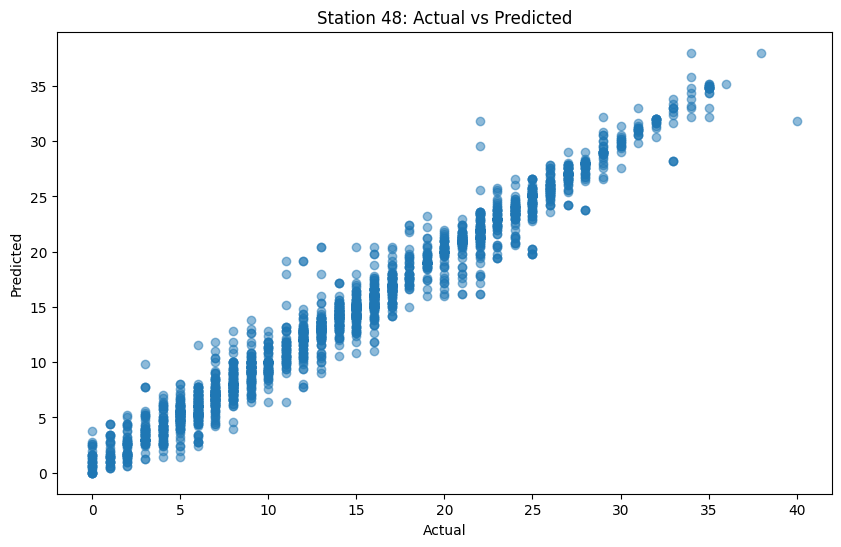

Number of predictions for station 49: 2996
Station 49 - Mean Squared Error: 4.3450867823765025, R^2 Score: 0.9615420580655045
63.184245660881174
--------------------------------------------------
Covariance matrix for station 49:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.007617   11.783224    1.031368  -6.844973   0.0  0.371812   
feels_like   11.783224   16.400083   -0.114266  -5.944337   0.0  0.504012   
wind_speed    1.031368   -0.114266    3.420994  -3.248796   0.0 -0.007430   
humidity     -6.844973   -5.944337   -3.248796  82.161812   0.0  0.527375   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.371812    0.504012   -0.007430   0.527375   0.0  0.297196   
day           2.407727    3.873399   -1.583792 -14.214675   0.0 -3.609448   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   


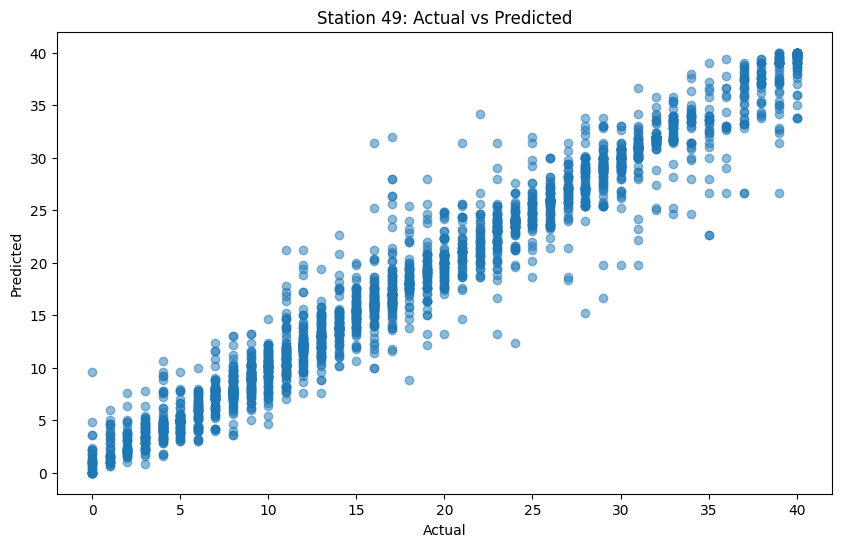

Number of predictions for station 50: 2936
Station 50 - Mean Squared Error: 3.772534059945504, R^2 Score: 0.9716311191789666
66.58719346049047
--------------------------------------------------
Covariance matrix for station 50:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.015348   11.818887    1.039373  -6.935428   0.0  0.352654   
feels_like   11.818887   16.466735   -0.073274  -6.014434   0.0  0.481328   
wind_speed    1.039373   -0.073274    3.381964  -3.357402   0.0 -0.019264   
humidity     -6.935428   -6.014434   -3.357402  83.094725   0.0  0.527097   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.352654    0.481328   -0.019264   0.527097   0.0  0.297761   
day           2.916747    4.522675   -1.391778 -14.119579   0.0 -3.591454   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

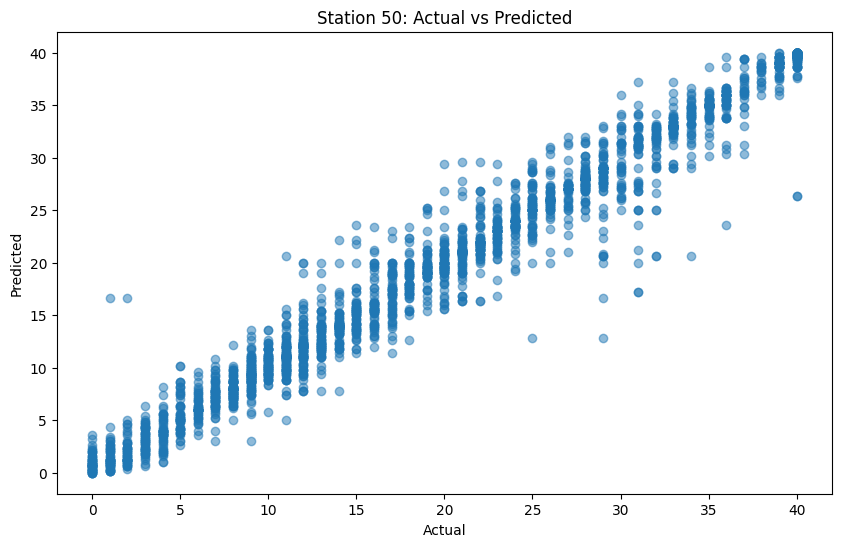

Number of predictions for station 51: 2528
Station 51 - Mean Squared Error: 1.1756012658227848, R^2 Score: 0.9699927532212379
86.11550632911393
--------------------------------------------------
Covariance matrix for station 51:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.034154   11.827305    1.037882  -7.098684   0.0  0.353598   
feels_like   11.827305   16.464555   -0.090980  -6.231041   0.0  0.481145   
wind_speed    1.037882   -0.090980    3.397165  -3.438488   0.0 -0.009643   
humidity     -7.098684   -6.231041   -3.438488  83.789614   0.0  0.565310   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.353598    0.481145   -0.009643   0.565310   0.0  0.296280   
day           2.999637    4.635741   -1.476924 -15.034546   0.0 -3.593462   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

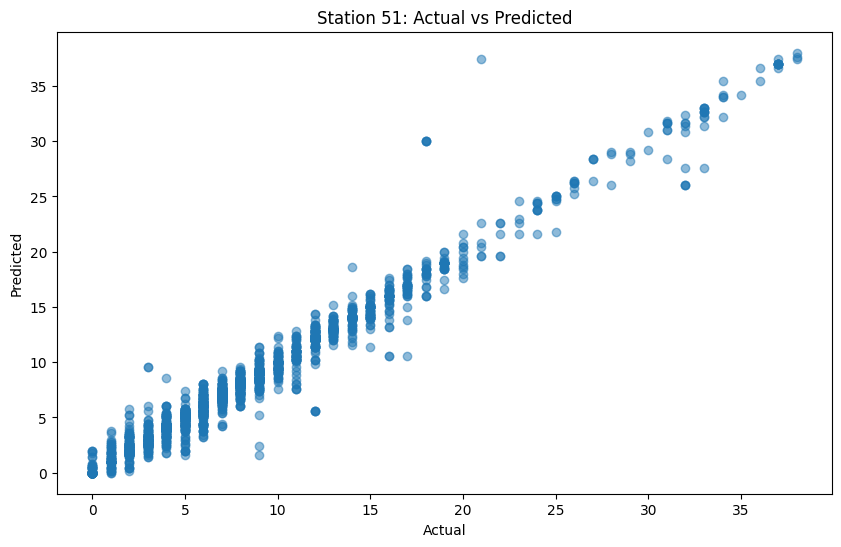

Number of predictions for station 52: 2560
Station 52 - Mean Squared Error: 1.77225, R^2 Score: 0.9670949710009183
77.109375
--------------------------------------------------
Covariance matrix for station 52:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.064893   11.841328    1.150720  -7.601282   0.0  0.332801   
feels_like   11.841328   16.436277    0.093987  -6.849466   0.0  0.452531   
wind_speed    1.150720    0.093987    3.341289  -3.187918   0.0  0.005869   
humidity     -7.601282   -6.849466   -3.187918  86.248182   0.0  0.541067   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.332801    0.452531    0.005869   0.541067   0.0  0.300619   
day           3.337992    5.141215   -1.882736 -14.090801   0.0 -3.577508   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day_of_week  -1.2544

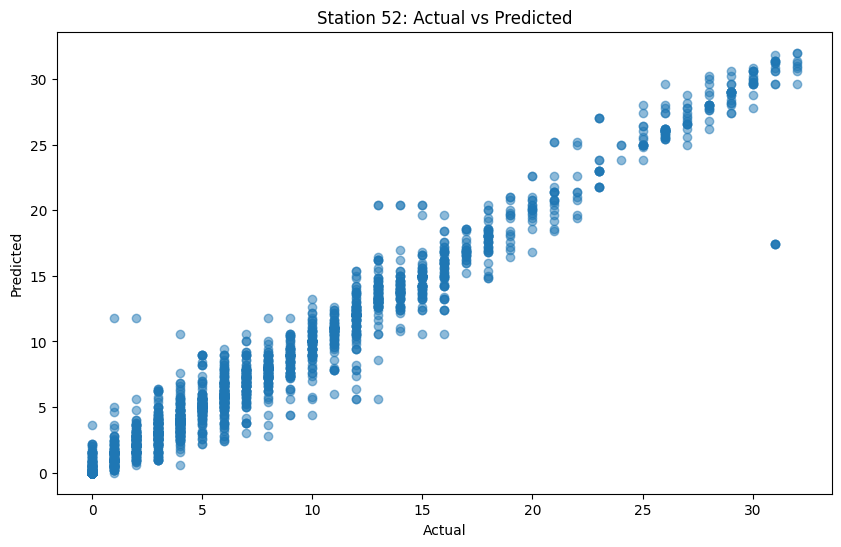

Number of predictions for station 53: 2441
Station 53 - Mean Squared Error: 1.2905202785743548, R^2 Score: 0.9575631210958636
87.58705448586645
--------------------------------------------------
Covariance matrix for station 53:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.048622   11.827458    1.067246  -6.955920   0.0  0.349796   
feels_like   11.827458   16.440479   -0.052815  -6.055090   0.0  0.479950   
wind_speed    1.067246   -0.052815    3.377258  -3.524505   0.0 -0.013122   
humidity     -6.955920   -6.055090   -3.524505  82.405920   0.0  0.612054   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.349796    0.479950   -0.013122   0.612054   0.0  0.296173   
day           2.848282    4.345924   -1.420322 -15.440842   0.0 -3.568274   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

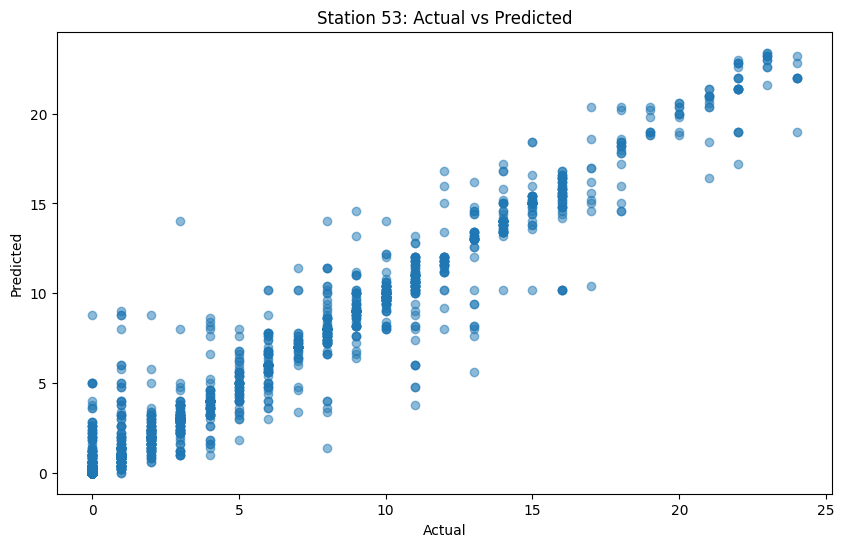

Number of predictions for station 54: 2591
Station 54 - Mean Squared Error: 1.3853338479351605, R^2 Score: 0.9765702235023528
81.0111925897337
--------------------------------------------------
Covariance matrix for station 54:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.016399   11.772297    1.071888  -6.897089   0.0  0.335715   
feels_like   11.772297   16.356425   -0.051934  -5.970912   0.0  0.466109   
wind_speed    1.071888   -0.051934    3.386795  -3.429114   0.0 -0.020043   
humidity     -6.897089   -5.970912   -3.429114  82.847325   0.0  0.645014   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.335715    0.466109   -0.020043   0.645014   0.0  0.295591   
day           2.954878    4.410598   -1.316891 -15.699514   0.0 -3.580819   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

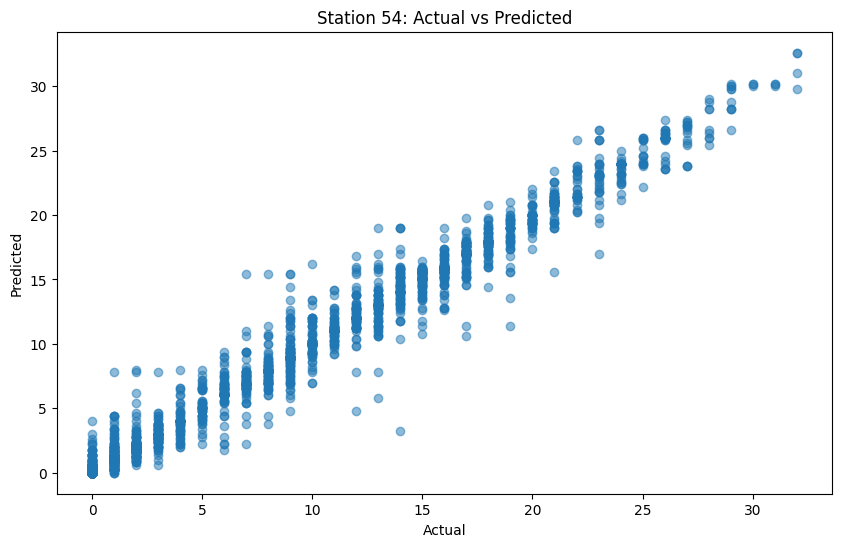

Number of predictions for station 55: 2566
Station 55 - Mean Squared Error: 3.3169602494154327, R^2 Score: 0.9493314812142754
79.77396726422448
--------------------------------------------------
Covariance matrix for station 55:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.054887   11.820254    1.062017  -7.045706   0.0  0.346823   
feels_like   11.820254   16.404579   -0.049323  -6.154538   0.0  0.480801   
wind_speed    1.062017   -0.049323    3.342370  -3.412226   0.0 -0.021694   
humidity     -7.045706   -6.154538   -3.412226  84.345138   0.0  0.594213   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.346823    0.480801   -0.021694   0.594213   0.0  0.294987   
day           2.901311    4.290693   -1.254788 -14.816346   0.0 -3.550925   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

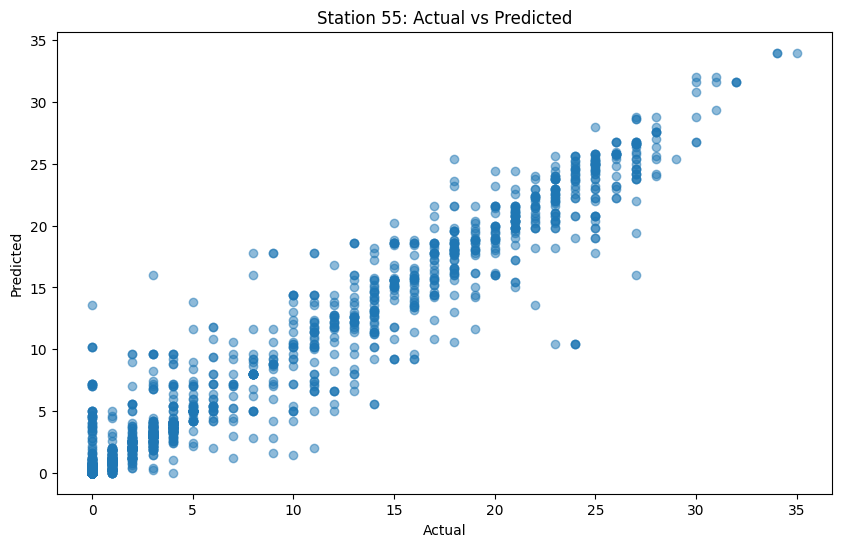

Number of predictions for station 56: 2892
Station 56 - Mean Squared Error: 5.652295988934993, R^2 Score: 0.9522774178723002
64.14246196403873
--------------------------------------------------
Covariance matrix for station 56:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.124516   11.990539    1.015748  -6.940407   0.0  0.363357   
feels_like   11.990539   16.732570   -0.103775  -6.015926   0.0  0.486511   
wind_speed    1.015748   -0.103775    3.388011  -3.212794   0.0  0.003279   
humidity     -6.940407   -6.015926   -3.212794  85.785022   0.0  0.488712   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.363357    0.486511    0.003279   0.488712   0.0  0.294220   
day           2.667558    4.252643   -1.581697 -14.033144   0.0 -3.539457   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

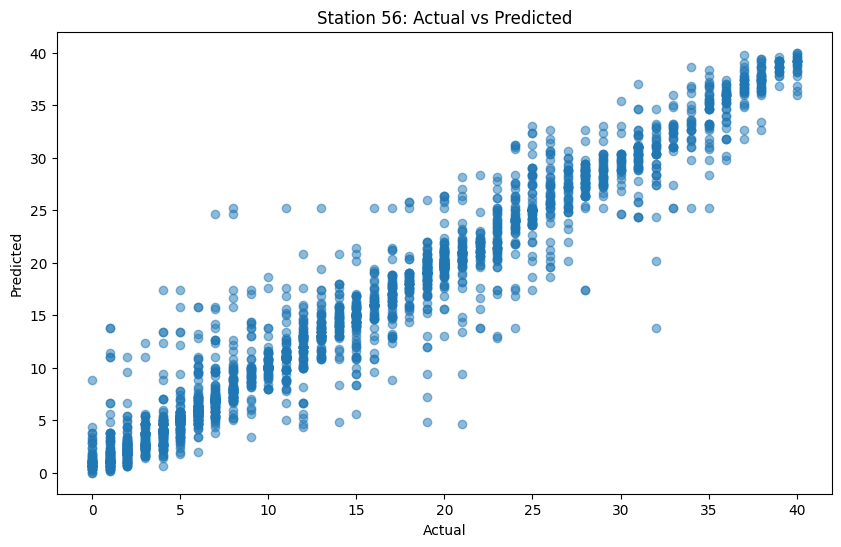

Number of predictions for station 57: 2545
Station 57 - Mean Squared Error: 1.2728487229862475, R^2 Score: 0.9620925037714043
83.33988212180746
--------------------------------------------------
Covariance matrix for station 57:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.048431   11.864541    1.065882  -7.116382   0.0  0.342371   
feels_like   11.864541   16.527284   -0.027313  -6.209914   0.0  0.470400   
wind_speed    1.065882   -0.027313    3.369509  -3.343880   0.0 -0.012703   
humidity     -7.116382   -6.209914   -3.343880  85.542055   0.0  0.647104   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.342371    0.470400   -0.012703   0.647104   0.0  0.296414   
day           3.083359    4.684436   -1.407665 -16.467239   0.0 -3.597953   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

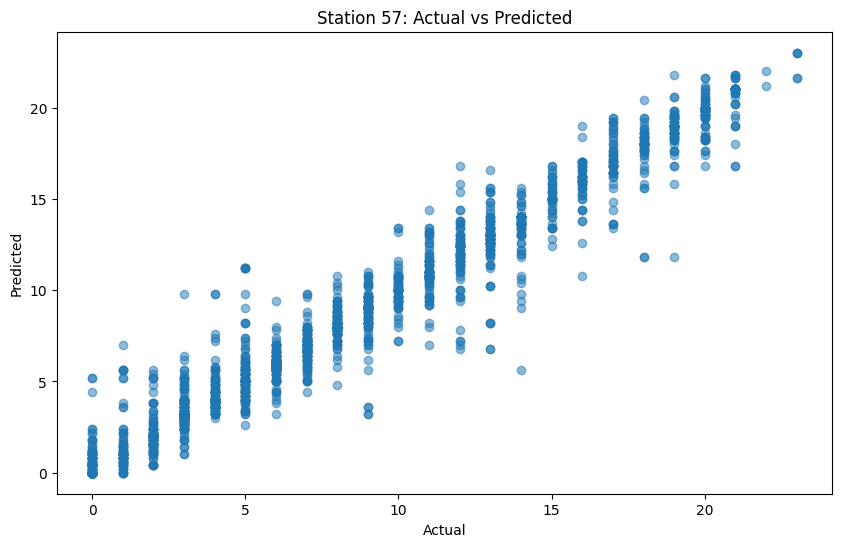

Number of predictions for station 58: 3064
Station 58 - Mean Squared Error: 7.018772845953003, R^2 Score: 0.9412072534332483
57.539164490861616
--------------------------------------------------
Covariance matrix for station 58:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.916894   11.660585    1.072434  -6.868023   0.0  0.356420   
feels_like   11.660585   16.230041   -0.041206  -5.848131   0.0  0.493747   
wind_speed    1.072434   -0.041206    3.389969  -3.475252   0.0 -0.025303   
humidity     -6.868023   -5.848131   -3.475252  84.403854   0.0  0.570402   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.356420    0.493747   -0.025303   0.570402   0.0  0.297928   
day           2.470097    3.798342   -1.260367 -14.054211   0.0 -3.559041   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

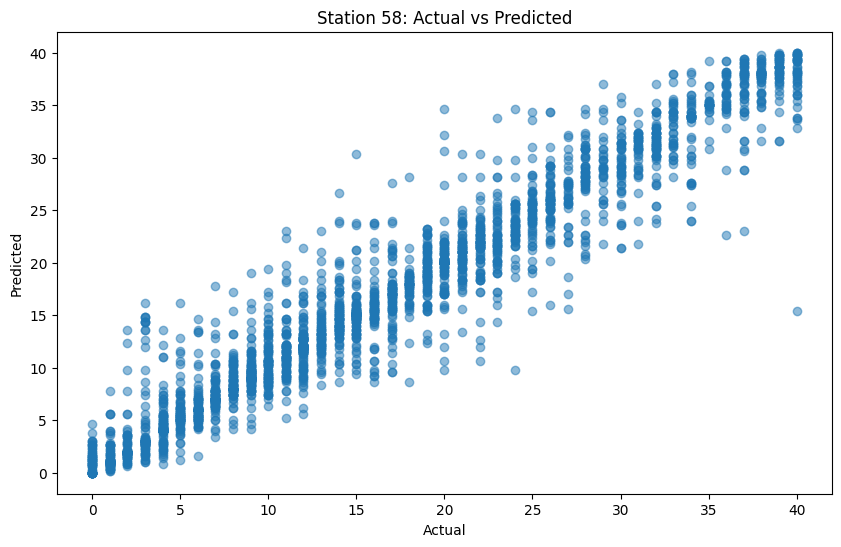

Number of predictions for station 59: 2568
Station 59 - Mean Squared Error: 1.5442679127725856, R^2 Score: 0.9223209961325051
82.04828660436138
--------------------------------------------------
Covariance matrix for station 59:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.032845   11.789087    1.111229  -7.153160   0.0  0.344855   
feels_like   11.789087   16.368914    0.013766  -6.169967   0.0  0.483695   
wind_speed    1.111229    0.013766    3.347624  -3.699292   0.0 -0.026469   
humidity     -7.153160   -6.169967   -3.699292  84.516662   0.0  0.635474   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.344855    0.483695   -0.026469   0.635474   0.0  0.298425   
day           2.932812    4.266172   -1.156749 -15.808965   0.0 -3.598124   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

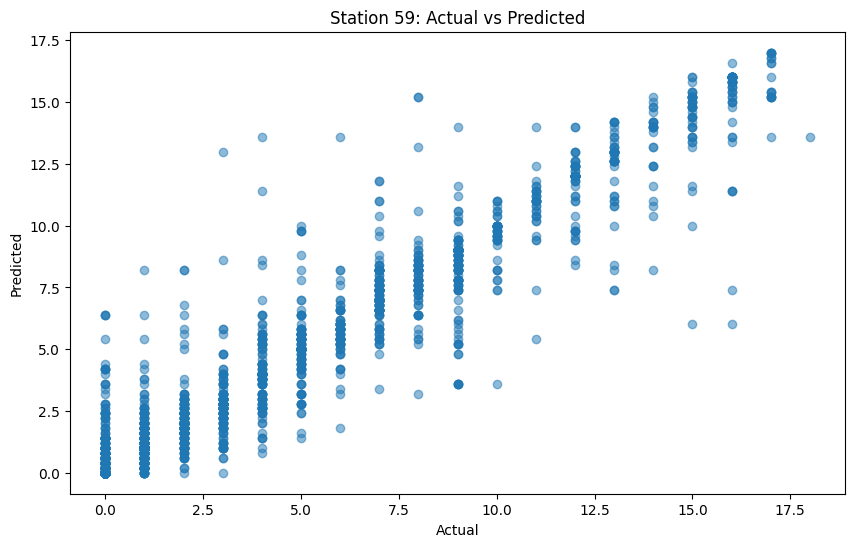

Number of predictions for station 60: 2939
Station 60 - Mean Squared Error: 4.839251446070092, R^2 Score: 0.9427088576779034
61.61959850289214
--------------------------------------------------
Covariance matrix for station 60:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.991393   11.741445    1.059454  -7.265774   0.0  0.382257   
feels_like   11.741445   16.312705   -0.059099  -6.456402   0.0  0.523878   
wind_speed    1.059454   -0.059099    3.377534  -3.400444   0.0 -0.017629   
humidity     -7.265774   -6.456402   -3.400444  83.121824   0.0  0.555491   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.382257    0.523878   -0.017629   0.555491   0.0  0.298616   
day           2.438151    3.714680   -1.263943 -14.568481   0.0 -3.536942   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

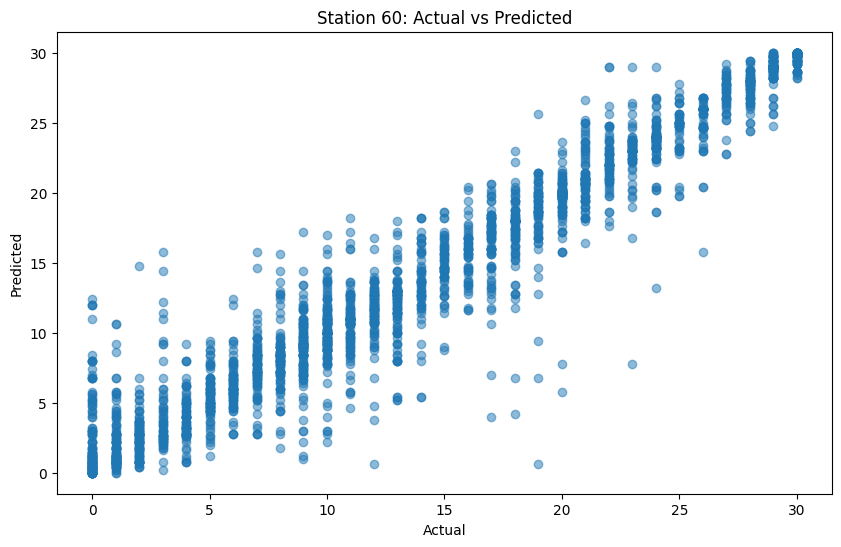

Number of predictions for station 61: 2468
Station 61 - Mean Squared Error: 2.2841491085899515, R^2 Score: 0.9470252936617785
86.02106969205835
--------------------------------------------------
Covariance matrix for station 61:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.074206   11.880031    1.046429  -7.249312   0.0  0.348048   
feels_like   11.880031   16.536064   -0.080753  -6.455090   0.0  0.480316   
wind_speed    1.046429   -0.080753    3.392874  -3.396903   0.0 -0.013126   
humidity     -7.249312   -6.455090   -3.396903  82.901999   0.0  0.595947   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.348048    0.480316   -0.013126   0.595947   0.0  0.296052   
day           3.147053    4.731359   -1.425928 -15.970697   0.0 -3.587711   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

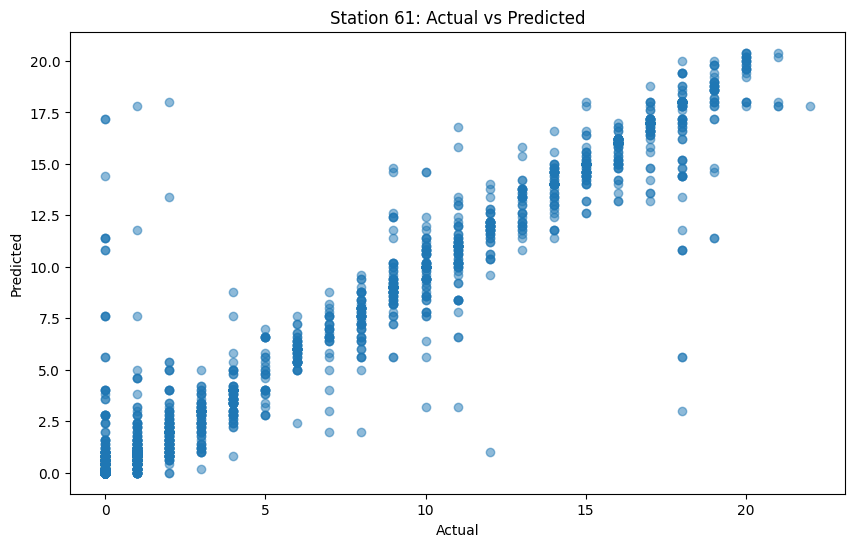

Number of predictions for station 62: 2798
Station 62 - Mean Squared Error: 3.0598427448177263, R^2 Score: 0.9684030340710222
70.83631165117941
--------------------------------------------------
Covariance matrix for station 62:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.174869   12.064224    0.995744  -6.850168   0.0  0.338532   
feels_like   12.064224   16.838541   -0.134371  -5.918513   0.0  0.465087   
wind_speed    0.995744   -0.134371    3.411195  -3.285662   0.0 -0.016238   
humidity     -6.850168   -5.918513   -3.285662  84.667863   0.0  0.584488   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.338532    0.465087   -0.016238   0.584488   0.0  0.294835   
day           3.335979    5.026200   -1.448633 -15.852818   0.0 -3.607859   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

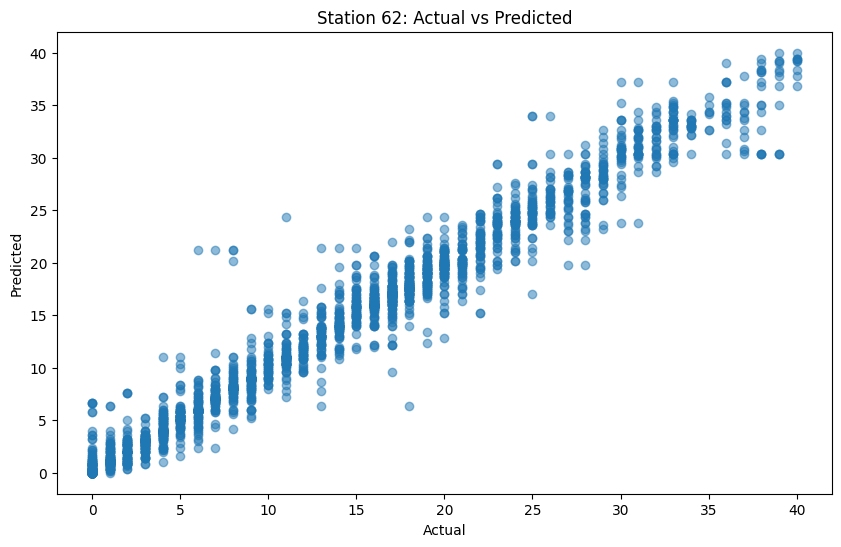

Number of predictions for station 63: 2703
Station 63 - Mean Squared Error: 1.572001479837218, R^2 Score: 0.9702034950136532
77.2475027746948
--------------------------------------------------
Covariance matrix for station 63:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.993280   11.763277    1.065817  -6.832353   0.0  0.356036   
feels_like   11.763277   16.362644   -0.044846  -5.834276   0.0  0.487765   
wind_speed    1.065817   -0.044846    3.370694  -3.419734   0.0 -0.010532   
humidity     -6.832353   -5.834276   -3.419734  84.249023   0.0  0.612851   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.356036    0.487765   -0.010532   0.612851   0.0  0.294914   
day           2.604023    4.020185   -1.411323 -15.459002   0.0 -3.571194   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

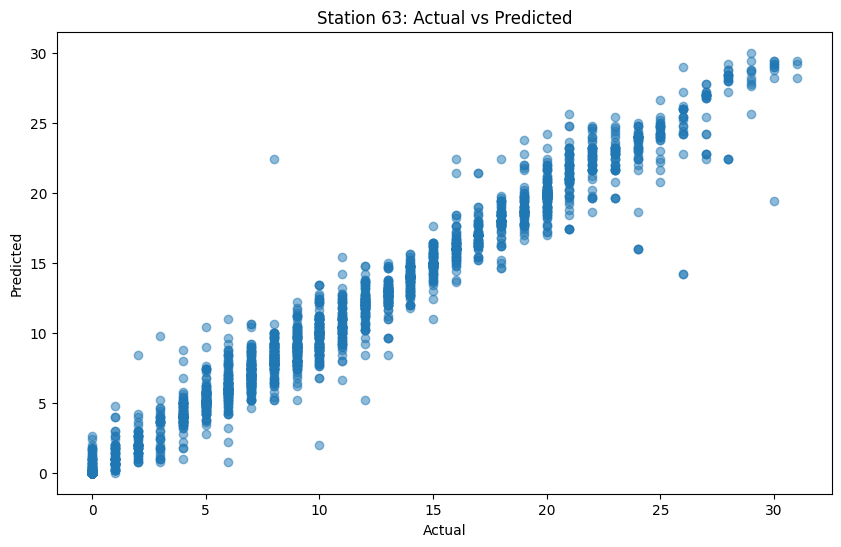

Number of predictions for station 64: 2888
Station 64 - Mean Squared Error: 5.432119113573407, R^2 Score: 0.9382880113676129
64.05817174515236
--------------------------------------------------
Covariance matrix for station 64:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.054070   11.870522    1.040433  -6.527041   0.0  0.354915   
feels_like   11.870522   16.539513   -0.069417  -5.537357   0.0  0.488369   
wind_speed    1.040433   -0.069417    3.361939  -3.180411   0.0 -0.019145   
humidity     -6.527041   -5.537357   -3.180411  82.610050   0.0  0.536520   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.354915    0.488369   -0.019145   0.536520   0.0  0.298785   
day           2.548477    3.935622   -1.341778 -13.831203   0.0 -3.591720   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

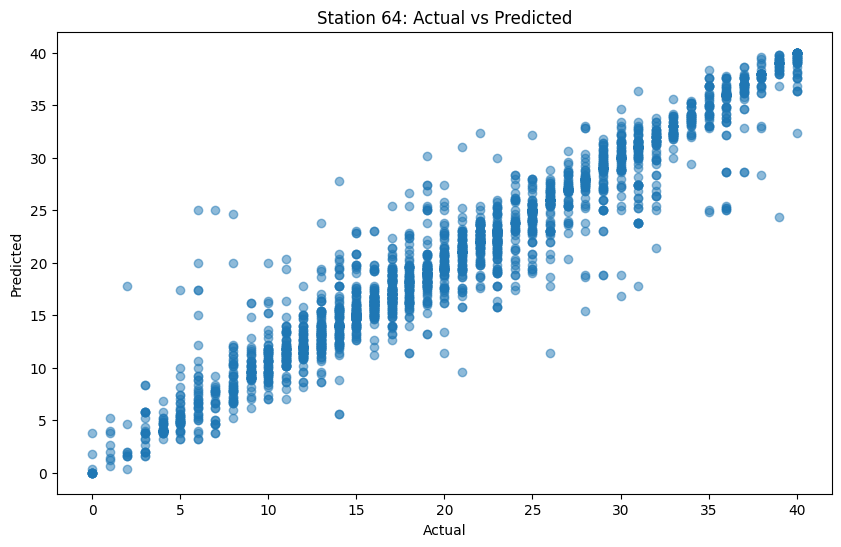

Number of predictions for station 65: 2484
Station 65 - Mean Squared Error: 6.860708534621578, R^2 Score: 0.9374252288867526
69.20289855072464
--------------------------------------------------
Covariance matrix for station 65:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.086017   11.829455    1.292717  -5.933790   0.0  0.544012   
feels_like   11.829455   16.340582    0.393304  -4.316414   0.0  0.760202   
wind_speed    1.292717    0.393304    3.127657  -3.928512   0.0 -0.060903   
humidity     -5.933790   -4.316414   -3.928512  87.133141   0.0  0.398291   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.544012    0.760202   -0.060903   0.398291   0.0  0.308736   
day          -2.361786   -3.304924   -0.009657  -7.978508   0.0 -3.034792   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

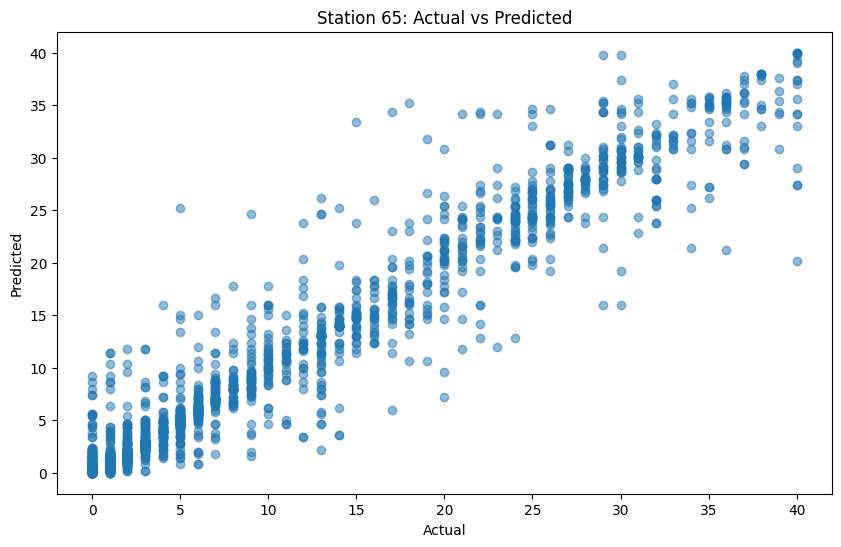

Number of predictions for station 66: 2787
Station 66 - Mean Squared Error: 5.524592752063151, R^2 Score: 0.9293778938300319
59.84930032292788
--------------------------------------------------
Covariance matrix for station 66:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.423171   12.425197    1.033054  -6.802221   0.0  0.441643   
feels_like   12.425197   17.329190    0.009606  -5.731506   0.0  0.613516   
wind_speed    1.033054    0.009606    3.241316  -3.357531   0.0 -0.033948   
humidity     -6.802221   -5.731506   -3.357531  88.492288   0.0  0.493369   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.441643    0.613516   -0.033948   0.493369   0.0  0.304064   
day           0.961585    1.557770   -0.933313 -13.700491   0.0 -3.279610   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

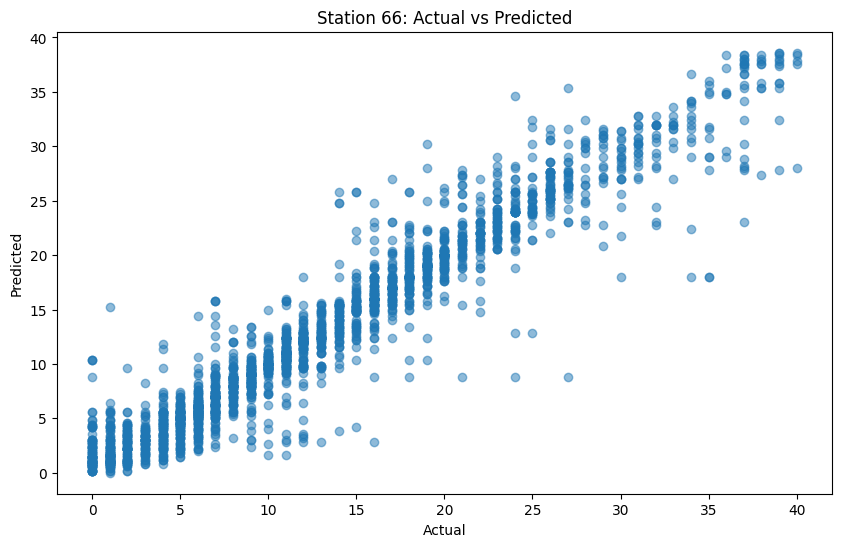

Number of predictions for station 67: 2989
Station 67 - Mean Squared Error: 3.6211040481766474, R^2 Score: 0.956686481944513
63.26530612244898
--------------------------------------------------
Covariance matrix for station 67:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.060231   11.900235    1.031873  -6.867571   0.0  0.360779   
feels_like   11.900235   16.603673   -0.074585  -5.817574   0.0  0.498020   
wind_speed    1.031873   -0.074585    3.368829  -3.454588   0.0 -0.023376   
humidity     -6.867571   -5.817574   -3.454588  84.378854   0.0  0.572156   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.360779    0.498020   -0.023376   0.572156   0.0  0.296169   
day           2.506425    3.908445   -1.341105 -14.633873   0.0 -3.571967   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

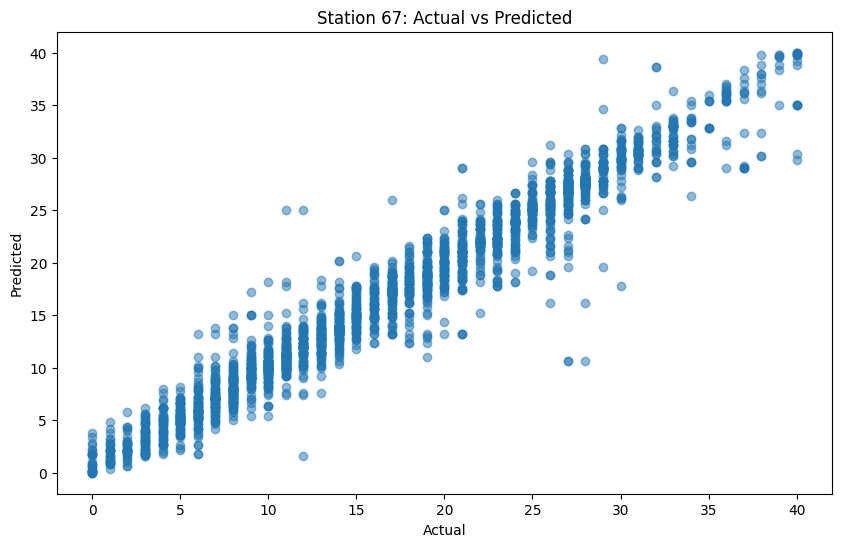

Number of predictions for station 68: 2983
Station 68 - Mean Squared Error: 5.926986255447536, R^2 Score: 0.9553675536025789
62.219242373449546
--------------------------------------------------
Covariance matrix for station 68:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.926502   11.691298    0.998222  -7.116654   0.0  0.362006   
feels_like   11.691298   16.283109   -0.130283  -6.243195   0.0  0.494186   
wind_speed    0.998222   -0.130283    3.392050  -3.343148   0.0 -0.016857   
humidity     -7.116654   -6.243195   -3.343148  85.116621   0.0  0.568340   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.362006    0.494186   -0.016857   0.568340   0.0  0.296335   
day           2.572214    4.040945   -1.450520 -14.850775   0.0 -3.544207   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

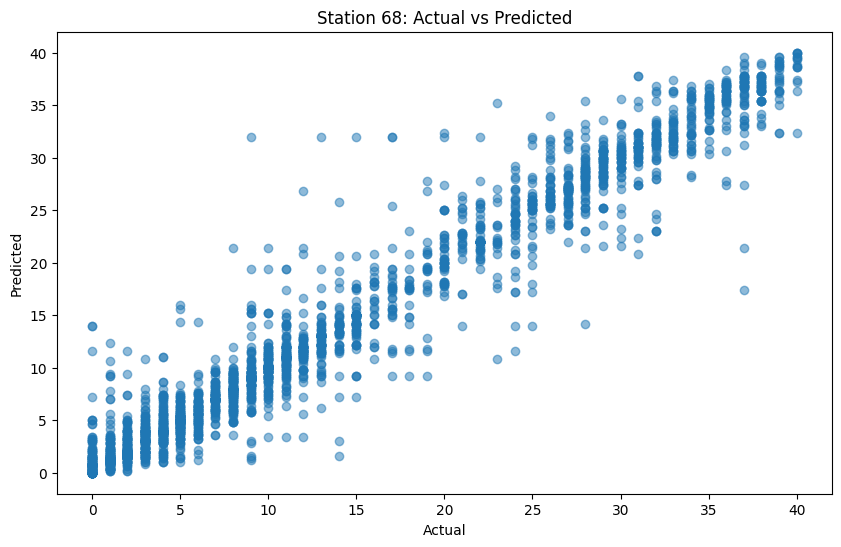

Number of predictions for station 69: 3299
Station 69 - Mean Squared Error: 7.365080327371931, R^2 Score: 0.9498386188614214
53.834495301606545
--------------------------------------------------
Covariance matrix for station 69:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.967164   11.773541    1.027479  -6.995217   0.0  0.377103   
feels_like   11.773541   16.433102   -0.088438  -6.109742   0.0  0.513910   
wind_speed    1.027479   -0.088438    3.395882  -3.296763   0.0 -0.010690   
humidity     -6.995217   -6.109742   -3.296763  85.150466   0.0  0.556186   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.377103    0.513910   -0.010690   0.556186   0.0  0.297100   
day           2.353802    3.792313   -1.546082 -14.920727   0.0 -3.552471   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

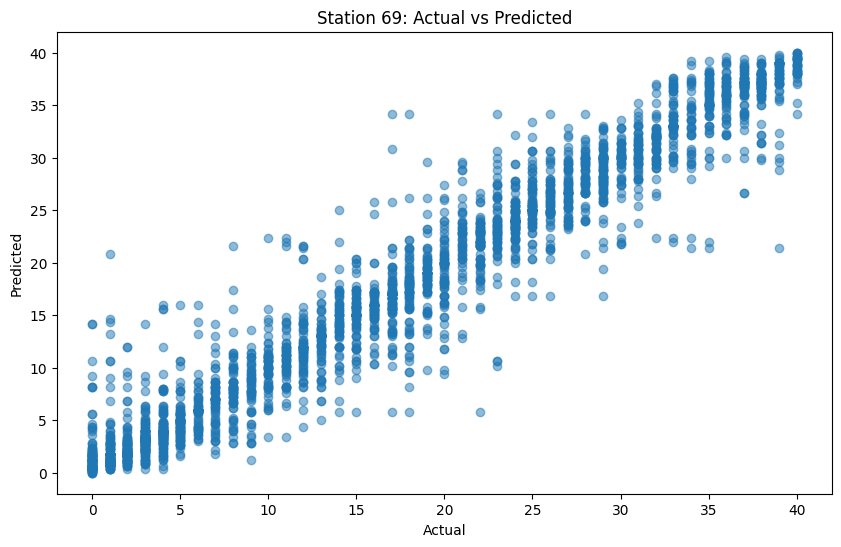

Number of predictions for station 71: 2680
Station 71 - Mean Squared Error: 1.2699253731343283, R^2 Score: 0.9591268179469972
75.55970149253731
--------------------------------------------------
Covariance matrix for station 71:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.964933   11.751700    1.040552  -6.840834   0.0  0.337564   
feels_like   11.751700   16.393796   -0.095768  -5.747666   0.0  0.461827   
wind_speed    1.040552   -0.095768    3.417208  -3.583342   0.0 -0.011037   
humidity     -6.840834   -5.747666   -3.583342  83.911618   0.0  0.531564   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.337564    0.461827   -0.011037   0.531564   0.0  0.295309   
day           3.139467    4.767056   -1.421054 -15.261695   0.0 -3.611552   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

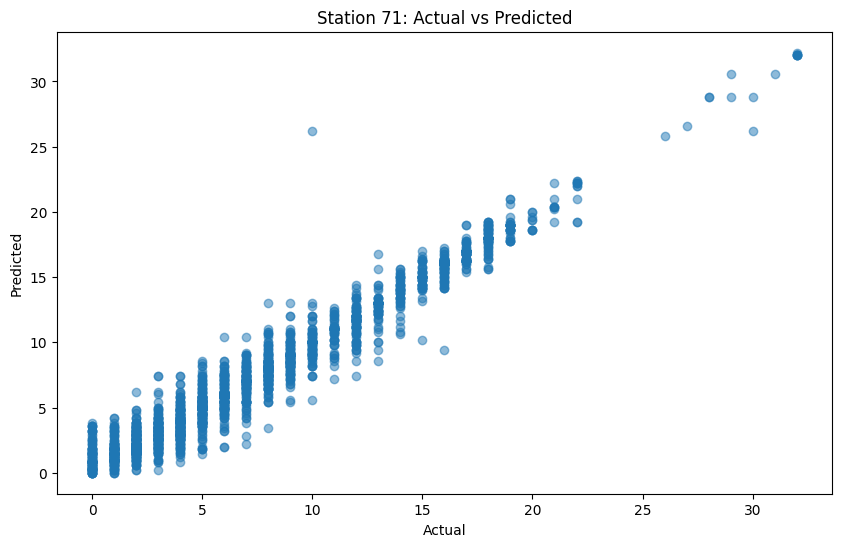

Number of predictions for station 72: 2677
Station 72 - Mean Squared Error: 2.7912439297721328, R^2 Score: 0.9083952311562048
75.42024654463953
--------------------------------------------------
Covariance matrix for station 72:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.949604   11.735156    1.018178  -6.843379   0.0  0.348000   
feels_like   11.735156   16.358979   -0.101104  -5.876686   0.0  0.477581   
wind_speed    1.018178   -0.101104    3.393224  -3.466338   0.0 -0.017904   
humidity     -6.843379   -5.876686   -3.466338  82.984129   0.0  0.585476   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.348000    0.477581   -0.017904   0.585476   0.0  0.293684   
day           2.878514    4.451483   -1.478882 -15.195877   0.0 -3.537877   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

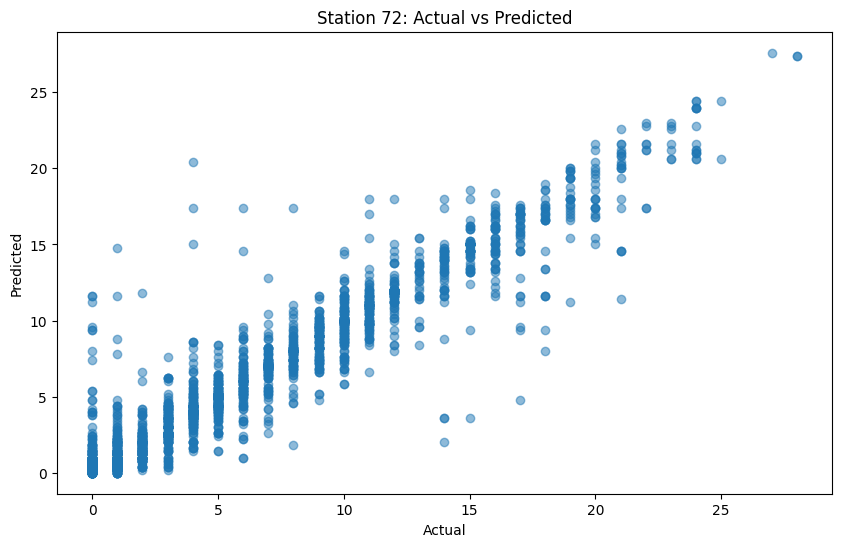

Number of predictions for station 73: 2787
Station 73 - Mean Squared Error: 3.3684104772156447, R^2 Score: 0.926056258814238
69.89594546106926
--------------------------------------------------
Covariance matrix for station 73:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.057032   11.825848    1.038757  -7.021100   0.0  0.362674   
feels_like   11.825848   16.415924   -0.085362  -6.008358   0.0  0.494820   
wind_speed    1.038757   -0.085362    3.345238  -3.570411   0.0 -0.019723   
humidity     -7.021100   -6.008358   -3.570411  84.120102   0.0  0.496412   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.362674    0.494820   -0.019723   0.496412   0.0  0.296795   
day           2.415201    3.764770   -1.301228 -13.388614   0.0 -3.568618   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

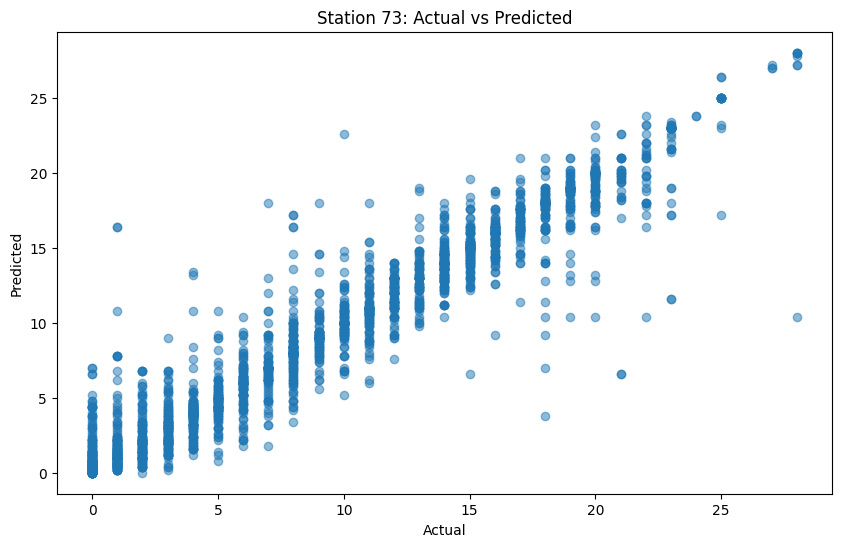

Number of predictions for station 74: 2677
Station 74 - Mean Squared Error: 1.4514755323122899, R^2 Score: 0.9723812790361959
79.0063503922301
--------------------------------------------------
Covariance matrix for station 74:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.884074   11.587454    1.067280  -7.258491   0.0  0.354483   
feels_like   11.587454   16.091401   -0.057052  -6.374099   0.0  0.491539   
wind_speed    1.067280   -0.057052    3.385234  -3.626535   0.0 -0.017563   
humidity     -7.258491   -6.374099   -3.626535  82.955435   0.0  0.570285   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.354483    0.491539   -0.017563   0.570285   0.0  0.296566   
day           2.760085    4.145993   -1.322685 -15.190796   0.0 -3.597533   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

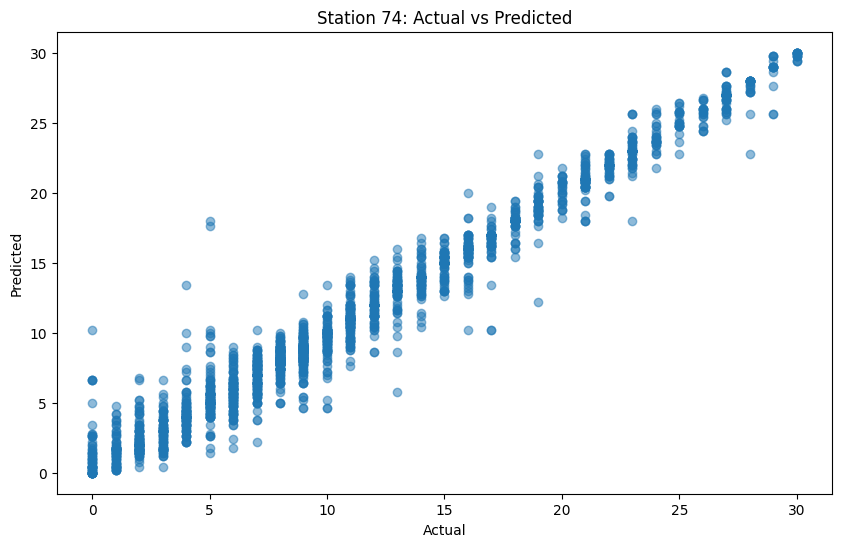

Number of predictions for station 75: 2723
Station 75 - Mean Squared Error: 3.045023870730811, R^2 Score: 0.9615716623395266
77.04737421961072
--------------------------------------------------
Covariance matrix for station 75:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.985911   11.721093    1.074396  -6.846651   0.0  0.380407   
feels_like   11.721093   16.271618   -0.049130  -6.011334   0.0  0.521349   
wind_speed    1.074396   -0.049130    3.397513  -3.316478   0.0 -0.016403   
humidity     -6.846651   -6.011334   -3.316478  81.393803   0.0  0.500649   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.380407    0.521349   -0.016403   0.500649   0.0  0.297515   
day           2.398755    3.706652   -1.367649 -14.103937   0.0 -3.566027   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

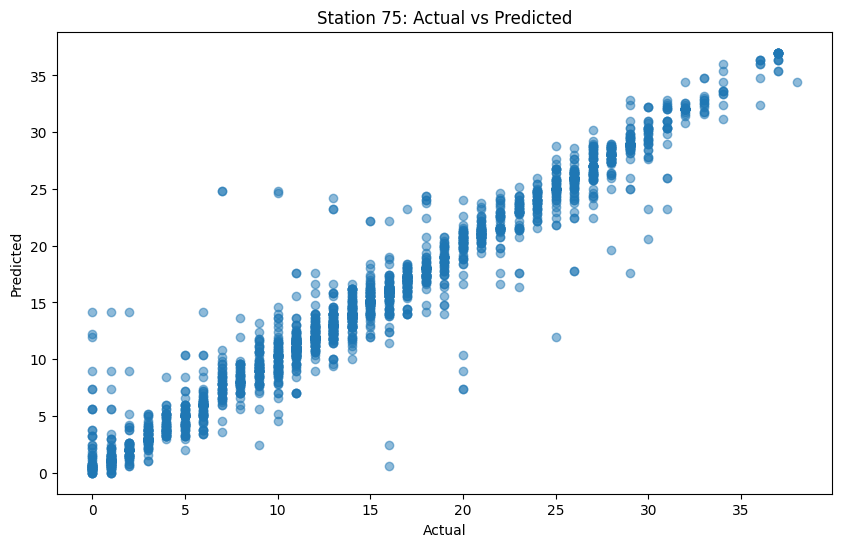

Number of predictions for station 76: 2550
Station 76 - Mean Squared Error: 3.9908549019607844, R^2 Score: 0.9285911523781856
74.82352941176471
--------------------------------------------------
Covariance matrix for station 76:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.056684   11.910899    0.985849  -6.726434   0.0  0.347988   
feels_like   11.910899   16.618354   -0.122617  -5.829225   0.0  0.468527   
wind_speed    0.985849   -0.122617    3.350214  -3.200785   0.0  0.001889   
humidity     -6.726434   -5.829225   -3.200785  83.983326   0.0  0.573093   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.347988    0.468527    0.001889   0.573093   0.0  0.293531   
day           3.050331    4.859262   -1.775791 -15.076035   0.0 -3.546959   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

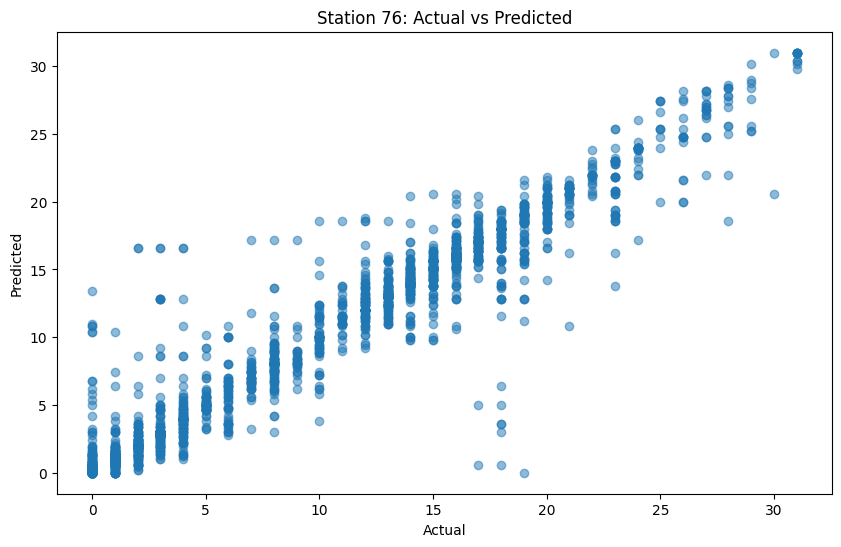

Number of predictions for station 77: 2798
Station 77 - Mean Squared Error: 1.8599857040743388, R^2 Score: 0.971154954418048
70.72909220872052
--------------------------------------------------
Covariance matrix for station 77:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.032020   11.826684    1.044868  -7.402694   0.0  0.343178   
feels_like   11.826684   16.459368   -0.067970  -6.627118   0.0  0.473713   
wind_speed    1.044868   -0.067970    3.373440  -3.328213   0.0 -0.022142   
humidity     -7.402694   -6.627118   -3.328213  85.954521   0.0  0.594978   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.343178    0.473713   -0.022142   0.594978   0.0  0.295545   
day           2.985211    4.447847   -1.178192 -15.364472   0.0 -3.519050   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

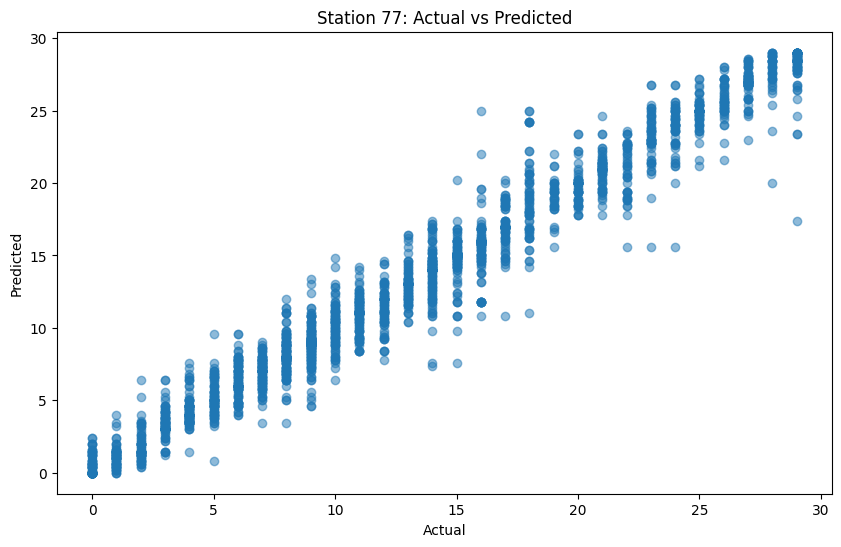

Number of predictions for station 78: 2652
Station 78 - Mean Squared Error: 2.6211915535444947, R^2 Score: 0.9687463201920464
81.18401206636501
--------------------------------------------------
Covariance matrix for station 78:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.877964   11.599916    1.089781  -6.736812   0.0  0.333403   
feels_like   11.599916   16.125219    0.001839  -5.711091   0.0  0.457910   
wind_speed    1.089781    0.001839    3.322431  -3.525062   0.0 -0.016562   
humidity     -6.736812   -5.711091   -3.525062  81.826937   0.0  0.551843   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.333403    0.457910   -0.016562   0.551843   0.0  0.292570   
day           2.974834    4.502524   -1.282595 -14.704433   0.0 -3.570296   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

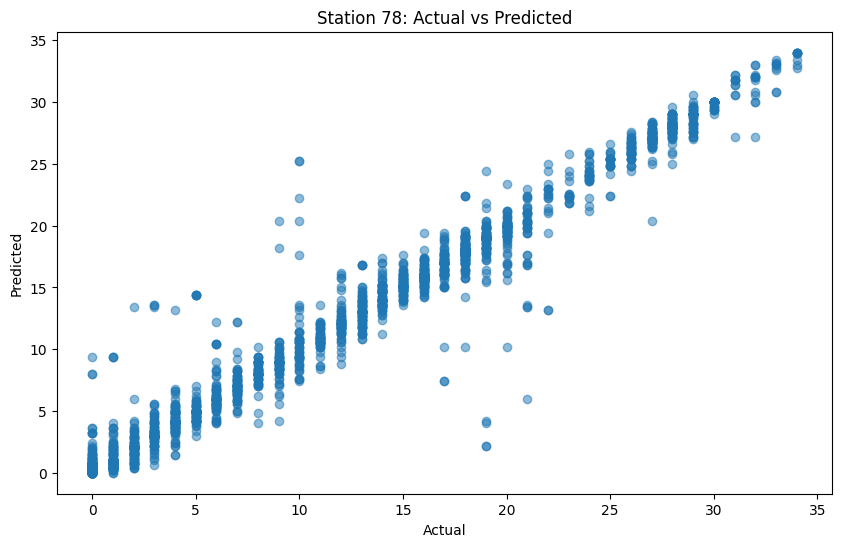

Number of predictions for station 79: 2429
Station 79 - Mean Squared Error: 1.5642980650473448, R^2 Score: 0.9334954451186156
87.77274598600246
--------------------------------------------------
Covariance matrix for station 79:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.885276   11.545527    1.072696  -7.229939   0.0  0.349030   
feels_like   11.545527   15.992476   -0.072592  -6.333544   0.0  0.482265   
wind_speed    1.072696   -0.072592    3.354837  -3.685042   0.0 -0.015843   
humidity     -7.229939   -6.333544   -3.685042  83.106639   0.0  0.633473   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.349030    0.482265   -0.015843   0.633473   0.0  0.298900   
day           2.933888    4.371291   -1.361699 -16.134811   0.0 -3.654133   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

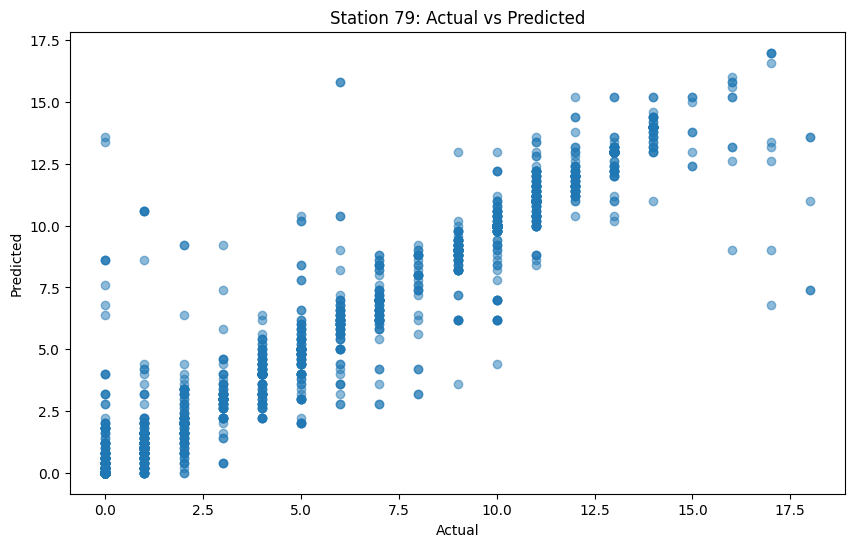

Number of predictions for station 80: 2650
Station 80 - Mean Squared Error: 3.816377358490566, R^2 Score: 0.9471232435090085
78.75471698113208
--------------------------------------------------
Covariance matrix for station 80:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.068408   11.855811    1.044930  -6.988705   0.0  0.350782   
feels_like   11.855811   16.459756   -0.050255  -6.067415   0.0  0.482438   
wind_speed    1.044930   -0.050255    3.329832  -3.486439   0.0 -0.018592   
humidity     -6.988705   -6.067415   -3.486439  82.923810   0.0  0.618957   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.350782    0.482438   -0.018592   0.618957   0.0  0.293468   
day           2.871863    4.360012   -1.374142 -15.608576   0.0 -3.539357   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

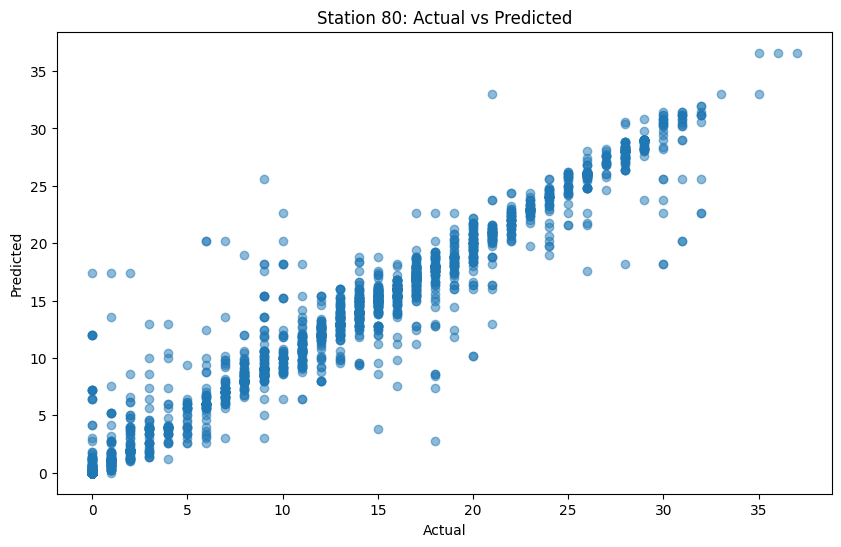

Number of predictions for station 82: 2451
Station 82 - Mean Squared Error: 0.6553080375356998, R^2 Score: 0.9800471025852291
89.67768257853938
--------------------------------------------------
Covariance matrix for station 82:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.090390   11.913530    1.025297  -7.092484   0.0  0.378876   
feels_like   11.913530   16.591606   -0.104848  -6.284456   0.0  0.518422   
wind_speed    1.025297   -0.104848    3.413789  -3.386252   0.0 -0.006010   
humidity     -7.092484   -6.284456   -3.386252  82.631781   0.0  0.559880   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.378876    0.518422   -0.006010   0.559880   0.0  0.297461   
day           2.790995    4.324631   -1.596947 -15.446690   0.0 -3.600752   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

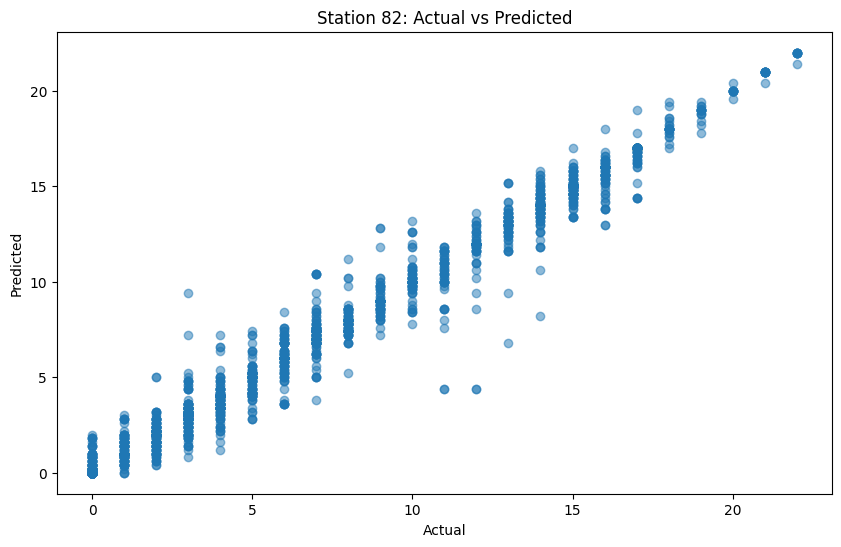

Number of predictions for station 83: 2660
Station 83 - Mean Squared Error: 2.263593984962406, R^2 Score: 0.9728550033164489
76.61654135338345
--------------------------------------------------
Covariance matrix for station 83:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.913260   11.635023    1.093520  -7.057050   0.0  0.371089   
feels_like   11.635023   16.171116   -0.030717  -6.191594   0.0  0.504728   
wind_speed    1.093520   -0.030717    3.382687  -3.549450   0.0 -0.005461   
humidity     -7.057050   -6.191594   -3.549450  82.046238   0.0  0.538218   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.371089    0.504728   -0.005461   0.538218   0.0  0.296699   
day           2.620820    4.110343   -1.495022 -15.449839   0.0 -3.592735   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

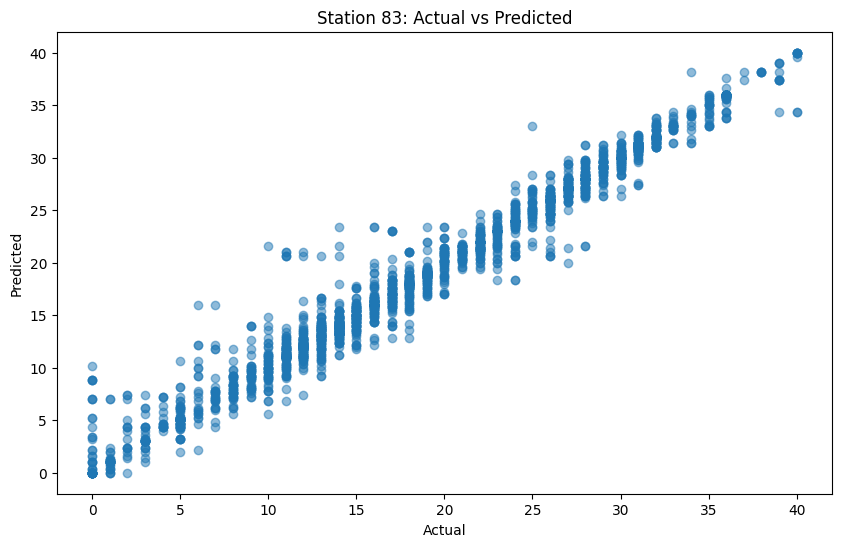

Number of predictions for station 84: 2543
Station 84 - Mean Squared Error: 1.1931104994101456, R^2 Score: 0.9755250426688757
82.30436492331891
--------------------------------------------------
Covariance matrix for station 84:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.931581   11.621921    1.092432  -7.228392   0.0  0.346063   
feels_like   11.621921   16.090906   -0.009684  -6.409422   0.0  0.475801   
wind_speed    1.092432   -0.009684    3.337616  -3.529467   0.0 -0.014398   
humidity     -7.228392   -6.409422   -3.529467  82.135765   0.0  0.597061   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.346063    0.475801   -0.014398   0.597061   0.0  0.294189   
day           2.937503    4.478508   -1.448342 -15.346030   0.0 -3.533089   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

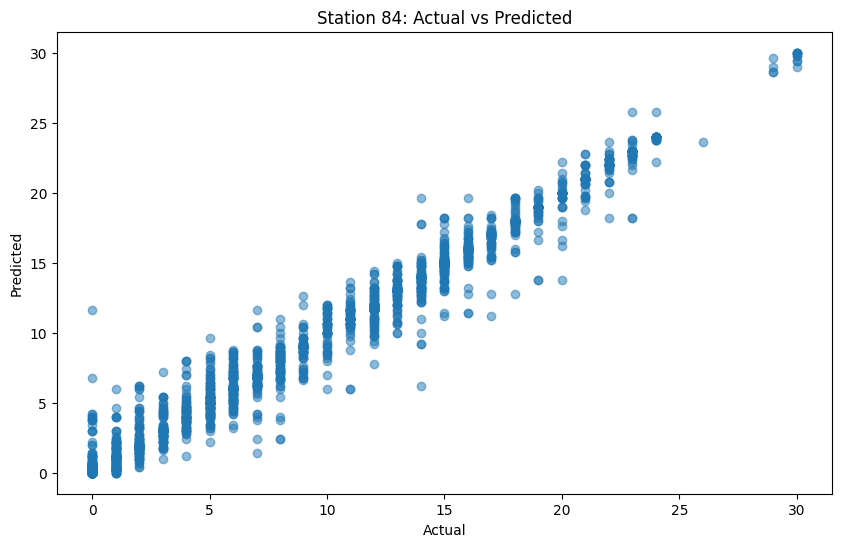

Number of predictions for station 85: 2594
Station 85 - Mean Squared Error: 3.4285427910562833, R^2 Score: 0.9562419303800398
77.02390131071704
--------------------------------------------------
Covariance matrix for station 85:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.977463   11.721783    1.071849  -6.781020   0.0  0.349594   
feels_like   11.721783   16.286546   -0.043211  -5.813400   0.0  0.484046   
wind_speed    1.071849   -0.043211    3.354966  -3.584154   0.0 -0.019557   
humidity     -6.781020   -5.813400   -3.584154  81.373820   0.0  0.605803   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.349594    0.484046   -0.019557   0.605803   0.0  0.296013   
day           2.918130    4.329235   -1.285309 -15.017523   0.0 -3.569207   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

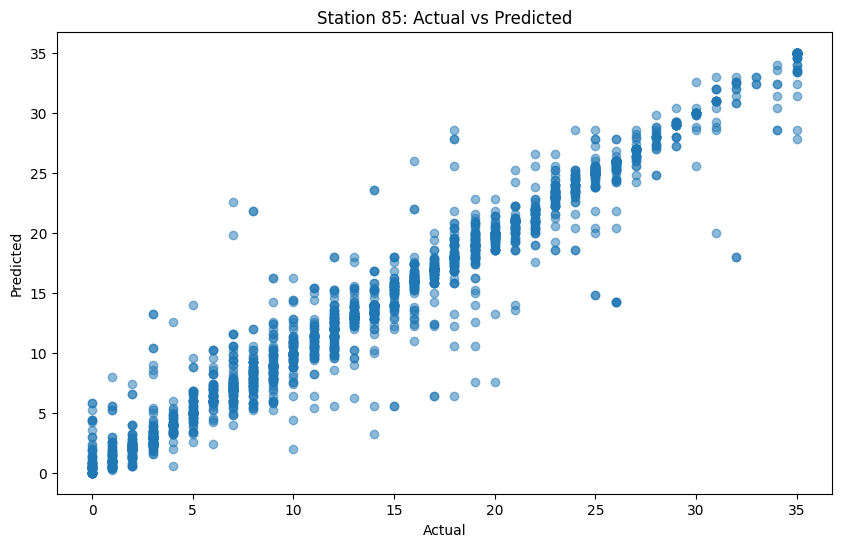

Number of predictions for station 86: 2783
Station 86 - Mean Squared Error: 6.208494430470716, R^2 Score: 0.9623489506823089
69.27775781530721
--------------------------------------------------
Covariance matrix for station 86:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.055625   11.867386    1.044034  -7.288318   0.0  0.373209   
feels_like   11.867386   16.523957   -0.068108  -6.495315   0.0  0.505331   
wind_speed    1.044034   -0.068108    3.398586  -3.336675   0.0 -0.000496   
humidity     -7.288318   -6.495315   -3.336675  84.510516   0.0  0.500028   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.373209    0.505331   -0.000496   0.500028   0.0  0.296176   
day           2.662585    4.223374   -1.581173 -15.195082   0.0 -3.545105   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

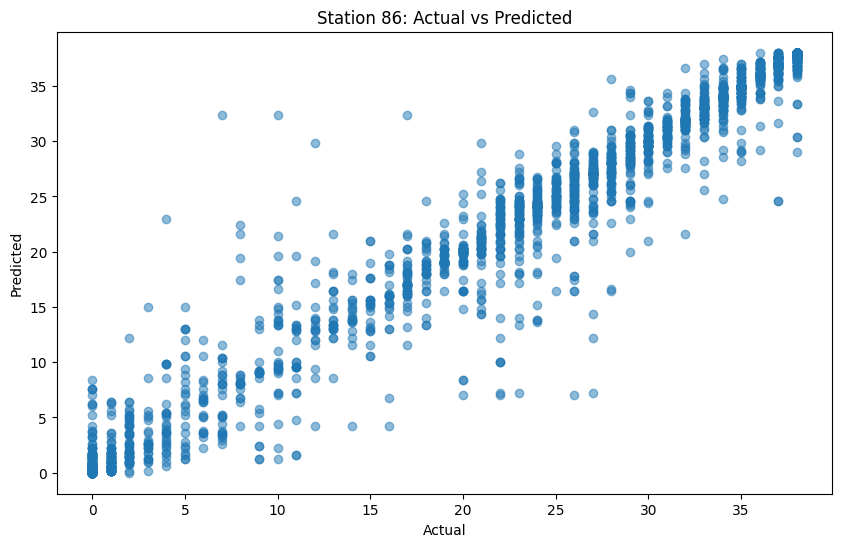

Number of predictions for station 87: 2622
Station 87 - Mean Squared Error: 1.3148588863463004, R^2 Score: 0.9792473000054355
81.73150266971777
--------------------------------------------------
Covariance matrix for station 87:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.821972   11.522940    1.025847  -7.386087   0.0  0.369541   
feels_like   11.522940   16.020890   -0.102183  -6.689532   0.0  0.507435   
wind_speed    1.025847   -0.102183    3.367141  -3.413180   0.0 -0.014405   
humidity     -7.386087   -6.689532   -3.413180  83.149591   0.0  0.579103   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.369541    0.507435   -0.014405   0.579103   0.0  0.297201   
day           2.652583    4.191748   -1.618427 -15.303025   0.0 -3.557846   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

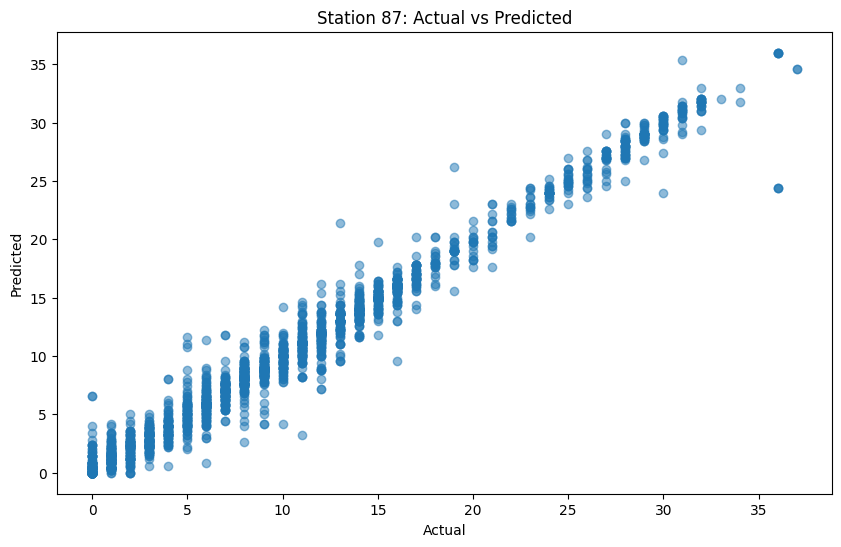

Number of predictions for station 88: 2676
Station 88 - Mean Squared Error: 1.5971300448430494, R^2 Score: 0.9694340222785242
77.01793721973094
--------------------------------------------------
Covariance matrix for station 88:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.961753   11.703386    1.067969  -6.839280   0.0  0.373095   
feels_like   11.703386   16.265850   -0.057551  -5.831765   0.0  0.508111   
wind_speed    1.067969   -0.057551    3.377489  -3.585687   0.0 -0.007833   
humidity     -6.839280   -5.831765   -3.585687  83.065403   0.0  0.546780   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.373095    0.508111   -0.007833   0.546780   0.0  0.295272   
day           2.289020    3.615185   -1.390916 -14.625627   0.0 -3.582931   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

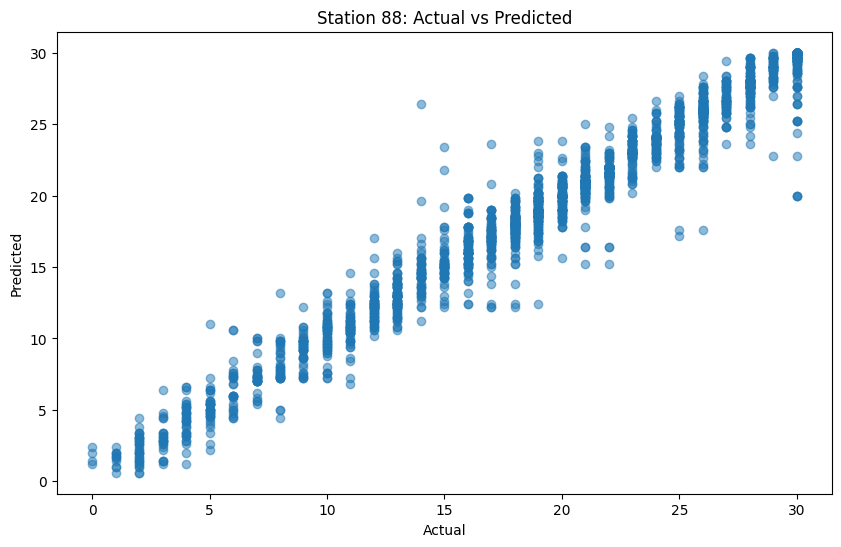

Number of predictions for station 89: 2486
Station 89 - Mean Squared Error: 1.2603700724054707, R^2 Score: 0.9445572937819796
86.32341110217216
--------------------------------------------------
Covariance matrix for station 89:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.081211   11.863396    1.092726  -6.746577   0.0  0.341961   
feels_like   11.863396   16.478611   -0.010151  -5.740526   0.0  0.474584   
wind_speed    1.092726   -0.010151    3.355150  -3.426526   0.0 -0.021492   
humidity     -6.746577   -5.740526   -3.426526  82.049338   0.0  0.626965   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.341961    0.474584   -0.021492   0.626965   0.0  0.296247   
day           2.738010    4.165097   -1.378225 -14.923528   0.0 -3.578648   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

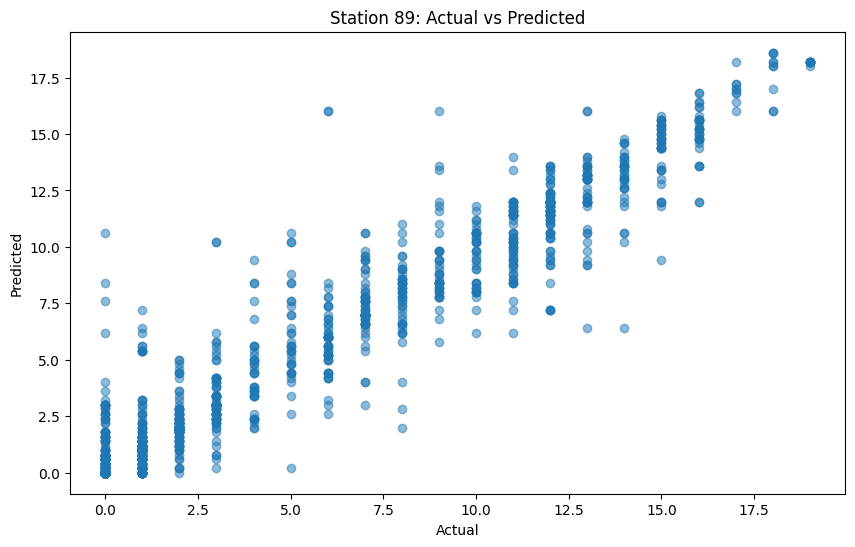

Number of predictions for station 90: 2862
Station 90 - Mean Squared Error: 7.310398322851153, R^2 Score: 0.9481475763044829
66.91125087351503
--------------------------------------------------
Covariance matrix for station 90:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.051302   11.831663    1.028779  -7.244782   0.0  0.372638   
feels_like   11.831663   16.444756   -0.100650  -6.399760   0.0  0.511017   
wind_speed    1.028779   -0.100650    3.367276  -3.441844   0.0 -0.012706   
humidity     -7.244782   -6.399760   -3.441844  84.095886   0.0  0.576306   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.372638    0.511017   -0.012706   0.576306   0.0  0.297361   
day           2.534806    3.866711   -1.384858 -14.954120   0.0 -3.532898   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

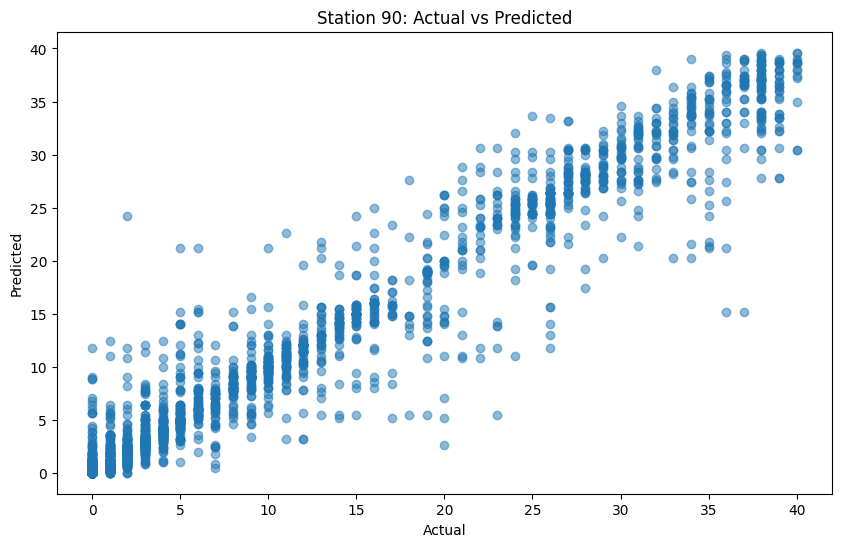

Number of predictions for station 91: 2976
Station 91 - Mean Squared Error: 5.006370967741935, R^2 Score: 0.9319747595768287
63.00403225806451
--------------------------------------------------
Covariance matrix for station 91:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.961303   11.796467    0.976476  -6.978915   0.0  0.367727   
feels_like   11.796467   16.505733   -0.161684  -6.104321   0.0  0.500693   
wind_speed    0.976476   -0.161684    3.438875  -3.203024   0.0 -0.010506   
humidity     -6.978915   -6.104321   -3.203024  83.841268   0.0  0.515035   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.367727    0.500693   -0.010506   0.515035   0.0  0.296011   
day           2.520743    4.065592   -1.619733 -14.480075   0.0 -3.554704   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

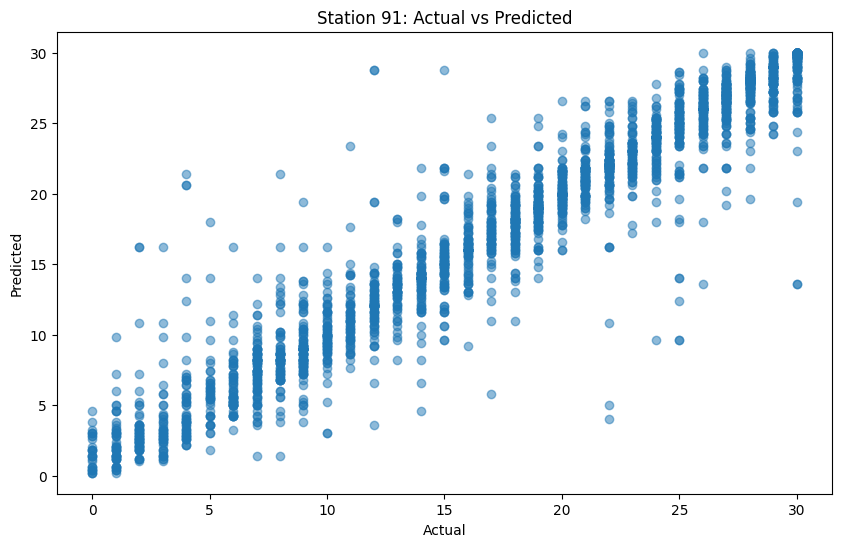

Number of predictions for station 92: 2708
Station 92 - Mean Squared Error: 7.821137370753323, R^2 Score: 0.958787701251832
74.26144756277697
--------------------------------------------------
Covariance matrix for station 92:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.028796   11.847330    0.977696  -7.258687   0.0  0.355004   
feels_like   11.847330   16.510096   -0.142890  -6.443981   0.0  0.489271   
wind_speed    0.977696   -0.142890    3.369119  -3.404972   0.0 -0.014008   
humidity     -7.258687   -6.443981   -3.404972  83.830119   0.0  0.543164   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.355004    0.489271   -0.014008   0.543164   0.0  0.294740   
day           3.156860    4.769799   -1.450377 -15.677059   0.0 -3.583343   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

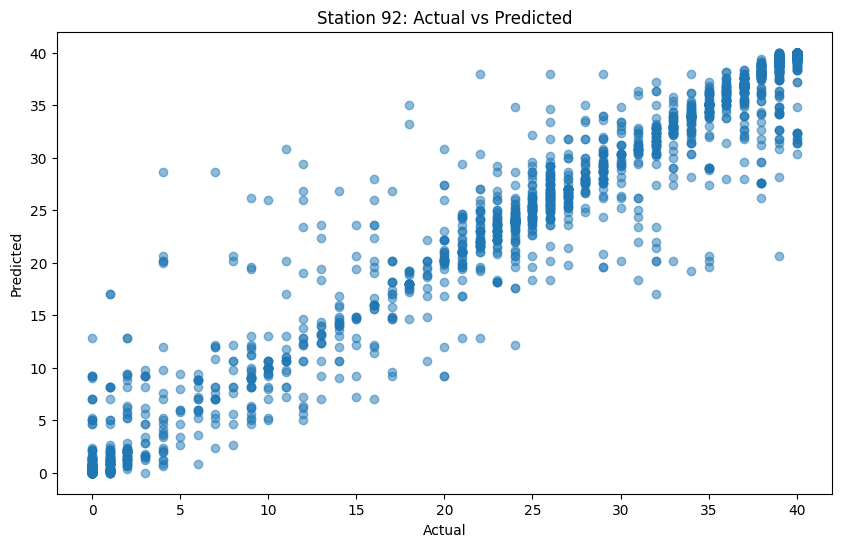

Number of predictions for station 93: 2507
Station 93 - Mean Squared Error: 12.135141603510172, R^2 Score: 0.9431470461142507
83.52612684483447
--------------------------------------------------
Covariance matrix for station 93:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.985252   11.745327    1.025580  -7.058945   0.0  0.331811   
feels_like   11.745327   16.333439   -0.117519  -6.272016   0.0  0.457804   
wind_speed    1.025580   -0.117519    3.394817  -3.340952   0.0 -0.012887   
humidity     -7.058945   -6.272016   -3.340952  81.763084   0.0  0.632561   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.331811    0.457804   -0.012887   0.632561   0.0  0.295372   
day           3.346185    5.044281   -1.544713 -16.102844   0.0 -3.596659   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

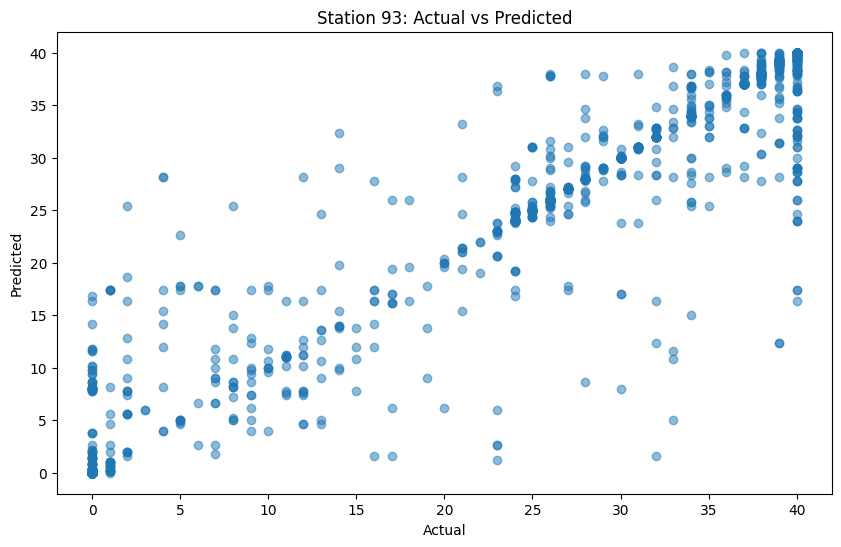

Number of predictions for station 94: 2480
Station 94 - Mean Squared Error: 2.9703387096774194, R^2 Score: 0.9760033889119267
88.66935483870968
--------------------------------------------------
Covariance matrix for station 94:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.945893   11.664397    1.068268  -6.967584   0.0  0.357022   
feels_like   11.664397   16.191584   -0.056862  -6.062007   0.0  0.493544   
wind_speed    1.068268   -0.056862    3.362059  -3.565320   0.0 -0.018785   
humidity     -6.967584   -6.062007   -3.565320  80.187074   0.0  0.556294   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.357022    0.493544   -0.018785   0.556294   0.0  0.295027   
day           2.575924    3.924108   -1.378050 -14.603452   0.0 -3.583776   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

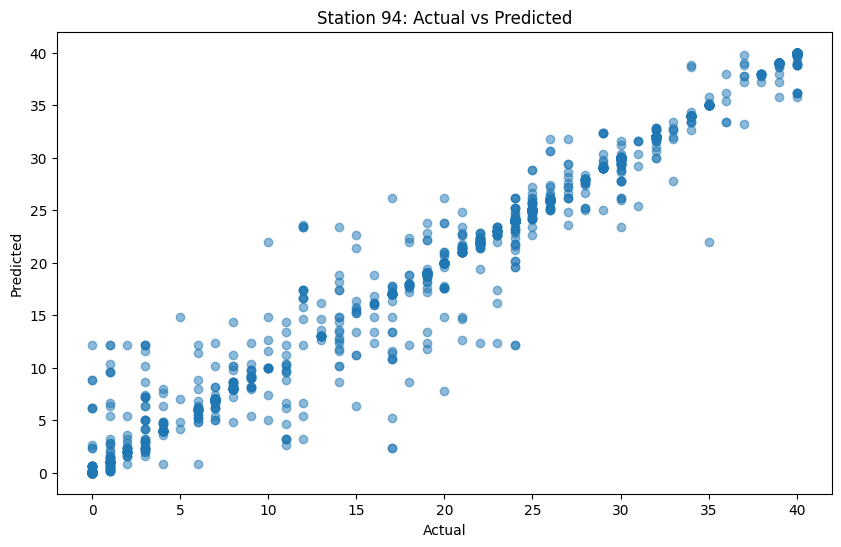

Number of predictions for station 95: 2742
Station 95 - Mean Squared Error: 2.4323559445660106, R^2 Score: 0.9716378612238256
74.36177972283005
--------------------------------------------------
Covariance matrix for station 95:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.999907   11.744362    1.100467  -6.754599   0.0  0.373410   
feels_like   11.744362   16.303218   -0.001643  -5.734832   0.0  0.512894   
wind_speed    1.100467   -0.001643    3.367064  -3.602544   0.0 -0.021218   
humidity     -6.754599   -5.734832   -3.602544  80.546255   0.0  0.536042   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.373410    0.512894   -0.021218   0.536042   0.0  0.296476   
day           2.591702    3.959612   -1.289249 -14.809491   0.0 -3.550853   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

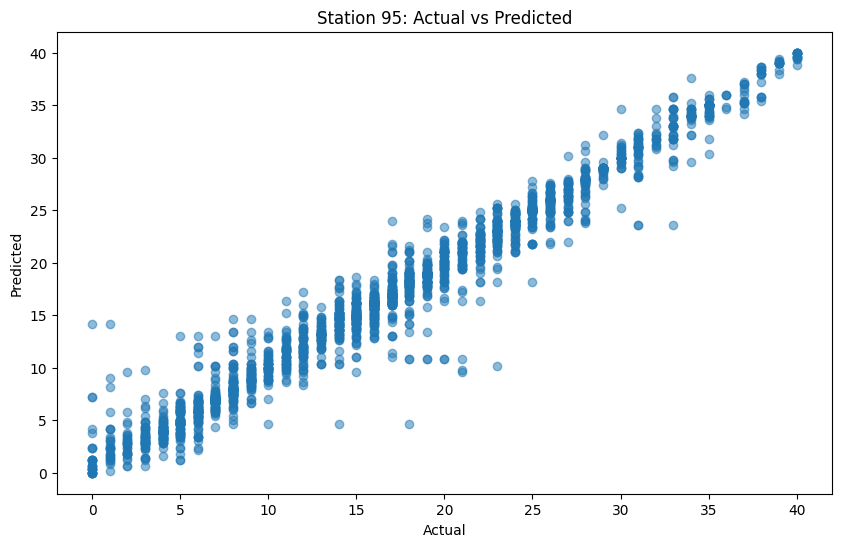

Number of predictions for station 96: 2380
Station 96 - Mean Squared Error: 1.2898655462184871, R^2 Score: 0.9743904857002026
89.32773109243698
--------------------------------------------------
Covariance matrix for station 96:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.070979   11.878841    1.063257  -6.933494   0.0  0.350471   
feels_like   11.878841   16.548351   -0.074841  -5.997631   0.0  0.484075   
wind_speed    1.063257   -0.074841    3.438329  -3.466965   0.0 -0.016941   
humidity     -6.933494   -5.997631   -3.466965  82.888947   0.0  0.567564   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.350471    0.484075   -0.016941   0.567564   0.0  0.294238   
day           2.993677    4.578326   -1.496343 -15.527623   0.0 -3.569041   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
d

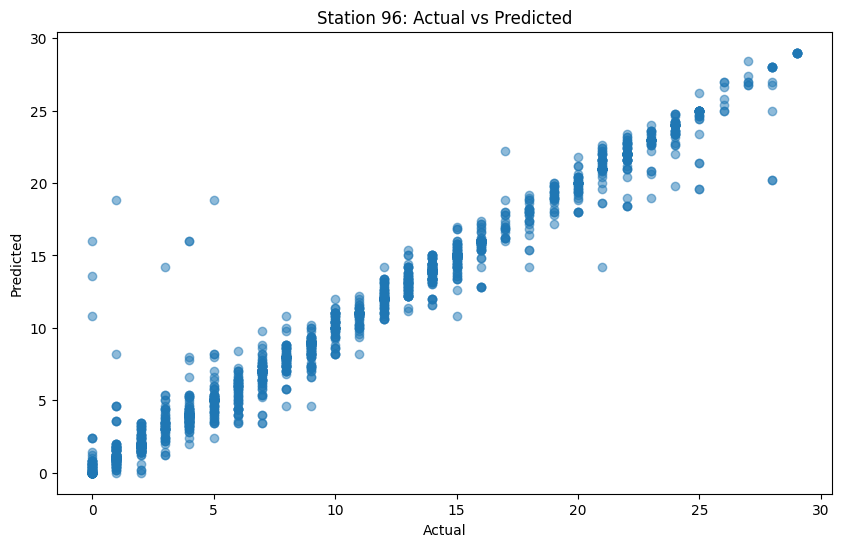

Number of predictions for station 97: 2673
Station 97 - Mean Squared Error: 6.087212869435092, R^2 Score: 0.9347384629351888
72.09128320239432
--------------------------------------------------
Covariance matrix for station 97:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.884852   11.629172    1.002067  -7.131691   0.0  0.365518   
feels_like   11.629172   16.203358   -0.137741  -6.270669   0.0  0.497462   
wind_speed    1.002067   -0.137741    3.382486  -3.460931   0.0 -0.004378   
humidity     -7.131691   -6.270669   -3.460931  83.572036   0.0  0.541310   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.365518    0.497462   -0.004378   0.541310   0.0  0.296534   
day           2.521062    3.989579   -1.568754 -14.121759   0.0 -3.589725   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

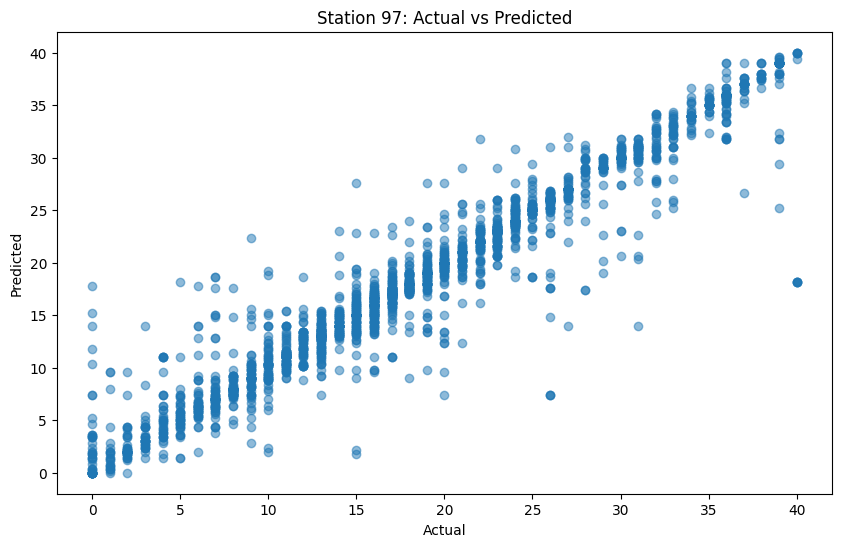

Number of predictions for station 98: 2613
Station 98 - Mean Squared Error: 2.2335859165709913, R^2 Score: 0.980348327070339
78.60696517412936
--------------------------------------------------
Covariance matrix for station 98:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.909006   11.667538    1.032216  -6.818921   0.0  0.364979   
feels_like   11.667538   16.250263   -0.072888  -5.803664   0.0  0.511807   
wind_speed    1.032216   -0.072888    3.358473  -3.527676   0.0 -0.030050   
humidity     -6.818921   -5.803664   -3.527676  83.062483   0.0  0.609984   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.364979    0.511807   -0.030050   0.609984   0.0  0.298875   
day           2.439957    3.641528   -1.184570 -14.814642   0.0 -3.599933   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
da

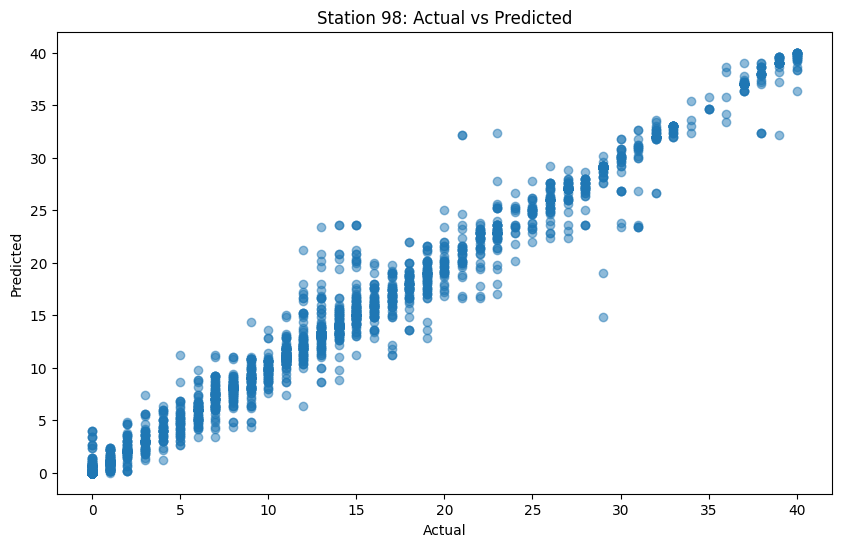

Number of predictions for station 99: 2615
Station 99 - Mean Squared Error: 1.73355258126195, R^2 Score: 0.9716786374350486
79.92351816443595
--------------------------------------------------
Covariance matrix for station 99:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.953875   11.684495    1.084142  -6.828820   0.0  0.355683   
feels_like   11.684495   16.212489   -0.003841  -5.849249   0.0  0.493859   
wind_speed    1.084142   -0.003841    3.337109  -3.540671   0.0 -0.023720   
humidity     -6.828820   -5.849249   -3.540671  81.699145   0.0  0.611324   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.355683    0.493859   -0.023720   0.611324   0.0  0.298188   
day           2.659818    3.957164   -1.200026 -15.301635   0.0 -3.608039   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
day

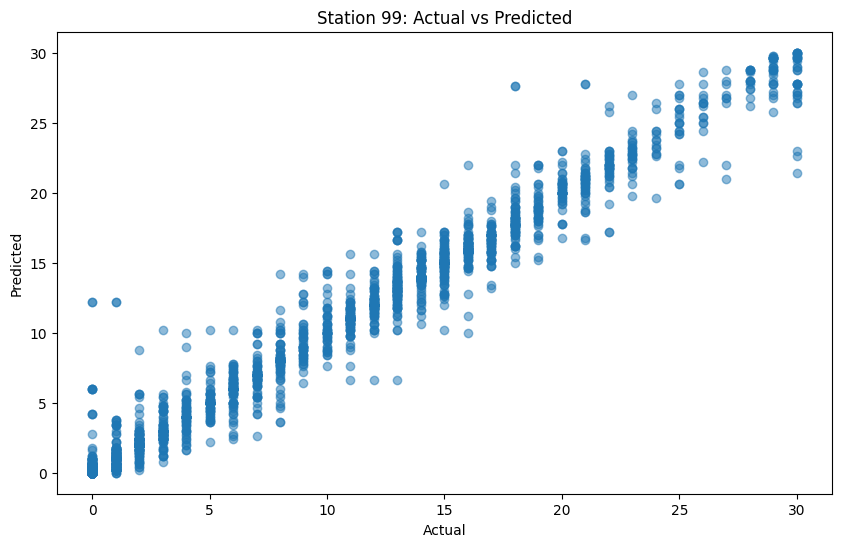

Number of predictions for station 100: 2754
Station 100 - Mean Squared Error: 6.306855482933915, R^2 Score: 0.9229602651473109
68.51851851851852
--------------------------------------------------
Covariance matrix for station 100:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.134889   11.953034    1.037185  -7.513082   0.0  0.369102   
feels_like   11.953034   16.611180   -0.074215  -6.770878   0.0  0.506657   
wind_speed    1.037185   -0.074215    3.375643  -3.383591   0.0 -0.019849   
humidity     -7.513082   -6.770878   -3.383591  84.480521   0.0  0.569989   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.369102    0.506657   -0.019849   0.569989   0.0  0.298656   
day           2.743993    4.150137   -1.276145 -15.564441   0.0 -3.600688   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

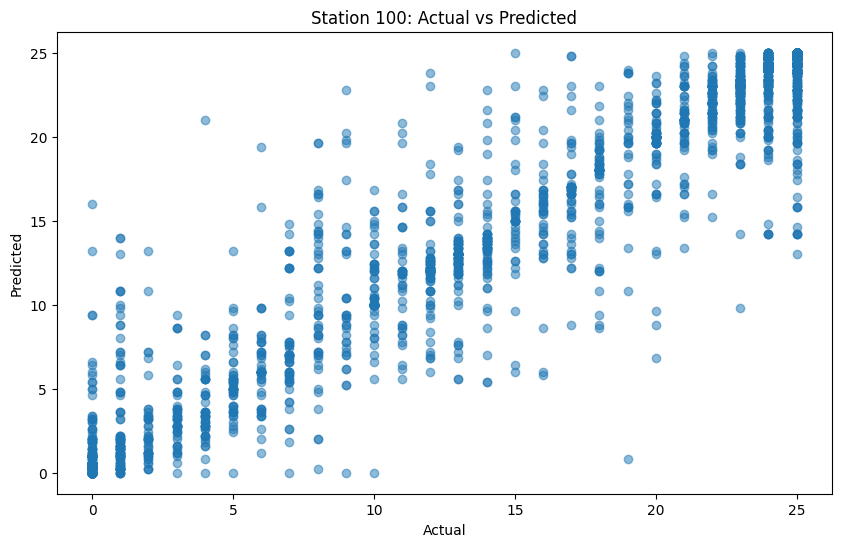

Number of predictions for station 101: 2672
Station 101 - Mean Squared Error: 1.4225898203592813, R^2 Score: 0.9646608077769316
75.78592814371258
--------------------------------------------------
Covariance matrix for station 101:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.061772   11.905614    1.000263  -6.804269   0.0  0.344909   
feels_like   11.905614   16.617848   -0.129316  -5.903455   0.0  0.477936   
wind_speed    1.000263   -0.129316    3.381090  -3.305327   0.0 -0.021280   
humidity     -6.804269   -5.903455   -3.305327  83.028674   0.0  0.607059   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.344909    0.477936   -0.021280   0.607059   0.0  0.294490   
day           3.088509    4.732690   -1.484029 -15.778527   0.0 -3.560291   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

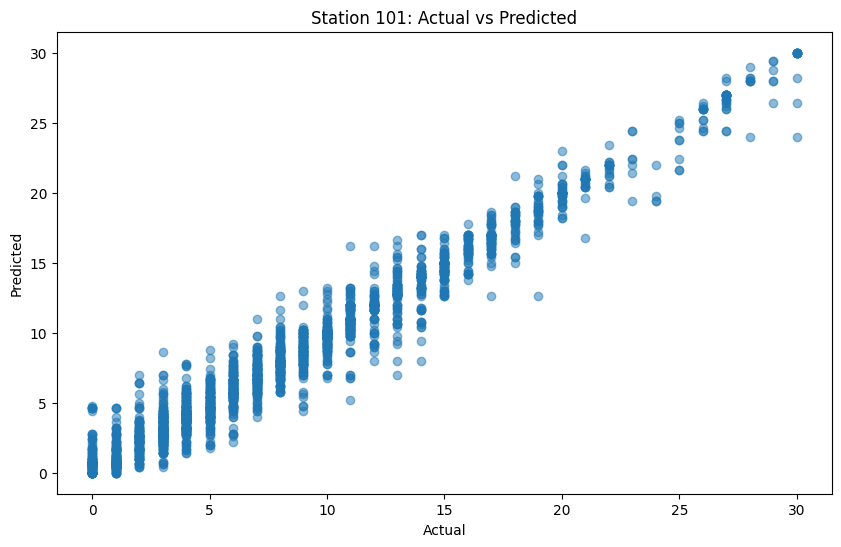

Number of predictions for station 102: 2528
Station 102 - Mean Squared Error: 3.9761392405063294, R^2 Score: 0.9246435248623047
79.86550632911393
--------------------------------------------------
Covariance matrix for station 102:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.027664   11.808873    1.025291  -7.316716   0.0  0.348635   
feels_like   11.808873   16.425786   -0.110300  -6.497747   0.0  0.471106   
wind_speed    1.025291   -0.110300    3.373820  -3.451419   0.0  0.000406   
humidity     -7.316716   -6.497747   -3.451419  85.944504   0.0  0.597947   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.348635    0.471106    0.000406   0.597947   0.0  0.296210   
day           3.014383    4.708675   -1.638796 -16.216465   0.0 -3.562977   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

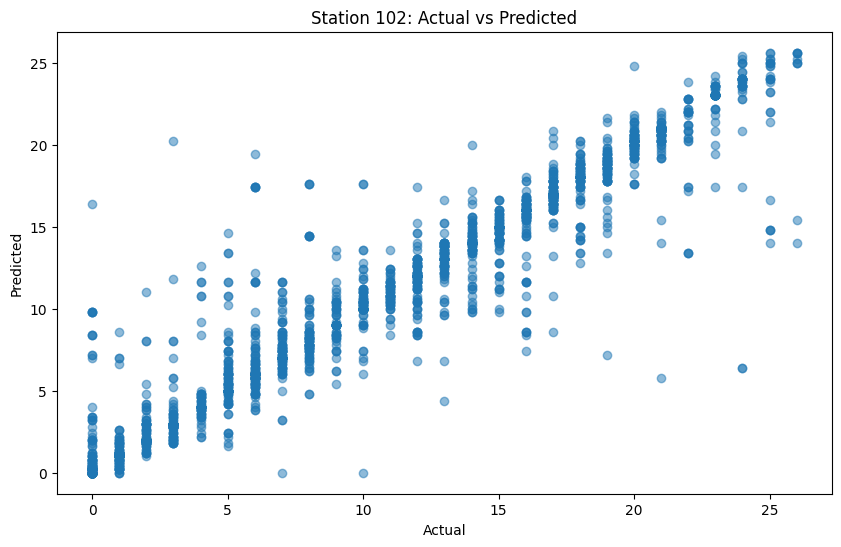

Number of predictions for station 103: 2528
Station 103 - Mean Squared Error: 1.1809810126582279, R^2 Score: 0.9527551848458324
84.65189873417721
--------------------------------------------------
Covariance matrix for station 103:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.908318   11.610092    1.069133  -7.520892   0.0  0.350470   
feels_like   11.610092   16.106974   -0.049355  -6.738467   0.0  0.481854   
wind_speed    1.069133   -0.049355    3.355905  -3.544236   0.0 -0.009151   
humidity     -7.520892   -6.738467   -3.544236  85.050910   0.0  0.592302   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.350470    0.481854   -0.009151   0.592302   0.0  0.296096   
day           2.792208    4.221585   -1.395019 -15.108502   0.0 -3.588107   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

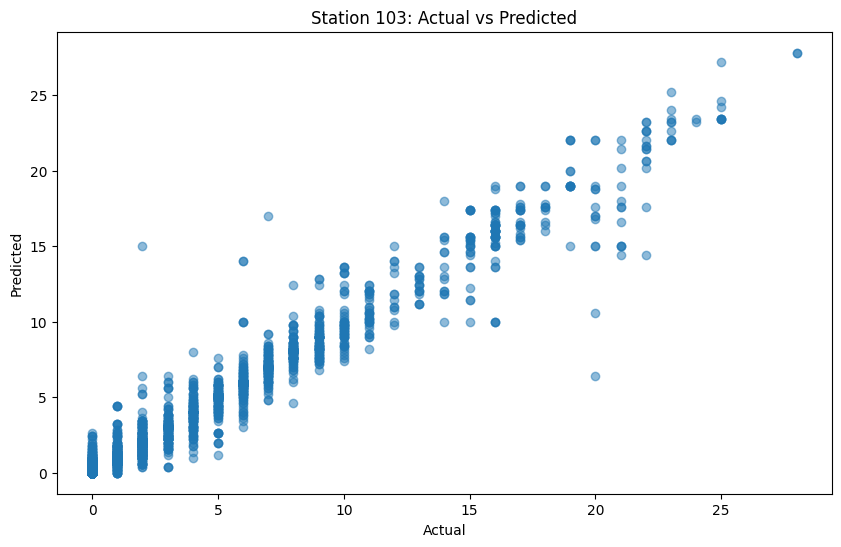

Number of predictions for station 104: 2405
Station 104 - Mean Squared Error: 1.041929313929314, R^2 Score: 0.9694641958892939
93.84615384615384
--------------------------------------------------
Covariance matrix for station 104:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.995710   11.704743    1.104175  -7.121660   0.0  0.355988   
feels_like   11.704743   16.206625   -0.008809  -6.267618   0.0  0.493126   
wind_speed    1.104175   -0.008809    3.358869  -3.645926   0.0 -0.023729   
humidity     -7.121660   -6.267618   -3.645926  80.471137   0.0  0.563890   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.355988    0.493126   -0.023729   0.563890   0.0  0.296156   
day           2.958148    4.364896   -1.217909 -15.134560   0.0 -3.620607   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

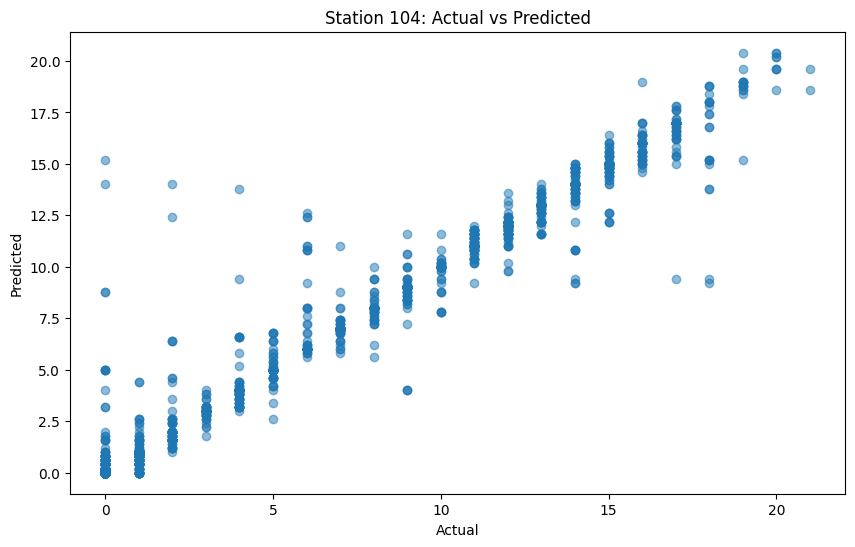

Number of predictions for station 105: 2467
Station 105 - Mean Squared Error: 1.5178921767328741, R^2 Score: 0.9572637902588798
90.79854073773814
--------------------------------------------------
Covariance matrix for station 105:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.024765   11.758393    1.151014  -6.737736   0.0  0.355001   
feels_like   11.758393   16.307101    0.045906  -5.707730   0.0  0.487599   
wind_speed    1.151014    0.045906    3.398103  -3.711700   0.0 -0.014657   
humidity     -6.737736   -5.707730   -3.711700  79.587864   0.0  0.574259   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.355001    0.487599   -0.014657   0.574259   0.0  0.294292   
day           2.937166    4.397204   -1.348777 -15.729064   0.0 -3.596721   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

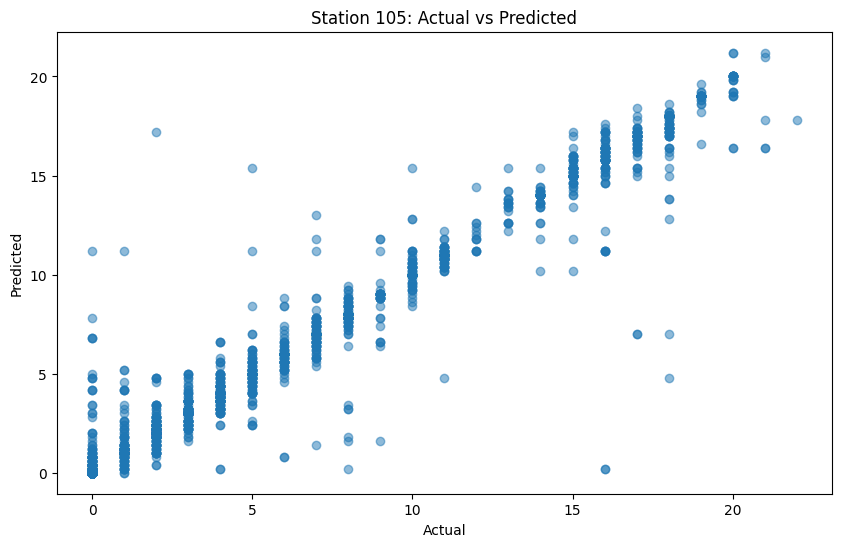

Number of predictions for station 106: 2514
Station 106 - Mean Squared Error: 4.828607796340493, R^2 Score: 0.909926279076302
79.59427207637232
--------------------------------------------------
Covariance matrix for station 106:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.995620   11.778383    0.988775  -7.223329   0.0  0.358517   
feels_like   11.778383   16.392951   -0.150528  -6.472253   0.0  0.494928   
wind_speed    0.988775   -0.150528    3.389130  -3.347753   0.0 -0.017861   
humidity     -7.223329   -6.472253   -3.347753  83.619469   0.0  0.597689   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.358517    0.494928   -0.017861   0.597689   0.0  0.297042   
day           2.937864    4.497440   -1.475965 -16.124871   0.0 -3.572548   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   


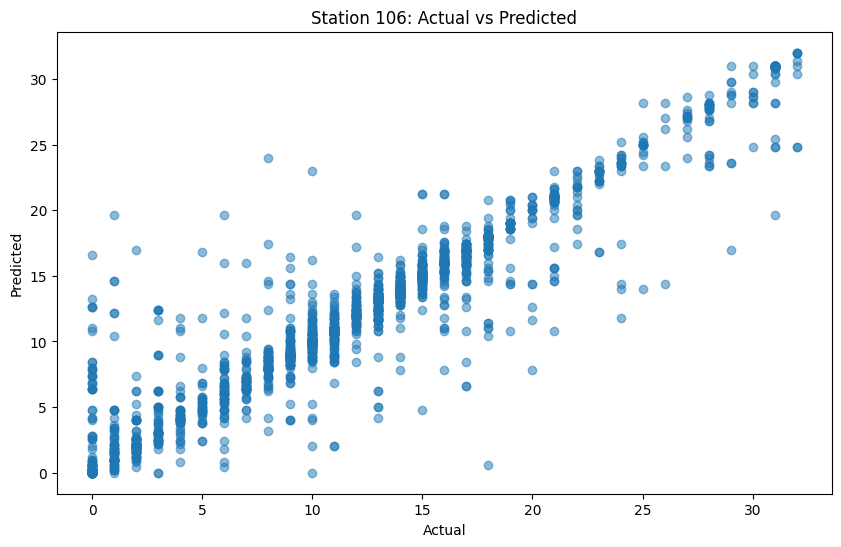

Number of predictions for station 107: 2598
Station 107 - Mean Squared Error: 3.6372132409545803, R^2 Score: 0.9354848988931469
77.63664357197845
--------------------------------------------------
Covariance matrix for station 107:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.035091   11.848641    1.064426  -7.135830   0.0  0.349128   
feels_like   11.848641   16.514450   -0.040374  -6.224491   0.0  0.480787   
wind_speed    1.064426   -0.040374    3.376685  -3.526919   0.0 -0.009250   
humidity     -7.135830   -6.224491   -3.526919  84.425099   0.0  0.620139   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.349128    0.480787   -0.009250   0.620139   0.0  0.293585   
day           2.916878    4.540524   -1.604684 -15.750143   0.0 -3.544921   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

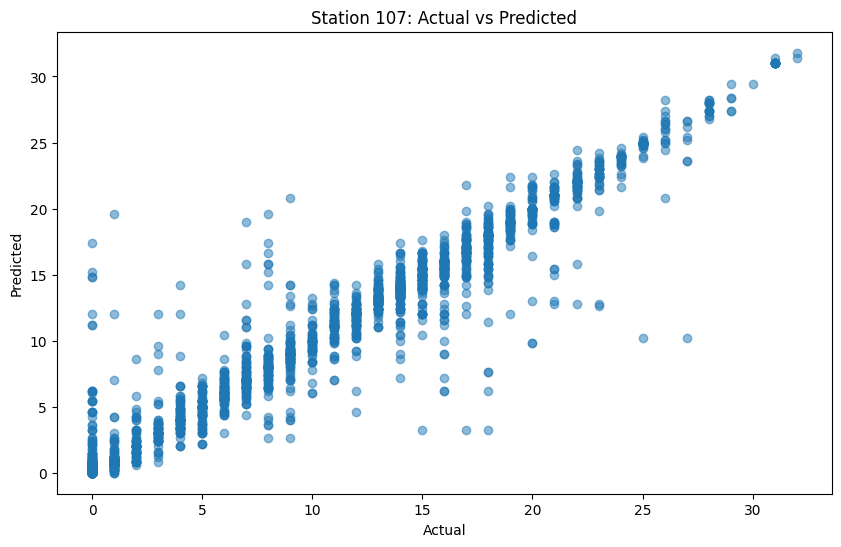

Number of predictions for station 108: 2614
Station 108 - Mean Squared Error: 3.779892884468248, R^2 Score: 0.9368871952262877
75.9372609028309
--------------------------------------------------
Covariance matrix for station 108:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.788053   11.497643    0.945674  -7.168634   0.0  0.353741   
feels_like   11.497643   16.016743   -0.222911  -6.259944   0.0  0.484434   
wind_speed    0.945674   -0.222911    3.375855  -3.641049   0.0 -0.010885   
humidity     -7.168634   -6.259944   -3.641049  82.851336   0.0  0.570814   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.353741    0.484434   -0.010885   0.570814   0.0  0.293995   
day           2.977459    4.555526   -1.538461 -15.435877   0.0 -3.561069   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   


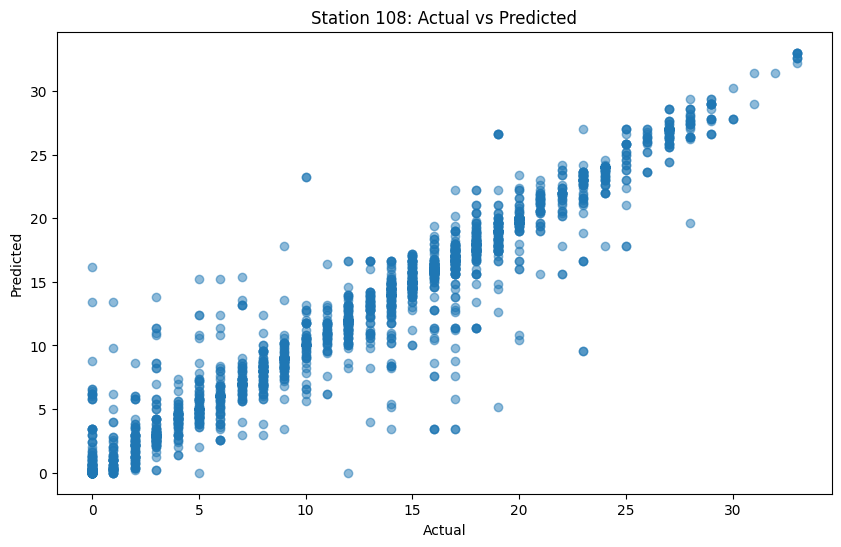

Number of predictions for station 109: 2686
Station 109 - Mean Squared Error: 1.9806701414743113, R^2 Score: 0.9698657421785647
78.70439314966492
--------------------------------------------------
Covariance matrix for station 109:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.958816   11.712893    1.077179  -6.804752   0.0  0.350146   
feels_like   11.712893   16.274313   -0.007259  -5.804553   0.0  0.483839   
wind_speed    1.077179   -0.007259    3.314586  -3.605430   0.0 -0.022712   
humidity     -6.804752   -5.804553   -3.605430  83.187698   0.0  0.516452   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.350146    0.483839   -0.022712   0.516452   0.0  0.296031   
day           2.830256    4.214361   -1.162467 -14.118956   0.0 -3.560582   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

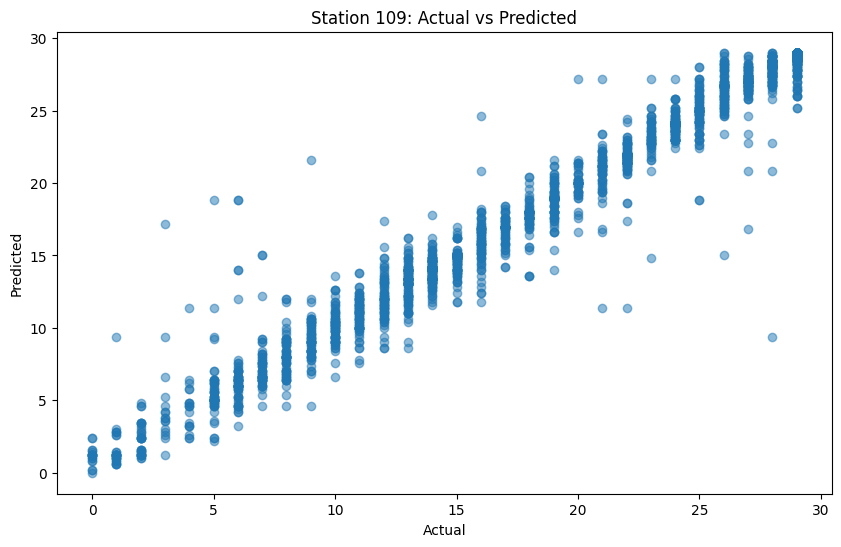

Number of predictions for station 110: 2568
Station 110 - Mean Squared Error: 2.715778816199377, R^2 Score: 0.9405263969422916
82.16510903426791
--------------------------------------------------
Covariance matrix for station 110:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.858418   11.534502    1.114845  -6.770501   0.0  0.366453   
feels_like   11.534502   16.000694    0.008186  -5.792114   0.0  0.507884   
wind_speed    1.114845    0.008186    3.365561  -3.623977   0.0 -0.024290   
humidity     -6.770501   -5.792114   -3.623977  80.565843   0.0  0.603179   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.366453    0.507884   -0.024290   0.603179   0.0  0.297175   
day           2.315949    3.519799   -1.213850 -14.714575   0.0 -3.566601   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

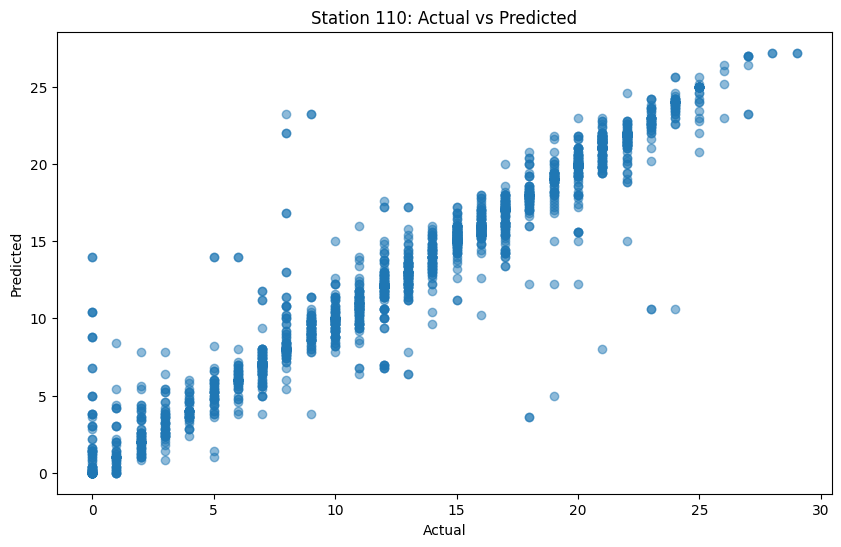

Number of predictions for station 111: 2645
Station 111 - Mean Squared Error: 1.1363931947069945, R^2 Score: 0.9521350916546142
79.20604914933837
--------------------------------------------------
Covariance matrix for station 111:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          8.986449   11.753583    0.992938  -7.427949   0.0  0.376325   
feels_like   11.753583   16.354973   -0.172624  -6.772096   0.0  0.513264   
wind_speed    0.992938   -0.172624    3.436236  -3.285057   0.0 -0.009707   
humidity     -7.427949   -6.772096   -3.285057  83.634601   0.0  0.568239   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.376325    0.513264   -0.009707   0.568239   0.0  0.297356   
day           2.405188    3.880306   -1.633655 -15.788150   0.0 -3.579433   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

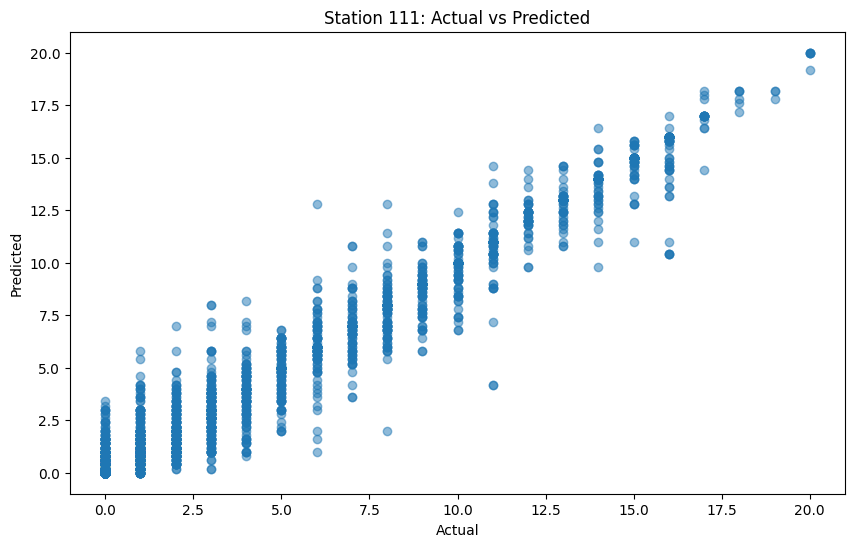

Number of predictions for station 112: 2870
Station 112 - Mean Squared Error: 4.8965435540069695, R^2 Score: 0.9541394812600212
61.18466898954704
--------------------------------------------------
Covariance matrix for station 112:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.100574   11.921509    1.028580  -7.190103   0.0  0.364620   
feels_like   11.921509   16.609767   -0.118932  -6.414576   0.0  0.498758   
wind_speed    1.028580   -0.118932    3.410879  -3.265163   0.0 -0.011572   
humidity     -7.190103   -6.414576   -3.265163  83.394212   0.0  0.489179   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.364620    0.498758   -0.011572   0.489179   0.0  0.295505   
day           2.755581    4.282946   -1.518340 -14.428316   0.0 -3.555800   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

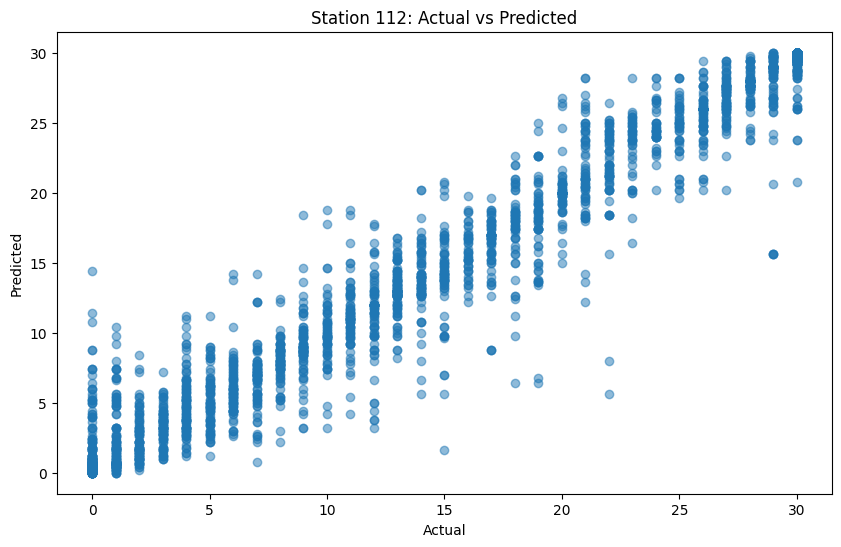

Number of predictions for station 113: 2438
Station 113 - Mean Squared Error: 0.7224774405250205, R^2 Score: 0.9828745679254183
88.1870385561936
--------------------------------------------------
Covariance matrix for station 113:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.165733   11.980844    1.056948  -7.056801   0.0  0.359703   
feels_like   11.980844   16.639824   -0.058753  -6.200830   0.0  0.493110   
wind_speed    1.056948   -0.058753    3.371517  -3.381417   0.0 -0.016916   
humidity     -7.056801   -6.200830   -3.381417  82.416935   0.0  0.603179   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.359703    0.493110   -0.016916   0.603179   0.0  0.298588   
day           2.835854    4.390744   -1.496832 -15.096442   0.0 -3.589119   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

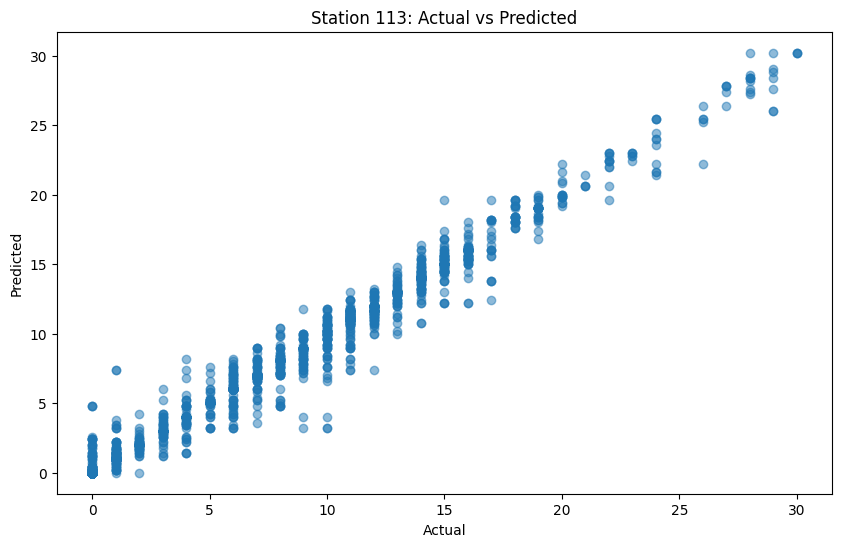

Number of predictions for station 114: 2793
Station 114 - Mean Squared Error: 7.122234156820624, R^2 Score: 0.9461614071085722
64.59004654493377
--------------------------------------------------
Covariance matrix for station 114:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.013863   11.721657    1.083021  -7.575842   0.0  0.379174   
feels_like   11.721657   16.217509   -0.029057  -6.758450   0.0  0.527865   
wind_speed    1.083021   -0.029057    3.327120  -3.541778   0.0 -0.020950   
humidity     -7.575842   -6.758450   -3.541778  85.236352   0.0  0.557930   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.379174    0.527865   -0.020950   0.557930   0.0  0.299257   
day           2.229543    3.254297   -1.122572 -15.166896   0.0 -3.561177   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

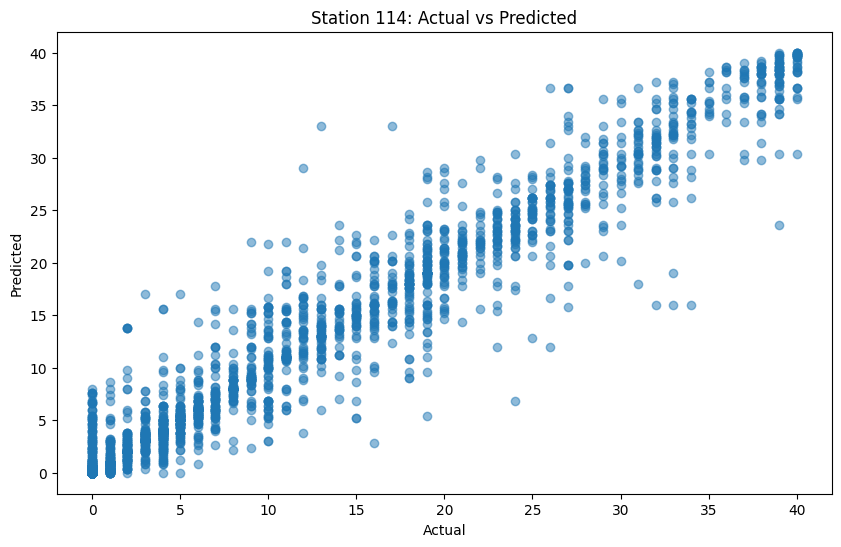

Number of predictions for station 115: 2940
Station 115 - Mean Squared Error: 3.658598639455782, R^2 Score: 0.9584774176343108
67.68707482993197
--------------------------------------------------
Covariance matrix for station 115:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.037089   11.853688    1.018871  -6.901066   0.0  0.368328   
feels_like   11.853688   16.500167   -0.071649  -6.004610   0.0  0.500939   
wind_speed    1.018871   -0.071649    3.324607  -3.349538   0.0 -0.014147   
humidity     -6.901066   -6.004610   -3.349538  83.128965   0.0  0.520038   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.368328    0.500939   -0.014147   0.520038   0.0  0.296533   
day           2.543892    4.001727   -1.394267 -13.827656   0.0 -3.546318   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

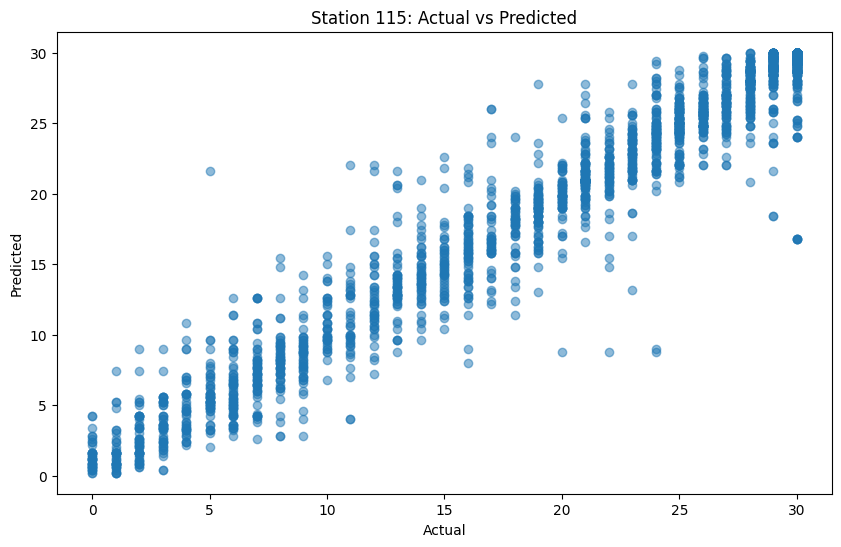

Number of predictions for station 116: 2396
Station 116 - Mean Squared Error: 1.4045242070116863, R^2 Score: 0.9501678331221857
89.98330550918196
--------------------------------------------------
Covariance matrix for station 116:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.125348   11.967525    1.046836  -7.255491   0.0  0.346904   
feels_like   11.967525   16.678745   -0.077896  -6.572227   0.0  0.471788   
wind_speed    1.046836   -0.077896    3.421061  -3.182554   0.0 -0.001196   
humidity     -7.255491   -6.572227   -3.182554  83.458392   0.0  0.617961   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.346904    0.471788   -0.001196   0.617961   0.0  0.297428   
day           3.138598    4.967918   -1.817707 -16.198924   0.0 -3.613873   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000  

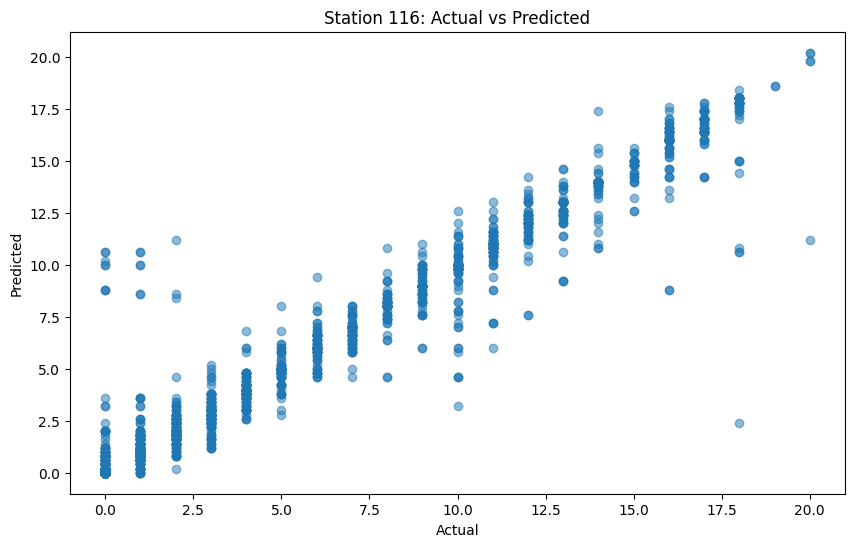

Number of predictions for station 117: 2518
Station 117 - Mean Squared Error: 4.387656870532168, R^2 Score: 0.9632244181742177
80.85782366957903
--------------------------------------------------
Covariance matrix for station 117:
                  temp  feels_like  wind_speed   humidity  year     month  \
temp          9.064921   11.877108    1.017830  -6.915372   0.0  0.348590   
feels_like   11.877108   16.530542   -0.100407  -5.975582   0.0  0.475235   
wind_speed    1.017830   -0.100407    3.387932  -3.377245   0.0 -0.009126   
humidity     -6.915372   -5.975582   -3.377245  83.686948   0.0  0.579841   
year          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
month         0.348590    0.475235   -0.009126   0.579841   0.0  0.293780   
day           2.952362    4.590081   -1.567118 -15.094302   0.0 -3.537672   
hour          0.000000    0.000000    0.000000   0.000000   0.0  0.000000   
minute        0.000000    0.000000    0.000000   0.000000   0.0  0.000000   

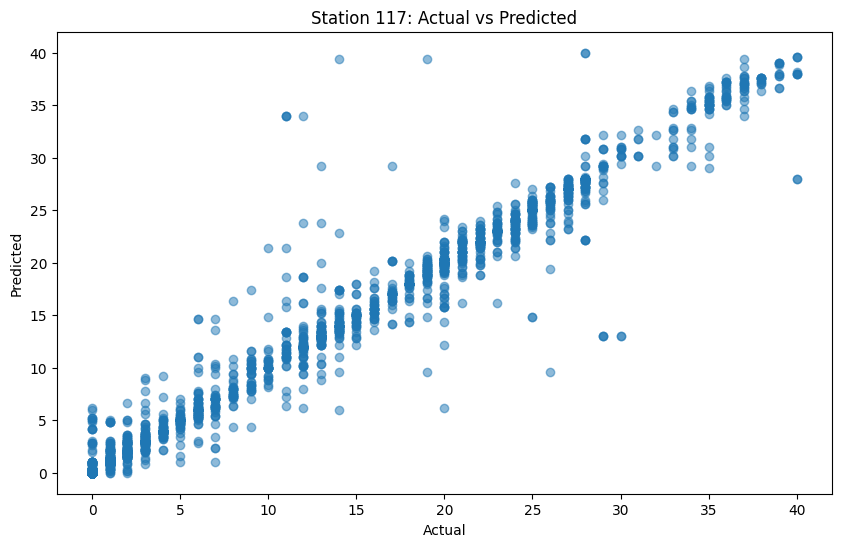

In [109]:
stations = df["number"].unique()

models = {}
if not os.path.exists("models_availability"):
    os.makedirs("models_availability")

for station in stations:
    df_station = df[df["number"] == station]

    X = df_station.drop(
        [
            "time",
            "date",
            "available_bikes",
            "number",
            "available_bike_stands",
            "lon",
            "lat",
            "id",
            "weather_description",
            "curr_time",
            "last_update",
        ],
        axis=1,
    )
    y = df_station["available_bikes"]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Serialize model
    dump(model, f"models_availability/model_availability{station}.joblib")

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    print(f"Number of predictions for station {station}: {len(y_pred)}")

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Station {station} - Mean Squared Error: {mse}, R^2 Score: {r2}")
    count = 0
    for i in range(len(y_pred)):
        if abs(y_pred[i] - y_test.iloc[i]) <= 1:
            count += 1
    print(count / len(y_pred) * 100)
    print("--------------------------------------------------")

    # Convert X_test back to a DataFrame
    X_test = pd.DataFrame(X_test, columns=X.columns)

    y_pred_rounded = np.round(y_pred)

    cov_matrix = np.cov(X_train, rowvar=False)
    cov_df = pd.DataFrame(cov_matrix, index=X.columns, columns=X.columns)
    print(f"Covariance matrix for station {station}:\n{cov_df}")

    newr2_score = model.score(X_test, y_test)
    print(f"new R^2 Score: {newr2_score}")

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred_rounded)
    print(f"Accuracy: {accuracy}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(f"Station {station}: Actual vs Predicted")
    plt.show()